# Sentiment Classification & How To "Frame Problems" for a Neural Network

### What You Should Already Know

- neural networks, forward and back-propagation
- stochastic gradient descent
- mean squared error
- and train/test splits


# Lesson: Curate a Dataset<a id='lesson_1'></a>
The cells from here until Project 1 include code Andrew shows in the videos leading up to mini project 1. We've included them so you can run the code along with the videos without having to type in everything.

In [1]:
def pretty_print_review_and_label(i):
    print(labels[i] + "\t:\t" + reviews[i][:80] + "...")

g = open('reviews.txt','r') # What we know!
reviews = list(map(lambda x:x[:-1],g.readlines()))
g.close()

g = open('labels.txt','r') # What we WANT to know!
labels = list(map(lambda x:x[:-1].upper(),g.readlines()))
g.close()

**Note:** The data in `reviews.txt` we're using has already been preprocessed a bit and contains only lower case characters. If we were working from raw data, where we didn't know it was all lower case, we would want to add a step here to convert it. That's so we treat different variations of the same word, like `The`, `the`, and `THE`, all the same way.

In [2]:
len(reviews)

25000

In [3]:
reviews[0]

'bromwell high is a cartoon comedy . it ran at the same time as some other programs about school life  such as  teachers  . my   years in the teaching profession lead me to believe that bromwell high  s satire is much closer to reality than is  teachers  . the scramble to survive financially  the insightful students who can see right through their pathetic teachers  pomp  the pettiness of the whole situation  all remind me of the schools i knew and their students . when i saw the episode in which a student repeatedly tried to burn down the school  i immediately recalled . . . . . . . . . at . . . . . . . . . . high . a classic line inspector i  m here to sack one of your teachers . student welcome to bromwell high . i expect that many adults of my age think that bromwell high is far fetched . what a pity that it isn  t   '

In [4]:
labels[0]

'POSITIVE'

# Lesson: Develop a Predictive Theory<a id='lesson_2'></a>

In [5]:
print("labels.txt \t : \t reviews.txt\n")
pretty_print_review_and_label(2137)
pretty_print_review_and_label(12816)
pretty_print_review_and_label(6267)
pretty_print_review_and_label(21934)
pretty_print_review_and_label(5297)
pretty_print_review_and_label(4998)

labels.txt 	 : 	 reviews.txt

NEGATIVE	:	this movie is terrible but it has some good effects .  ...
POSITIVE	:	adrian pasdar is excellent is this film . he makes a fascinating woman .  ...
NEGATIVE	:	comment this movie is impossible . is terrible  very improbable  bad interpretat...
POSITIVE	:	excellent episode movie ala pulp fiction .  days   suicides . it doesnt get more...
NEGATIVE	:	if you haven  t seen this  it  s terrible . it is pure trash . i saw this about ...
POSITIVE	:	this schiffer guy is a real genius  the movie is of excellent quality and both e...


# Project 1: Quick Theory Validation<a id='project_1'></a>

There are multiple ways to implement these projects, but in order to get your code closer to what Andrew shows in his solutions, we've provided some hints and starter code throughout this notebook.

You'll find the [Counter](https://docs.python.org/2/library/collections.html#collections.Counter) class to be useful in this exercise, as well as the [numpy](https://docs.scipy.org/doc/numpy/reference/) library.

In [6]:
from collections import Counter
import numpy as np

We'll create three `Counter` objects, one for words from positive reviews, one for words from negative reviews, and one for all the words.

In [7]:
# Create three Counter objects to store positive, negative and total counts
positive_counts = Counter()
negative_counts = Counter()
total_counts = Counter()

**TODO:** Examine all the reviews. For each word in a positive review, increase the count for that word in both your positive counter and the total words counter; likewise, for each word in a negative review, increase the count for that word in both your negative counter and the total words counter.

**Note:** Throughout these projects, you should use `split(' ')` to divide a piece of text (such as a review) into individual words. If you use `split()` instead, you'll get slightly different results than what the videos and solutions show.

In [12]:
# TODO: Loop over all the words in all the reviews and increment the counts in the appropriate counter objects
for i in range(len(reviews)):
    if(labels[i] == 'POSITIVE'):
        for word in reviews[i].split(" "):
            positive_counts[word] += 1
            total_counts[word] += 1
    else:
        for word in reviews[i].split(" "):
            negative_counts[word] += 1
            total_counts[word] += 1

Run the following two cells to list the words used in positive reviews and negative reviews, respectively, ordered from most to least commonly used. 

In [13]:
# Examine the counts of the most common words in positive reviews
positive_counts.most_common()

[('', 550468),
 ('the', 346648),
 ('.', 319308),
 ('and', 179444),
 ('a', 167376),
 ('of', 153710),
 ('to', 133492),
 ('is', 114490),
 ('in', 100430),
 ('br', 98470),
 ('it', 96050),
 ('i', 81486),
 ('that', 71260),
 ('this', 70160),
 ('s', 67630),
 ('as', 52616),
 ('with', 46494),
 ('for', 44832),
 ('was', 43834),
 ('film', 41874),
 ('but', 41644),
 ('movie', 38148),
 ('his', 34454),
 ('on', 34016),
 ('you', 33362),
 ('he', 32564),
 ('are', 29614),
 ('not', 28544),
 ('t', 27440),
 ('one', 27310),
 ('have', 25174),
 ('be', 24832),
 ('by', 23994),
 ('all', 23884),
 ('who', 22928),
 ('an', 22588),
 ('at', 22468),
 ('from', 21534),
 ('her', 20948),
 ('they', 19790),
 ('has', 18372),
 ('so', 18308),
 ('like', 18076),
 ('about', 16626),
 ('very', 16610),
 ('out', 16268),
 ('there', 16114),
 ('she', 15558),
 ('what', 15474),
 ('or', 15464),
 ('good', 15440),
 ('more', 15042),
 ('when', 14912),
 ('some', 14882),
 ('if', 14570),
 ('just', 14304),
 ('can', 14002),
 ('story', 13560),
 ('time', 1

In [14]:
# Examine the counts of the most common words in negative reviews
negative_counts.most_common()

[('', 561462),
 ('.', 335076),
 ('the', 326778),
 ('a', 158642),
 ('and', 148770),
 ('of', 138018),
 ('to', 137948),
 ('br', 105274),
 ('is', 100166),
 ('it', 96654),
 ('i', 93760),
 ('in', 87506),
 ('this', 81840),
 ('that', 75230),
 ('s', 63092),
 ('was', 52582),
 ('movie', 49930),
 ('for', 43854),
 ('but', 43562),
 ('with', 41756),
 ('as', 41250),
 ('t', 40722),
 ('film', 38436),
 ('you', 35098),
 ('on', 34384),
 ('not', 32708),
 ('have', 30288),
 ('are', 29246),
 ('be', 29082),
 ('he', 27712),
 ('one', 26268),
 ('they', 26022),
 ('at', 24558),
 ('his', 24294),
 ('all', 24072),
 ('so', 22926),
 ('like', 22476),
 ('there', 21550),
 ('just', 21238),
 ('by', 21098),
 ('or', 20544),
 ('an', 20532),
 ('who', 19938),
 ('from', 19462),
 ('if', 19036),
 ('about', 18122),
 ('out', 17958),
 ('what', 16844),
 ('some', 16612),
 ('no', 16286),
 ('her', 15894),
 ('even', 15374),
 ('can', 15306),
 ('has', 15208),
 ('good', 14846),
 ('bad', 14802),
 ('would', 14072),
 ('up', 13940),
 ('only', 13562

As you can see, common words like "the" appear very often in both positive and negative reviews. Instead of finding the most common words in positive or negative reviews, what you really want are the words found in positive reviews more often than in negative reviews, and vice versa. To accomplish this, you'll need to calculate the **ratios** of word usage between positive and negative reviews.

**TODO:** Check all the words you've seen and calculate the ratio of positive to negative uses and store that ratio in `pos_neg_ratios`. 
>Hint: the positive-to-negative ratio for a given word can be calculated with `positive_counts[word] / float(negative_counts[word]+1)`. Notice the `+1` in the denominator – that ensures we don't divide by zero for words that are only seen in positive reviews.

In [17]:
# Create Counter object to store positive/negative ratios
pos_neg_ratios = Counter()

# TODO: Calculate the ratios of positive and negative uses of the most common words
#       Consider words to be "common" if they've been used at least 100 times
for word, perc in list(total_counts.most_common()):
    if perc > 100:
        pos_neg_ratio = positive_counts[word] / float(negative_counts[word]+1)
        pos_neg_ratios[word] = pos_neg_ratio

Examine the ratios you've calculated for a few words:

In [18]:
print("Pos-to-neg ratio for 'the' = {}".format(pos_neg_ratios["the"]))
print("Pos-to-neg ratio for 'amazing' = {}".format(pos_neg_ratios["amazing"]))
print("Pos-to-neg ratio for 'terrible' = {}".format(pos_neg_ratios["terrible"]))

Pos-to-neg ratio for 'the' = 1.060802560752068
Pos-to-neg ratio for 'amazing' = 4.0304761904761905
Pos-to-neg ratio for 'terrible' = 0.17750628817822495


Looking closely at the values you just calculated, we see the following:

* Words that you would expect to see more often in positive reviews – like "amazing" – have a ratio greater than 1. The more skewed a word is toward postive, the farther from 1 its positive-to-negative ratio  will be.
* Words that you would expect to see more often in negative reviews – like "terrible" – have positive values that are less than 1. The more skewed a word is toward negative, the closer to zero its positive-to-negative ratio will be.
* Neutral words, which don't really convey any sentiment because you would expect to see them in all sorts of reviews – like "the" – have values very close to 1. A perfectly neutral word – one that was used in exactly the same number of positive reviews as negative reviews – would be almost exactly 1. The `+1` we suggested you add to the denominator slightly biases words toward negative, but it won't matter because it will be a tiny bias and later we'll be ignoring words that are too close to neutral anyway.

Ok, the ratios tell us which words are used more often in positive or negative reviews, but the specific values we've calculated are a bit difficult to work with. A very positive word like "amazing" has a value above 4, whereas a very negative word like "terrible" has a value around 0.18. Those values aren't easy to compare for a couple of reasons:

* Right now, 1 is considered neutral, but the absolute value of the postive-to-negative rations of very positive words is larger than the absolute value of the ratios for the very negative words. So there is no way to directly compare two numbers and see if one word conveys the same magnitude of positive sentiment as another word conveys negative sentiment. So we should center all the values around netural so the absolute value fro neutral of the postive-to-negative ratio for a word would indicate how much sentiment (positive or negative) that word conveys.
* When comparing absolute values it's easier to do that around zero than one. 

To fix these issues, we'll convert all of our ratios to new values using logarithms.

**TODO:** Go through all the ratios you calculated and convert them to logarithms. (i.e. use `np.log(ratio)`)

In the end, extremely positive and extremely negative words will have positive-to-negative ratios with similar magnitudes but opposite signs.

In [23]:
pos_neg_ratios

Counter({'': 0.9804172314115088,
         'the': 1.060802560752068,
         '.': 0.9529391751746613,
         'and': 1.2061759348260077,
         'a': 1.0550481269264953,
         'of': 1.1136872459588898,
         'to': 0.9676909582526876,
         'is': 1.1429912046881707,
         'br': 0.9353597720256471,
         'it': 0.9937406238683979,
         'in': 1.1476796142022925,
         'i': 0.8690820277087489,
         'this': 0.8572720274678951,
         'that': 0.9472159083356595,
         's': 1.0719097205712202,
         'was': 0.8336154270391571,
         'as': 1.2755084725218782,
         'for': 1.0222779614639153,
         'with': 1.1134420576190818,
         'movie': 0.7640143397889086,
         'but': 0.9559488556802791,
         'film': 1.0894190493534874,
         'you': 0.950511410581498,
         'on': 0.989268576414134,
         't': 0.6738206910099943,
         'not': 0.872665015744902,
         'he': 1.1750442030815862,
         'are': 1.0125482955516805,
         'hi

In [27]:
# TODO: Convert ratios to logs
for word, ratio in pos_neg_ratios.items():
    pos_neg_ratios[word] = np.log(ratio)

Examine the new ratios you've calculated for the same words from before:

In [28]:
print("Pos-to-neg ratio for 'the' = {}".format(pos_neg_ratios["the"]))
print("Pos-to-neg ratio for 'amazing' = {}".format(pos_neg_ratios["amazing"]))
print("Pos-to-neg ratio for 'terrible' = {}".format(pos_neg_ratios["terrible"]))

Pos-to-neg ratio for 'the' = 0.05902575442851183
Pos-to-neg ratio for 'amazing' = 1.3938845303865663
Pos-to-neg ratio for 'terrible' = -1.7287492443379682


If everything worked, now you should see neutral words with values close to zero. In this case, "the" is near zero but slightly positive, so it was probably used in more positive reviews than negative reviews. But look at "amazing"'s ratio - it's above `1`, showing it is clearly a word with positive sentiment. And "terrible" has a similar score, but in the opposite direction, so it's below `-1`. It's now clear that both of these words are associated with specific, opposing sentiments.

Now run the following cells to see more ratios. 

The first cell displays all the words, ordered by how associated they are with positive reviews. (Your notebook will most likely truncate the output so you won't actually see *all* the words in the list.)

The second cell displays the 30 words most associated with negative reviews by reversing the order of the first list and then looking at the first 30 words. (If you want the second cell to display all the words, ordered by how associated they are with negative reviews, you could just write `reversed(pos_neg_ratios.most_common())`.)

You should continue to see values similar to the earlier ones we checked – neutral words will be close to `0`, words will get more positive as their ratios approach and go above `1`, and words will get more negative as their ratios approach and go below `-1`. That's why we decided to use the logs instead of the raw ratios.

In [29]:
# words most frequently seen in a review with a "POSITIVE" label
pos_neg_ratios.most_common()

[('edie', 5.384495062789089),
 ('antwone', 5.170483995038151),
 ('din', 5.099866427824199),
 ('gunga', 4.882801922586371),
 ('goldsworthy', 4.867534450455582),
 ('gypo', 4.787491742782046),
 ('yokai', 4.787491742782046),
 ('visconti', 4.624972813284271),
 ('flavia', 4.624972813284271),
 ('paulie', 4.3652195163575005),
 ('gundam', 3.6054978451748854),
 ('iturbi', 3.5648268054439574),
 ('felix', 3.258096538021482),
 ('capote', 3.1945831322991562),
 ('excellently', 3.1612467120315646),
 ('fido', 3.1416861861770706),
 ('deanna', 3.109060958860994),
 ('hayworth', 3.109060958860994),
 ('vance', 3.077970371790963),
 ('kolchak', 3.0647251450409425),
 ('sammo', 3.0349529867072724),
 ('laputa', 3.0155349008501706),
 ('sox', 2.9667447366807385),
 ('alvin', 2.951929650895598),
 ('biko', 2.9385738597140425),
 ('polanski', 2.9103724246028344),
 ('mathieu', 2.906120114864304),
 ('matthau', 2.8638801424491884),
 ('gilliam', 2.8581108956779433),
 ('chavez', 2.772588722239781),
 ('harriet', 2.7725887222

In [31]:
# words most frequently seen in a review with a "NEGATIVE" label
list(reversed(pos_neg_ratios.most_common()))[0:30]

[('boll', -4.966335035199676),
 ('uwe', -4.620058798481842),
 ('thunderbirds', -4.119037174812472),
 ('beowulf', -4.102643365036796),
 ('dahmer', -3.979681653901961),
 ('wayans', -3.9219733362813143),
 ('seagal', -3.6408702349275757),
 ('gamera', -3.3232358401924436),
 ('dreck', -3.264486336120253),
 ('unwatchable', -3.253277251585533),
 ('stinker', -3.2037621870581527),
 ('mst', -2.9473586892697754),
 ('incoherent', -2.933096702562506),
 ('flimsy', -2.917770732084279),
 ('dillinger', -2.8233610476132043),
 ('yawn', -2.810907586541918),
 ('unfunny', -2.6902455764687034),
 ('waste', -2.6190165787318125),
 ('ugh', -2.6119063405493077),
 ('turd', -2.6119063405493077),
 ('blah', -2.5676928434072877),
 ('slugs', -2.5552874465498),
 ('tripe', -2.4918270926325743),
 ('horrid', -2.480266270231498),
 ('wtf', -2.4765384001174837),
 ('pointless', -2.4542326426031855),
 ('atrocious', -2.4231420555331544),
 ('damme', -2.404367787303988),
 ('redeeming', -2.366565422657453),
 ('prom', -2.356125859922

# End of Project 1. 

# Transforming Text into Numbers<a id='lesson_3'></a>
The cells here include code Andrew shows in the next video. We've included it so you can run the code along with the video without having to type in everything.

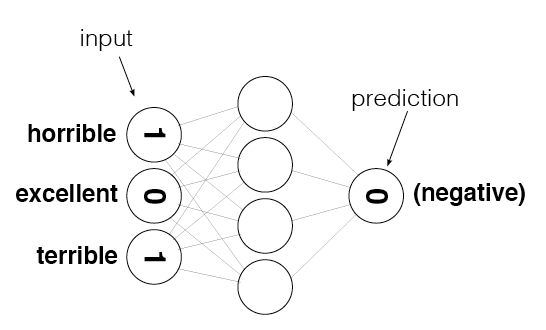

In [32]:
from IPython.display import Image

review = "This was a horrible, terrible movie."

Image(filename='sentiment_network.png')

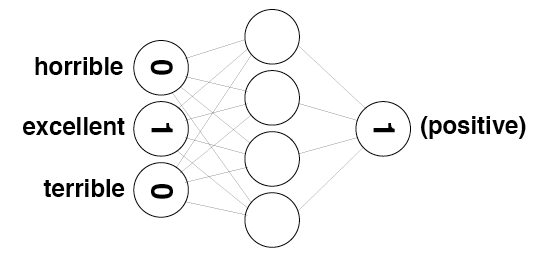

In [33]:
review = "The movie was excellent"

Image(filename='sentiment_network_pos.png')

# Project 2: Creating the Input/Output Data<a id='project_2'></a>

**TODO:** Create a [set](https://docs.python.org/3/tutorial/datastructures.html#sets) named `vocab` that contains every word in the vocabulary.

In [34]:
# TODO: Create set named "vocab" containing all of the words from all of the reviews
vocab = set(total_counts.keys())

Run the following cell to check your vocabulary size. If everything worked correctly, it should print **74074**

In [35]:
vocab_size = len(vocab)
print(vocab_size)

74074


Take a look at the following image. It represents the layers of the neural network you'll be building throughout this notebook. `layer_0` is the input layer, `layer_1` is a hidden layer, and `layer_2` is the output layer.

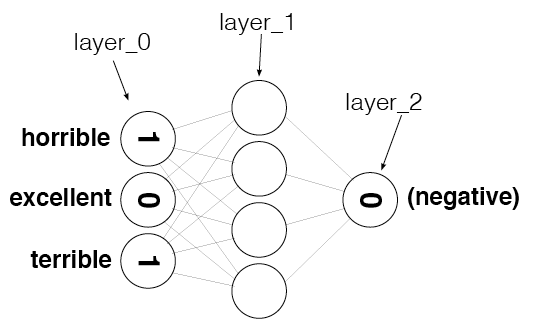

In [36]:
from IPython.display import Image
Image(filename='sentiment_network_2.png')

**TODO:** Create a numpy array called `layer_0` and initialize it to all zeros. You will find the [zeros](https://docs.scipy.org/doc/numpy/reference/generated/numpy.zeros.html) function particularly helpful here. Be sure you create `layer_0` as a 2-dimensional matrix with 1 row and `vocab_size` columns. 

In [37]:
# TODO: Create layer_0 matrix with dimensions 1 by vocab_size, initially filled with zeros
layer_0 = np.zeros((1, vocab_size))

Run the following cell. It should display `(1, 74074)`

In [38]:
layer_0.shape

(1, 74074)

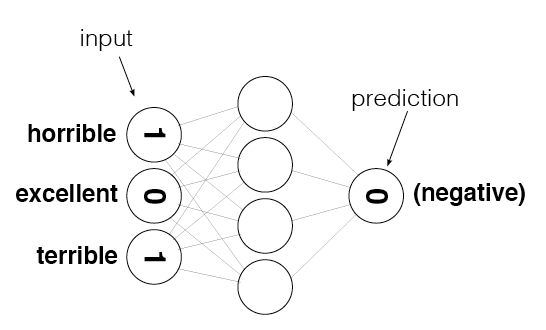

In [39]:
from IPython.display import Image
Image(filename='sentiment_network.png')

`layer_0` contains one entry for every word in the vocabulary, as shown in the above image. We need to make sure we know the index of each word, so run the following cell to create a lookup table that stores the index of every word.

In [40]:
# Create a dictionary of words in the vocabulary mapped to index positions
# (to be used in layer_0)
word2index = {}
for i,word in enumerate(vocab):
    word2index[word] = i
    
# display the map of words to indices
word2index

{'': 0,
 'busch': 1,
 'russianness': 2,
 'candies': 3,
 'subconsciously': 4,
 'warpath': 5,
 'overcharged': 6,
 'earliest': 7,
 'kaneko': 8,
 'gamorrean': 9,
 'brochure': 10,
 'prowling': 11,
 'macarthur': 12,
 'lazarushian': 13,
 'gashuin': 14,
 'loonies': 15,
 'plaques': 16,
 'pairs': 17,
 'deflowered': 18,
 'thrived': 19,
 'plotwise': 20,
 'henna': 21,
 'belligerent': 22,
 'exorcisms': 23,
 'journalist': 24,
 'flips': 25,
 'shuttle': 26,
 'frameworks': 27,
 'jellyfish': 28,
 'irvin': 29,
 'trumpeter': 30,
 'vulcans': 31,
 'masseuse': 32,
 'commit': 33,
 'exams': 34,
 'bobo': 35,
 'rumblefish': 36,
 'bathtub': 37,
 'maddy': 38,
 'libby': 39,
 'dumass': 40,
 'ulrike': 41,
 'graffiti': 42,
 'cranks': 43,
 'cheerleaders': 44,
 'spices': 45,
 'incoherrent': 46,
 'spurring': 47,
 'flam': 48,
 'sporchi': 49,
 'rocque': 50,
 'omigosh': 51,
 'gpa': 52,
 'stuntmen': 53,
 'nainital': 54,
 'laughworthy': 55,
 'kirilian': 56,
 'telling': 57,
 'conspirators': 58,
 'nagra': 59,
 'utilitarian': 60,

In [48]:
len(layer_0[0])

74074

**TODO:**  Complete the implementation of `update_input_layer`. It should count 
          how many times each word is used in the given review, and then store
          those counts at the appropriate indices inside `layer_0`.

In [49]:
def update_input_layer(review):
    """ Modify the global layer_0 to represent the vector form of review.
    The element at a given index of layer_0 should represent
    how many times the given word occurs in the review.
    Args:
        review(string) - the string of the review
    Returns:
        None
    """
    global layer_0
    # clear out previous state by resetting the layer to be all 0s
    layer_0 *= 0
    
    # TODO: count how many times each word is used in the given review and store the results in layer_0
    for word in review.split(' '):
        layer_0[0][word2index[word]] += 1 

Run the following cell to test updating the input layer with the first review. The indices assigned may not be the same as in the solution, but hopefully you'll see some non-zero values in `layer_0`.  

In [50]:
update_input_layer(reviews[0])
layer_0

array([[18.,  0.,  0., ...,  0.,  0.,  0.]])

**TODO:** Complete the implementation of `get_target_for_labels`. It should return `0` or `1`, 
          depending on whether the given label is `NEGATIVE` or `POSITIVE`, respectively.

In [51]:
def get_target_for_label(label):
    """Convert a label to `0` or `1`.
    Args:
        label(string) - Either "POSITIVE" or "NEGATIVE".
    Returns:
        `0` or `1`.
    """
    # TODO: Your code here
    if label == "POSITIVE":
        return 1
    else:
        return 0

Run the following two cells. They should print out`'POSITIVE'` and `1`, respectively.

In [52]:
labels[0]

'POSITIVE'

In [53]:
get_target_for_label(labels[0])

1

Run the following two cells. They should print out `'NEGATIVE'` and `0`, respectively.

In [54]:
labels[1]

'NEGATIVE'

In [55]:
get_target_for_label(labels[1])

0

# End of Project 2. 

# Project 3: Building a Neural Network<a id='project_3'></a>


- Create a basic neural network, with an input layer, a hidden layer, and an output layer. 
- Do **not** add a non-linearity in the hidden layer. That is, do not use an activation function when calculating the hidden layer outputs.
- Implement the `pre_process_data` function to create the vocabulary for our training data generating functions
- Ensure `train` trains over the entire corpus

In [56]:
import time
import sys
import numpy as np

# Encapsulate our neural network in a class
class SentimentNetwork:
    def __init__(self, reviews, labels, hidden_nodes = 10, learning_rate = 0.1):
        """Create a SentimenNetwork with the given settings
        Args:
            reviews(list) - List of reviews used for training
            labels(list) - List of POSITIVE/NEGATIVE labels associated with the given reviews
            hidden_nodes(int) - Number of nodes to create in the hidden layer
            learning_rate(float) - Learning rate to use while training
        
        """
        # Assign a seed to our random number generator to ensure we get
        # reproducible results during development 
        np.random.seed(1)

        # process the reviews and their associated labels so that everything
        # is ready for training
        self.pre_process_data(reviews, labels)
        
        # Build the network to have the number of hidden nodes and the learning rate that
        # were passed into this initializer. Make the same number of input nodes as
        # there are vocabulary words and create a single output node.
        self.init_network(len(self.review_vocab),hidden_nodes, 1, learning_rate)

    def pre_process_data(self, reviews, labels):
        
        review_vocab = set()
        # TODO: populate review_vocab with all of the words in the given reviews
        #       Remember to split reviews into individual words 
        #       using "split(' ')" instead of "split()".
        for review in reviews:
            for word in review.split(' '):
                review_vocab.add(word)
        # Convert the vocabulary set to a list so we can access words via indices
        self.review_vocab = list(review_vocab)
        
        label_vocab = set()
        # TODO: populate label_vocab with all of the words in the given labels.
        #       There is no need to split the labels because each one is a single word.
        for label in labels:
            label_vocab.add(label)
        # Convert the label vocabulary set to a list so we can access labels via indices
        self.label_vocab = list(label_vocab)
        
        # Store the sizes of the review and label vocabularies.
        self.review_vocab_size = len(self.review_vocab)
        self.label_vocab_size = len(self.label_vocab)
        
        # Create a dictionary of words in the vocabulary mapped to index positions
        self.word2index = {}
        # TODO: populate self.word2index with indices for all the words in self.review_vocab
        #       like you saw earlier in the notebook
        for idx, word in enumerate(self.review_vocab):
            self.word2index[word] = idx
            
        # Create a dictionary of labels mapped to index positions
        self.label2index = {}
        # TODO: do the same thing you did for self.word2index and self.review_vocab, 
        #       but for self.label2index and self.label_vocab instead
        for idx, label in enumerate(self.label_vocab):
            self.label2index[label] = idx
         
    def init_network(self, input_nodes, hidden_nodes, output_nodes, learning_rate):
        # Store the number of nodes in input, hidden, and output layers.
        self.input_nodes = input_nodes
        self.hidden_nodes = hidden_nodes
        self.output_nodes = output_nodes

        # Store the learning rate
        self.learning_rate = learning_rate

        # Initialize weights
        
        # TODO: initialize self.weights_0_1 as a matrix of zeros. These are the weights between
        #       the input layer and the hidden layer.
        self.weights_0_1 = np.zeros((self.input_nodes, self.hidden_nodes))
        
        # TODO: initialize self.weights_1_2 as a matrix of random values. 
        #       These are the weights between the hidden layer and the output layer.
        self.weights_1_2 = np.random.normal(0.0, self.output_nodes**-0.5, (self.hidden_nodes, self.output_nodes))
        
        # TODO: Create the input layer, a two-dimensional matrix with shape 
        #       1 x input_nodes, with all values initialized to zero
        self.layer_0 = np.zeros((1,input_nodes))
    
        
    def update_input_layer(self,review):
        # TODO: You can copy most of the code you wrote for update_input_layer 
        #       earlier in this notebook. 
        #
        #       However, MAKE SURE YOU CHANGE ALL VARIABLES TO REFERENCE
        #       THE VERSIONS STORED IN THIS OBJECT, NOT THE GLOBAL OBJECTS.
        #       For example, replace "layer_0 *= 0" with "self.layer_0 *= 0"
        self.layer_0 *= 0
        
        for word in review.split(' '):
            if word in self.word2index.keys():
                self.layer_0[0][self.word2index[word]] += 1
                
    def get_target_for_label(self,label):
        if(label == 'POSITIVE'):
            return 1
        else:
            return 0
        
    def sigmoid(self,x):
        return 1 / (1 + np.exp(-x))
    
    def sigmoid_output_2_derivative(self,output):
        return output * (1 - output)

    def train(self, training_reviews, training_labels):
        
        # make sure out we have a matching number of reviews and labels
        assert(len(training_reviews) == len(training_labels))
        
        # Keep track of correct predictions to display accuracy during training 
        correct_so_far = 0
        
        # Remember when we started for printing time statistics
        start = time.time()

        # loop through all the given reviews and run a forward and backward pass,
        # updating weights for every item
        for i in range(len(training_reviews)):
            
            # TODO: Get the next review and its correct label
            review = training_reviews[i]
            label = training_labels[i]
            
            # TODO: Implement the forward pass through the network. 
            #       That means use the given review to update the input layer, 
            #       then calculate values for the hidden layer,
            #       and finally calculate the output layer.
            # 
            #       Do not use an activation function for the hidden layer,
            #       but use the sigmoid activation function for the output layer.
            self.update_input_layer(review)
            layer_1 = self.layer_0.dot(self.weights_0_1)
            layer_2 = self.sigmoid(layer_1.dot(self.weights_1_2))
            # TODO: Implement the back propagation pass here. 
            #       That means calculate the error for the forward pass's prediction
            #       and update the weights in the network according to their
            #       contributions toward the error, as calculated via the
            #       gradient descent and back propagation algorithms you 
            #       learned in class.
            # Output error
            layer_2_error = layer_2 - get_target_for_label(label)
            layer_2_delta = layer_2_error * self.sigmoid_output_2_derivative(layer_2)
            
            # Backpropagated error
            layer_1_error = layer_2_delta.dot(self.weights_1_2.T) # errors propagated to the hidden layer
            layer_1_delta = layer_1_error # hidden layer gradients - no nonlinearity so it's the same as the error
            
            self.weights_1_2 -= layer_1.T.dot(layer_2_delta) * self.learning_rate # update hidden-to-output weights with gradient descent step
            self.weights_0_1 -= self.layer_0.T.dot(layer_1_delta) * self.learning_rate # update input-to-hidden weights with gradient descent step

            
            if(layer_2 >= 0.5 and label == 'POSITIVE'):
                correct_so_far += 1
            elif(layer_2 < 0.5 and label == 'NEGATIVE'):
                correct_so_far += 1
                
            # For debug purposes, print out our prediction accuracy and speed 
            # throughout the training process. 

            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0
            
            sys.stdout.write("\rProgress:" + str(100 * i/float(len(training_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct_so_far) + " #Trained:" + str(i+1) \
                             + " Training Accuracy:" + str(correct_so_far * 100 / float(i+1))[:4] + "%")
            if(i % 2500 == 0):
                print("")
    
    def test(self, testing_reviews, testing_labels):
        """
        Attempts to predict the labels for the given testing_reviews,
        and uses the test_labels to calculate the accuracy of those predictions.
        """
        
        # keep track of how many correct predictions we make
        correct = 0

        # we'll time how many predictions per second we make
        start = time.time()

        # Loop through each of the given reviews and call run to predict
        # its label. 
        for i in range(len(testing_reviews)):
            pred = self.run(testing_reviews[i])
            if(pred == testing_labels[i]):
                correct += 1
            
            # For debug purposes, print out our prediction accuracy and speed 
            # throughout the prediction process. 

            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0
            
            sys.stdout.write("\rProgress:" + str(100 * i/float(len(testing_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct) + " #Tested:" + str(i+1) \
                             + " Testing Accuracy:" + str(correct * 100 / float(i+1))[:4] + "%")
    
    def run(self, review):
        """
        Returns a POSITIVE or NEGATIVE prediction for the given review.
        """
        # TODO: Run a forward pass through the network, like you did in the
        #       "train" function. That means use the given review to 
        #       update the input layer, then calculate values for the hidden layer,
        #       and finally calculate the output layer.
        #
        #       Note: The review passed into this function for prediction 
        #             might come from anywhere, so you should convert it 
        #             to lower case prior to using it.
        self.update_input_layer(review.lower())
        
        layer_1 = self.layer_0.dot(self.weights_0_1)

        # Output layer
        layer_2 = self.sigmoid(layer_1.dot(self.weights_1_2))
        
        # Return POSITIVE for values above greater-than-or-equal-to 0.5 in the output layer;
        # return NEGATIVE for other values
        if(layer_2[0] >= 0.5):
            return "POSITIVE"
        else:
            return "NEGATIVE"


Run the following cell to create a `SentimentNetwork` that will train on all but the last 1000 reviews (we're saving those for testing). Here we use a learning rate of `0.1`.

In [57]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000], learning_rate=0.1)

Run the following cell to test the network's performance against the last 1000 reviews (the ones we held out from our training set). 

**We have not trained the model yet, so the results should be about 50% as it will just be guessing and there are only two possible values to choose from.**

In [58]:
mlp.test(reviews[-1000:],labels[-1000:])

Progress:10.5% Speed(reviews/sec):271.3 #Correct:53 #Tested:106 Testing Accuracy:50.0%

Progress:25.5% Speed(reviews/sec):444.4 #Correct:128 #Tested:256 Testing Accuracy:50.0%

Progress:40.2% Speed(reviews/sec):526.7 #Correct:202 #Tested:403 Testing Accuracy:50.1%

Progress:53.4% Speed(reviews/sec):562.3 #Correct:268 #Tested:535 Testing Accuracy:50.0%

Progress:68.8% Speed(reviews/sec):605.2 #Correct:345 #Tested:689 Testing Accuracy:50.0%

Progress:83.6% Speed(reviews/sec):630.3 #Correct:419 #Tested:837 Testing Accuracy:50.0%

Progress:97.4% Speed(reviews/sec):643.9 #Correct:488 #Tested:975 Testing Accuracy:50.0%

Progress:99.9% Speed(reviews/sec):640.6 #Correct:500 #Tested:1000 Testing Accuracy:50.0%

Run the following cell to actually train the network. During training, it will display the model's accuracy repeatedly as it trains so you can see how well it's doing.

In [59]:
mlp.train(reviews[:-1000],labels[:-1000])

Progress:0.0% Speed(reviews/sec):0.0 #Correct:1 #Trained:1 Training Accuracy:100.%
Progress:10.4% Speed(reviews/sec):117.7 #Correct:1251 #Trained:2501 Training Accuracy:50.0%
Progress:20.8% Speed(reviews/sec):117.8 #Correct:2501 #Trained:5001 Training Accuracy:50.0%
Progress:31.2% Speed(reviews/sec):118.3 #Correct:3751 #Trained:7501 Training Accuracy:50.0%
Progress:41.6% Speed(reviews/sec):118.7 #Correct:5001 #Trained:10001 Training Accuracy:50.0%
Progress:52.0% Speed(reviews/sec):118.9 #Correct:6251 #Trained:12501 Training Accuracy:50.0%
Progress:62.5% Speed(reviews/sec):119.0 #Correct:7501 #Trained:15001 Training Accuracy:50.0%
Progress:72.9% Speed(reviews/sec):118.9 #Correct:8751 #Trained:17501 Training Accuracy:50.0%
Progress:83.3% Speed(reviews/sec):118.9 #Correct:10001 #Trained:20001 Training Accuracy:50.0%
Progress:93.7% Speed(reviews/sec):118.9 #Correct:11251 #Trained:22501 Training Accuracy:50.0%
Progress:99.9% Speed(reviews/sec):118.9 #Correct:12000 #Trained:24000 Training Ac

That most likely didn't train very well. Part of the reason may be because the learning rate is too high. Run the following cell to recreate the network with a smaller learning rate, `0.01`, and then train the new network.

In [60]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000], learning_rate=0.01)
mlp.train(reviews[:-1000],labels[:-1000])

Progress:0.0% Speed(reviews/sec):0.0 #Correct:1 #Trained:1 Training Accuracy:100.%
Progress:10.4% Speed(reviews/sec):119.3 #Correct:1248 #Trained:2501 Training Accuracy:49.9%
Progress:20.8% Speed(reviews/sec):118.8 #Correct:2498 #Trained:5001 Training Accuracy:49.9%
Progress:31.2% Speed(reviews/sec):118.4 #Correct:3748 #Trained:7501 Training Accuracy:49.9%
Progress:41.6% Speed(reviews/sec):118.1 #Correct:4998 #Trained:10001 Training Accuracy:49.9%
Progress:52.0% Speed(reviews/sec):117.0 #Correct:6248 #Trained:12501 Training Accuracy:49.9%
Progress:62.5% Speed(reviews/sec):115.3 #Correct:7489 #Trained:15001 Training Accuracy:49.9%
Progress:72.9% Speed(reviews/sec):115.3 #Correct:8739 #Trained:17501 Training Accuracy:49.9%
Progress:83.3% Speed(reviews/sec):115.6 #Correct:9989 #Trained:20001 Training Accuracy:49.9%
Progress:93.7% Speed(reviews/sec):115.7 #Correct:11239 #Trained:22501 Training Accuracy:49.9%
Progress:99.9% Speed(reviews/sec):115.6 #Correct:11988 #Trained:24000 Training Acc

That probably wasn't much different. Run the following cell to recreate the network one more time with an even smaller learning rate, `0.001`, and then train the new network.

In [61]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000], learning_rate=0.001)
mlp.train(reviews[:-1000],labels[:-1000])

Progress:0.0% Speed(reviews/sec):0.0 #Correct:1 #Trained:1 Training Accuracy:100.%
Progress:10.4% Speed(reviews/sec):119.1 #Correct:1266 #Trained:2501 Training Accuracy:50.6%
Progress:20.8% Speed(reviews/sec):119.1 #Correct:2590 #Trained:5001 Training Accuracy:51.7%
Progress:31.2% Speed(reviews/sec):118.5 #Correct:3998 #Trained:7501 Training Accuracy:53.2%
Progress:41.6% Speed(reviews/sec):118.4 #Correct:5513 #Trained:10001 Training Accuracy:55.1%
Progress:52.0% Speed(reviews/sec):118.5 #Correct:7119 #Trained:12501 Training Accuracy:56.9%
Progress:62.5% Speed(reviews/sec):117.9 #Correct:8729 #Trained:15001 Training Accuracy:58.1%
Progress:72.9% Speed(reviews/sec):117.9 #Correct:10384 #Trained:17501 Training Accuracy:59.3%
Progress:83.3% Speed(reviews/sec):117.9 #Correct:12091 #Trained:20001 Training Accuracy:60.4%
Progress:93.7% Speed(reviews/sec):117.5 #Correct:13770 #Trained:22501 Training Accuracy:61.1%
Progress:99.9% Speed(reviews/sec):117.6 #Correct:14834 #Trained:24000 Training A

With a learning rate of `0.001`, the network should finall have started to improve during training. It's still not very good, but it shows that this solution has potential. We will improve it in the next lesson.

# End of Project 3. 
## Watch the next video to see Andrew's solution, then continue on to the next lesson.

# Understanding Neural Noise<a id='lesson_4'></a>

The following cells include includes the code Andrew shows in the next video. We've included it here so you can run the cells along with the video without having to type in everything.

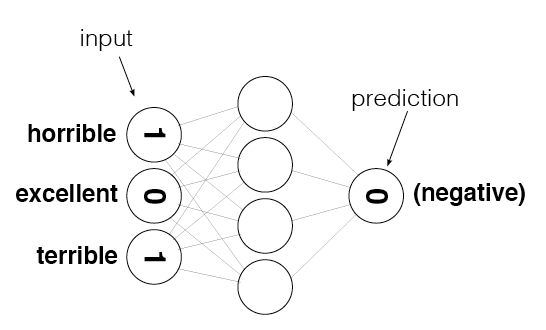

In [62]:
from IPython.display import Image
Image(filename='sentiment_network.png')

In [ ]:
def update_input_layer(review):
    
    global layer_0
    
    # clear out previous state, reset the layer to be all 0s
    layer_0 *= 0
    for word in review.split(" "):
        layer_0[0][word2index[word]] += 1

update_input_layer(reviews[0])

In [ ]:
layer_0

In [ ]:
review_counter = Counter()

In [ ]:
for word in reviews[0].split(" "):
    review_counter[word] += 1

In [ ]:
review_counter.most_common()

# Project 4: Reducing Noise in Our Input Data<a id='project_4'></a>

**TODO:** Attempt to reduce the noise in the input data like Andrew did in the previous video. Specifically, do the following:
* Copy the `SentimentNetwork` class you created earlier into the following cell.
* Modify `update_input_layer` so it does not count how many times each word is used, but rather just stores whether or not a word was used. 

In [63]:
import time
import sys
import numpy as np

# Encapsulate our neural network in a class
class SentimentNetwork:
    def __init__(self, reviews, labels, hidden_nodes = 10, learning_rate = 0.1):
        """Create a SentimenNetwork with the given settings
        Args:
            reviews(list) - List of reviews used for training
            labels(list) - List of POSITIVE/NEGATIVE labels associated with the given reviews
            hidden_nodes(int) - Number of nodes to create in the hidden layer
            learning_rate(float) - Learning rate to use while training
        
        """
        # Assign a seed to our random number generator to ensure we get
        # reproducible results during development 
        np.random.seed(1)

        # process the reviews and their associated labels so that everything
        # is ready for training
        self.pre_process_data(reviews, labels)
        
        # Build the network to have the number of hidden nodes and the learning rate that
        # were passed into this initializer. Make the same number of input nodes as
        # there are vocabulary words and create a single output node.
        self.init_network(len(self.review_vocab),hidden_nodes, 1, learning_rate)

    def pre_process_data(self, reviews, labels):
        
        review_vocab = set()
        # TODO: populate review_vocab with all of the words in the given reviews
        #       Remember to split reviews into individual words 
        #       using "split(' ')" instead of "split()".
        for review in reviews:
            for word in review.split(' '):
                review_vocab.add(word)
        # Convert the vocabulary set to a list so we can access words via indices
        self.review_vocab = list(review_vocab)
        
        label_vocab = set()
        # TODO: populate label_vocab with all of the words in the given labels.
        #       There is no need to split the labels because each one is a single word.
        for label in labels:
            label_vocab.add(label)
        # Convert the label vocabulary set to a list so we can access labels via indices
        self.label_vocab = list(label_vocab)
        
        # Store the sizes of the review and label vocabularies.
        self.review_vocab_size = len(self.review_vocab)
        self.label_vocab_size = len(self.label_vocab)
        
        # Create a dictionary of words in the vocabulary mapped to index positions
        self.word2index = {}
        # TODO: populate self.word2index with indices for all the words in self.review_vocab
        #       like you saw earlier in the notebook
        for idx, word in enumerate(self.review_vocab):
            self.word2index[word] = idx
            
        # Create a dictionary of labels mapped to index positions
        self.label2index = {}
        # TODO: do the same thing you did for self.word2index and self.review_vocab, 
        #       but for self.label2index and self.label_vocab instead
        for idx, label in enumerate(self.label_vocab):
            self.label2index[label] = idx
         
    def init_network(self, input_nodes, hidden_nodes, output_nodes, learning_rate):
        # Store the number of nodes in input, hidden, and output layers.
        self.input_nodes = input_nodes
        self.hidden_nodes = hidden_nodes
        self.output_nodes = output_nodes

        # Store the learning rate
        self.learning_rate = learning_rate

        # Initialize weights
        
        # TODO: initialize self.weights_0_1 as a matrix of zeros. These are the weights between
        #       the input layer and the hidden layer.
        self.weights_0_1 = np.zeros((self.input_nodes, self.hidden_nodes))
        
        # TODO: initialize self.weights_1_2 as a matrix of random values. 
        #       These are the weights between the hidden layer and the output layer.
        self.weights_1_2 = np.random.normal(0.0, self.output_nodes**-0.5, (self.hidden_nodes, self.output_nodes))
        
        # TODO: Create the input layer, a two-dimensional matrix with shape 
        #       1 x input_nodes, with all values initialized to zero
        self.layer_0 = np.zeros((1,input_nodes))
    
        
    def update_input_layer(self,review):
        # TODO: You can copy most of the code you wrote for update_input_layer 
        #       earlier in this notebook. 
        #
        #       However, MAKE SURE YOU CHANGE ALL VARIABLES TO REFERENCE
        #       THE VERSIONS STORED IN THIS OBJECT, NOT THE GLOBAL OBJECTS.
        #       For example, replace "layer_0 *= 0" with "self.layer_0 *= 0"
        self.layer_0 *= 0
        
        for word in review.split(' '):
            if word in self.word2index.keys():
                self.layer_0[0][self.word2index[word]] = 1
                
    def get_target_for_label(self,label):
        if(label == 'POSITIVE'):
            return 1
        else:
            return 0
        
    def sigmoid(self,x):
        return 1 / (1 + np.exp(-x))
    
    def sigmoid_output_2_derivative(self,output):
        return output * (1 - output)

    def train(self, training_reviews, training_labels):
        
        # make sure out we have a matching number of reviews and labels
        assert(len(training_reviews) == len(training_labels))
        
        # Keep track of correct predictions to display accuracy during training 
        correct_so_far = 0
        
        # Remember when we started for printing time statistics
        start = time.time()

        # loop through all the given reviews and run a forward and backward pass,
        # updating weights for every item
        for i in range(len(training_reviews)):
            
            # TODO: Get the next review and its correct label
            review = training_reviews[i]
            label = training_labels[i]
            
            # TODO: Implement the forward pass through the network. 
            #       That means use the given review to update the input layer, 
            #       then calculate values for the hidden layer,
            #       and finally calculate the output layer.
            # 
            #       Do not use an activation function for the hidden layer,
            #       but use the sigmoid activation function for the output layer.
            self.update_input_layer(review)
            layer_1 = self.layer_0.dot(self.weights_0_1)
            layer_2 = self.sigmoid(layer_1.dot(self.weights_1_2))
            # TODO: Implement the back propagation pass here. 
            #       That means calculate the error for the forward pass's prediction
            #       and update the weights in the network according to their
            #       contributions toward the error, as calculated via the
            #       gradient descent and back propagation algorithms you 
            #       learned in class.
            # Output error
            layer_2_error = layer_2 - get_target_for_label(label)
            layer_2_delta = layer_2_error * self.sigmoid_output_2_derivative(layer_2)
            
            # Backpropagated error
            layer_1_error = layer_2_delta.dot(self.weights_1_2.T) # errors propagated to the hidden layer
            layer_1_delta = layer_1_error # hidden layer gradients - no nonlinearity so it's the same as the error
            
            self.weights_1_2 -= layer_1.T.dot(layer_2_delta) * self.learning_rate # update hidden-to-output weights with gradient descent step
            self.weights_0_1 -= self.layer_0.T.dot(layer_1_delta) * self.learning_rate # update input-to-hidden weights with gradient descent step

            
            if(layer_2 >= 0.5 and label == 'POSITIVE'):
                correct_so_far += 1
            elif(layer_2 < 0.5 and label == 'NEGATIVE'):
                correct_so_far += 1
                
            # For debug purposes, print out our prediction accuracy and speed 
            # throughout the training process. 

            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0
            
            sys.stdout.write("\rProgress:" + str(100 * i/float(len(training_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct_so_far) + " #Trained:" + str(i+1) \
                             + " Training Accuracy:" + str(correct_so_far * 100 / float(i+1))[:4] + "%")
            if(i % 2500 == 0):
                print("")
    
    def test(self, testing_reviews, testing_labels):
        """
        Attempts to predict the labels for the given testing_reviews,
        and uses the test_labels to calculate the accuracy of those predictions.
        """
        
        # keep track of how many correct predictions we make
        correct = 0

        # we'll time how many predictions per second we make
        start = time.time()

        # Loop through each of the given reviews and call run to predict
        # its label. 
        for i in range(len(testing_reviews)):
            pred = self.run(testing_reviews[i])
            if(pred == testing_labels[i]):
                correct += 1
            
            # For debug purposes, print out our prediction accuracy and speed 
            # throughout the prediction process. 

            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0
            
            sys.stdout.write("\rProgress:" + str(100 * i/float(len(testing_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct) + " #Tested:" + str(i+1) \
                             + " Testing Accuracy:" + str(correct * 100 / float(i+1))[:4] + "%")
    
    def run(self, review):
        """
        Returns a POSITIVE or NEGATIVE prediction for the given review.
        """
        # TODO: Run a forward pass through the network, like you did in the
        #       "train" function. That means use the given review to 
        #       update the input layer, then calculate values for the hidden layer,
        #       and finally calculate the output layer.
        #
        #       Note: The review passed into this function for prediction 
        #             might come from anywhere, so you should convert it 
        #             to lower case prior to using it.
        self.update_input_layer(review.lower())
        
        layer_1 = self.layer_0.dot(self.weights_0_1)

        # Output layer
        layer_2 = self.sigmoid(layer_1.dot(self.weights_1_2))
        
        # Return POSITIVE for values above greater-than-or-equal-to 0.5 in the output layer;
        # return NEGATIVE for other values
        if(layer_2[0] >= 0.5):
            return "POSITIVE"
        else:
            return "NEGATIVE"


Run the following cell to recreate the network and train it. Notice we've gone back to the higher learning rate of `0.1`.

In [64]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000], learning_rate=0.1)
mlp.train(reviews[:-1000],labels[:-1000])

Progress:0.0% Speed(reviews/sec):0.0 #Correct:1 #Trained:1 Training Accuracy:100.%
Progress:10.4% Speed(reviews/sec):114.8 #Correct:1789 #Trained:2501 Training Accuracy:71.5%
Progress:20.8% Speed(reviews/sec):113.4 #Correct:3767 #Trained:5001 Training Accuracy:75.3%
Progress:31.2% Speed(reviews/sec):111.5 #Correct:5847 #Trained:7501 Training Accuracy:77.9%
Progress:41.6% Speed(reviews/sec):112.4 #Correct:7997 #Trained:10001 Training Accuracy:79.9%
Progress:52.0% Speed(reviews/sec):112.9 #Correct:10140 #Trained:12501 Training Accuracy:81.1%
Progress:62.5% Speed(reviews/sec):113.3 #Correct:12266 #Trained:15001 Training Accuracy:81.7%
Progress:72.9% Speed(reviews/sec):113.3 #Correct:14388 #Trained:17501 Training Accuracy:82.2%
Progress:83.3% Speed(reviews/sec):113.5 #Correct:16572 #Trained:20001 Training Accuracy:82.8%
Progress:93.7% Speed(reviews/sec):113.7 #Correct:18756 #Trained:22501 Training Accuracy:83.3%
Progress:99.9% Speed(reviews/sec):113.8 #Correct:20070 #Trained:24000 Training

That should have trained much better than the earlier attempts. It's still not wonderful, but it should have improved dramatically. Run the following cell to test your model with 1000 predictions.

In [65]:
mlp.test(reviews[-1000:],labels[-1000:])

Progress:99.9% Speed(reviews/sec):746.4 #Correct:850 #Tested:1000 Testing Accuracy:85.0%

# End of Project 4. 
## Andrew's solution was actually in the previous video, so rewatch that video if you had any problems with that project. Then continue on to the next lesson.
# Analyzing Inefficiencies in our Network<a id='lesson_5'></a>
The following cells include the code Andrew shows in the next video. We've included it here so you can run the cells along with the video without having to type in everything.

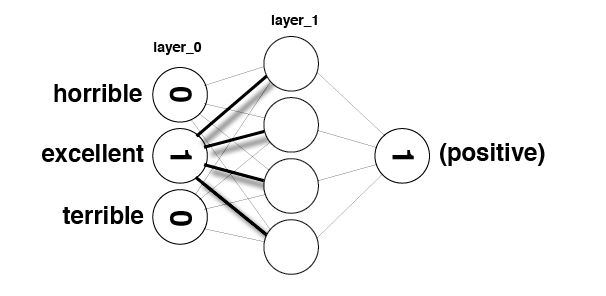

In [66]:
Image(filename='sentiment_network_sparse.png')

In [67]:
layer_0 = np.zeros(10)

In [68]:
layer_0

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

In [69]:
layer_0[4] = 1
layer_0[9] = 1

In [70]:
layer_0

array([0., 0., 0., 0., 1., 0., 0., 0., 0., 1.])

In [71]:
weights_0_1 = np.random.randn(10,5)

In [72]:
layer_0.dot(weights_0_1)

array([-0.10503756,  0.44222989,  0.24392938, -0.55961832,  0.21389503])

In [73]:
indices = [4,9]

In [74]:
layer_1 = np.zeros(5)

In [75]:
for index in indices:
    layer_1 += (1 * weights_0_1[index])

In [76]:
layer_1

array([-0.10503756,  0.44222989,  0.24392938, -0.55961832,  0.21389503])

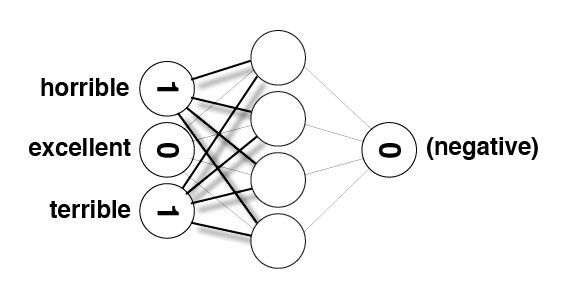

In [77]:
Image(filename='sentiment_network_sparse_2.png')

In [78]:
layer_1 = np.zeros(5)

In [79]:
for index in indices:
    layer_1 += (weights_0_1[index])

In [80]:
layer_1

array([-0.10503756,  0.44222989,  0.24392938, -0.55961832,  0.21389503])

# Project 5: Making our Network More Efficient<a id='project_5'></a>
**TODO:** Make the `SentimentNetwork` class more efficient by eliminating unnecessary multiplications and additions that occur during forward and backward propagation. To do that, you can do the following:
* Copy the `SentimentNetwork` class from the previous project into the following cell.
* Remove the `update_input_layer` function - you will not need it in this version.
* Modify `init_network`:
>* You no longer need a separate input layer, so remove any mention of `self.layer_0`
>* You will be dealing with the old hidden layer more directly, so create `self.layer_1`, a two-dimensional matrix with shape 1 x hidden_nodes, with all values initialized to zero
* Modify `train`:
>* Change the name of the input parameter `training_reviews` to `training_reviews_raw`. This will help with the next step.
>* At the beginning of the function, you'll want to preprocess your reviews to convert them to a list of indices (from `word2index`) that are actually used in the review. This is equivalent to what you saw in the video when Andrew set specific indices to 1. Your code should create a local `list` variable named `training_reviews` that should contain a `list` for each review in `training_reviews_raw`. Those lists should contain the indices for words found in the review.
>* Remove call to `update_input_layer`
>* Use `self`'s  `layer_1` instead of a local `layer_1` object.
>* In the forward pass, replace the code that updates `layer_1` with new logic that only adds the weights for the indices used in the review.
>* When updating `weights_0_1`, only update the individual weights that were used in the forward pass.
* Modify `run`:
>* Remove call to `update_input_layer` 
>* Use `self`'s  `layer_1` instead of a local `layer_1` object.
>* Much like you did in `train`, you will need to pre-process the `review` so you can work with word indices, then update `layer_1` by adding weights for the indices used in the review.

In [84]:
import time
import sys
import numpy as np

# Encapsulate our neural network in a class
class SentimentNetwork:
    def __init__(self, reviews, labels, hidden_nodes = 10, learning_rate = 0.1):
        """Create a SentimenNetwork with the given settings
        Args:
            reviews(list) - List of reviews used for training
            labels(list) - List of POSITIVE/NEGATIVE labels associated with the given reviews
            hidden_nodes(int) - Number of nodes to create in the hidden layer
            learning_rate(float) - Learning rate to use while training
        
        """
        # Assign a seed to our random number generator to ensure we get
        # reproducible results during development 
        np.random.seed(1)

        # process the reviews and their associated labels so that everything
        # is ready for training
        self.pre_process_data(reviews, labels)
        
        # Build the network to have the number of hidden nodes and the learning rate that
        # were passed into this initializer. Make the same number of input nodes as
        # there are vocabulary words and create a single output node.
        self.init_network(len(self.review_vocab),hidden_nodes, 1, learning_rate)

    def pre_process_data(self, reviews, labels):
        
        review_vocab = set()
        # TODO: populate review_vocab with all of the words in the given reviews
        #       Remember to split reviews into individual words 
        #       using "split(' ')" instead of "split()".
        for review in reviews:
            for word in review.split(' '):
                review_vocab.add(word)
        # Convert the vocabulary set to a list so we can access words via indices
        self.review_vocab = list(review_vocab)
        
        label_vocab = set()
        # TODO: populate label_vocab with all of the words in the given labels.
        #       There is no need to split the labels because each one is a single word.
        for label in labels:
            label_vocab.add(label)
        # Convert the label vocabulary set to a list so we can access labels via indices
        self.label_vocab = list(label_vocab)
        
        # Store the sizes of the review and label vocabularies.
        self.review_vocab_size = len(self.review_vocab)
        self.label_vocab_size = len(self.label_vocab)
        
        # Create a dictionary of words in the vocabulary mapped to index positions
        self.word2index = {}
        # TODO: populate self.word2index with indices for all the words in self.review_vocab
        #       like you saw earlier in the notebook
        for idx, word in enumerate(self.review_vocab):
            self.word2index[word] = idx
            
        # Create a dictionary of labels mapped to index positions
        self.label2index = {}
        # TODO: do the same thing you did for self.word2index and self.review_vocab, 
        #       but for self.label2index and self.label_vocab instead
        for idx, label in enumerate(self.label_vocab):
            self.label2index[label] = idx
         
    def init_network(self, input_nodes, hidden_nodes, output_nodes, learning_rate):
        # Store the number of nodes in input, hidden, and output layers.
        self.input_nodes = input_nodes
        self.hidden_nodes = hidden_nodes
        self.output_nodes = output_nodes

        # Store the learning rate
        self.learning_rate = learning_rate

        # Initialize weights
        
        # TODO: initialize self.weights_0_1 as a matrix of zeros. These are the weights between
        #       the input layer and the hidden layer.
        self.weights_0_1 = np.zeros((self.input_nodes, self.hidden_nodes))
        
        # TODO: initialize self.weights_1_2 as a matrix of random values. 
        #       These are the weights between the hidden layer and the output layer.
        self.weights_1_2 = np.random.normal(0.0, self.output_nodes**-0.5, (self.hidden_nodes, self.output_nodes))
        
        # TODO: Create the input layer, a two-dimensional matrix with shape 
        #       1 x input_nodes, with all values initialized to zero
        self.layer_1 = np.zeros((1, hidden_nodes))
    
        
    
                
    def get_target_for_label(self,label):
        if(label == 'POSITIVE'):
            return 1
        else:
            return 0
        
    def sigmoid(self,x):
        return 1 / (1 + np.exp(-x))
    
    def sigmoid_output_2_derivative(self,output):
        return output * (1 - output)

    def train(self, training_reviews_raw, training_labels):
        
        training_reviews = list()
        for review in training_reviews_raw:
            indices = set()
            for word in review.split(' '):
                if word in self.word2index.keys():
                    indices.add(self.word2index[word])
            training_reviews.append(list(indices))
        
        # make sure out we have a matching number of reviews and labels
        assert(len(training_reviews) == len(training_labels))
        
        # Keep track of correct predictions to display accuracy during training 
        correct_so_far = 0
        
        # Remember when we started for printing time statistics
        start = time.time()

        # loop through all the given reviews and run a forward and backward pass,
        # updating weights for every item
        for i in range(len(training_reviews)):
            
            # TODO: Get the next review and its correct label
            review = training_reviews[i]
            label = training_labels[i]
            
            # TODO: Implement the forward pass through the network. 
            #       That means use the given review to update the input layer, 
            #       then calculate values for the hidden layer,
            #       and finally calculate the output layer.
            # 
            #       Do not use an activation function for the hidden layer,
            #       but use the sigmoid activation function for the output layer.
            self.layer_1 *= 0
            for index in review:
                self.layer_1 += self.weights_0_1[index]
            
            layer_2 = self.sigmoid(self.layer_1.dot(self.weights_1_2))
            # TODO: Implement the back propagation pass here. 
            #       That means calculate the error for the forward pass's prediction
            #       and update the weights in the network according to their
            #       contributions toward the error, as calculated via the
            #       gradient descent and back propagation algorithms you 
            #       learned in class.
            # Output error
            layer_2_error = layer_2 - get_target_for_label(label)
            layer_2_delta = layer_2_error * self.sigmoid_output_2_derivative(layer_2)
            
            # Backpropagated error
            layer_1_error = layer_2_delta.dot(self.weights_1_2.T) # errors propagated to the hidden layer
            layer_1_delta = layer_1_error # hidden layer gradients - no nonlinearity so it's the same as the error
            
            self.weights_1_2 -= self.layer_1.T.dot(layer_2_delta) * self.learning_rate # update hidden-to-output weights with gradient descent step

            for index in review:
                self.weights_0_1[index] -= layer_1_delta[0] * self.learning_rate # update input-to-hidden weights with gradient descent step

            
            if(layer_2 >= 0.5 and label == 'POSITIVE'):
                correct_so_far += 1
            elif(layer_2 < 0.5 and label == 'NEGATIVE'):
                correct_so_far += 1
                
            # For debug purposes, print out our prediction accuracy and speed 
            # throughout the training process. 

            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0
            
            sys.stdout.write("\rProgress:" + str(100 * i/float(len(training_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct_so_far) + " #Trained:" + str(i+1) \
                             + " Training Accuracy:" + str(correct_so_far * 100 / float(i+1))[:4] + "%")
            if(i % 2500 == 0):
                print("")
    
    def test(self, testing_reviews, testing_labels):
        """
        Attempts to predict the labels for the given testing_reviews,
        and uses the test_labels to calculate the accuracy of those predictions.
        """
        
        # keep track of how many correct predictions we make
        correct = 0

        # we'll time how many predictions per second we make
        start = time.time()

        # Loop through each of the given reviews and call run to predict
        # its label. 
        for i in range(len(testing_reviews)):
            pred = self.run(testing_reviews[i])
            if(pred == testing_labels[i]):
                correct += 1
            
            # For debug purposes, print out our prediction accuracy and speed 
            # throughout the prediction process. 

            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0
            
            sys.stdout.write("\rProgress:" + str(100 * i/float(len(testing_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct) + " #Tested:" + str(i+1) \
                             + " Testing Accuracy:" + str(correct * 100 / float(i+1))[:4] + "%")
    
    def run(self, review):
        """
        Returns a POSITIVE or NEGATIVE prediction for the given review.
        """
        # TODO: Run a forward pass through the network, like you did in the
        #       "train" function. That means use the given review to 
        #       update the input layer, then calculate values for the hidden layer,
        #       and finally calculate the output layer.
        #
        #       Note: The review passed into this function for prediction 
        #             might come from anywhere, so you should convert it 
        #             to lower case prior to using it.
        
        self.layer_1 *= 0
        unique_indices = set()
        for word in review.lower().split(' '):
            if word in self.word2index.keys():
                unique_indices.add(self.word2index[word])
                
        for index in unique_indices:
            self.layer_1 += self.weights_0_1[index]
        # Output layer
        layer_2 = self.sigmoid(self.layer_1.dot(self.weights_1_2))
        
        # Return POSITIVE for values above greater-than-or-equal-to 0.5 in the output layer;
        # return NEGATIVE for other values
        if(layer_2[0] >= 0.5):
            return "POSITIVE"
        else:
            return "NEGATIVE"


Run the following cell to recreate the network and train it once again.

In [85]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000], learning_rate=0.1)
mlp.train(reviews[:-1000],labels[:-1000])

Progress:0.0% Speed(reviews/sec):0.0 #Correct:1 #Trained:1 Training Accuracy:100.%


Progress:2.02% Speed(reviews/sec):1287. #Correct:300 #Trained:488 Training Accuracy:61.4%

Progress:2.98% Speed(reviews/sec):1252. #Correct:450 #Trained:717 Training Accuracy:62.7%

Progress:3.97% Speed(reviews/sec):1232. #Correct:619 #Trained:954 Training Accuracy:64.8%

Progress:4.90% Speed(reviews/sec):1219. #Correct:804 #Trained:1178 Training Accuracy:68.2%

Progress:5.93% Speed(reviews/sec):1229. #Correct:976 #Trained:1425 Training Accuracy:68.4%

Progress:6.99% Speed(reviews/sec):1247. #Correct:1161 #Trained:1680 Training Accuracy:69.1%

Progress:8.16% Speed(reviews/sec):1276. #Correct:1371 #Trained:1961 Training Accuracy:69.9%

Progress:9.22% Speed(reviews/sec):1285. #Correct:1584 #Trained:2215 Training Accuracy:71.5%

Progress:10.1% Speed(reviews/sec):1278. #Correct:1757 #Trained:2440 Training Accuracy:72.0%

Progress:10.4% Speed(reviews/sec):1265. #Correct:1810 #Trained:2501 Training Accuracy:72.3%


Progress:12.1% Speed(reviews/sec):1264. #Correct:2156 #Trained:2912 Training Accuracy:74.0%

Progress:13.1% Speed(reviews/sec):1263. #Correct:2353 #Trained:3155 Training Accuracy:74.5%

Progress:14.0% Speed(reviews/sec):1262. #Correct:2508 #Trained:3378 Training Accuracy:74.2%

Progress:15.1% Speed(reviews/sec):1265. #Correct:2717 #Trained:3642 Training Accuracy:74.6%

Progress:16.0% Speed(reviews/sec):1253. #Correct:2892 #Trained:3861 Training Accuracy:74.9%

Progress:16.8% Speed(reviews/sec):1237. #Correct:3035 #Trained:4045 Training Accuracy:75.0%

Progress:17.8% Speed(reviews/sec):1234. #Correct:3218 #Trained:4274 Training Accuracy:75.2%

Progress:18.8% Speed(reviews/sec):1239. #Correct:3416 #Trained:4521 Training Accuracy:75.5%

Progress:19.5% Speed(reviews/sec):1224. #Correct:3546 #Trained:4693 Training Accuracy:75.5%

Progress:20.2% Speed(reviews/sec):1210. #Correct:3688 #Trained:4867 Training Accuracy:75.7%

Progress:20.8% Speed(reviews/sec):1210. #Correct:3790 #Trained:5001 Training Accuracy:75.7%


Progress:22.3% Speed(reviews/sec):1197. #Correct:4106 #Trained:5375 Training Accuracy:76.3%

Progress:23.2% Speed(reviews/sec):1194. #Correct:4278 #Trained:5585 Training Accuracy:76.5%

Progress:24.3% Speed(reviews/sec):1200. #Correct:4500 #Trained:5853 Training Accuracy:76.8%

Progress:25.3% Speed(reviews/sec):1203. #Correct:4698 #Trained:6096 Training Accuracy:77.0%

Progress:26.7% Speed(reviews/sec):1209. #Correct:4970 #Trained:6413 Training Accuracy:77.4%

Progress:27.8% Speed(reviews/sec):1219. #Correct:5202 #Trained:6693 Training Accuracy:77.7%

Progress:28.8% Speed(reviews/sec):1221. #Correct:5409 #Trained:6932 Training Accuracy:78.0%

Progress:30.0% Speed(reviews/sec):1224. #Correct:5640 #Trained:7202 Training Accuracy:78.3%

Progress:30.9% Speed(reviews/sec):1224. #Correct:5832 #Trained:7439 Training Accuracy:78.3%

Progress:31.2% Speed(reviews/sec):1223. #Correct:5883 #Trained:7501 Training Accuracy:78.4%


Progress:32.7% Speed(reviews/sec):1221. #Correct:6194 #Trained:7866 Training Accuracy:78.7%

Progress:33.4% Speed(reviews/sec):1212. #Correct:6342 #Trained:8035 Training Accuracy:78.9%

Progress:34.5% Speed(reviews/sec):1215. #Correct:6550 #Trained:8283 Training Accuracy:79.0%

Progress:35.4% Speed(reviews/sec):1215. #Correct:6740 #Trained:8515 Training Accuracy:79.1%

Progress:36.5% Speed(reviews/sec):1215. #Correct:6941 #Trained:8761 Training Accuracy:79.2%

Progress:37.1% Speed(reviews/sec):1205. #Correct:7079 #Trained:8914 Training Accuracy:79.4%

Progress:38.1% Speed(reviews/sec):1207. #Correct:7299 #Trained:9158 Training Accuracy:79.7%

Progress:39.4% Speed(reviews/sec):1214. #Correct:7571 #Trained:9476 Training Accuracy:79.8%

Progress:40.5% Speed(reviews/sec):1217. #Correct:7803 #Trained:9744 Training Accuracy:80.0%

Progress:41.4% Speed(reviews/sec):1214. #Correct:7970 #Trained:9949 Training Accuracy:80.1%

Progress:41.6% Speed(reviews/sec):1211. #Correct:8012 #Trained:10001 Training Accuracy:80.1%


Progress:43.3% Speed(reviews/sec):1213. #Correct:8352 #Trained:10398 Training Accuracy:80.3%

Progress:44.3% Speed(reviews/sec):1215. #Correct:8560 #Trained:10642 Training Accuracy:80.4%

Progress:45.3% Speed(reviews/sec):1218. #Correct:8764 #Trained:10891 Training Accuracy:80.4%

Progress:46.3% Speed(reviews/sec):1219. #Correct:8969 #Trained:11129 Training Accuracy:80.5%

Progress:47.3% Speed(reviews/sec):1218. #Correct:9159 #Trained:11360 Training Accuracy:80.6%

Progress:48.4% Speed(reviews/sec):1221. #Correct:9388 #Trained:11628 Training Accuracy:80.7%

Progress:49.2% Speed(reviews/sec):1218. #Correct:9557 #Trained:11828 Training Accuracy:80.7%

Progress:50.2% Speed(reviews/sec):1219. #Correct:9766 #Trained:12065 Training Accuracy:80.9%

Progress:51.3% Speed(reviews/sec):1222. #Correct:9980 #Trained:12320 Training Accuracy:81.0%

Progress:52.0% Speed(reviews/sec):1222. #Correct:10139 #Trained:12501 Training Accuracy:81.1%


Progress:53.2% Speed(reviews/sec):1220. #Correct:10380 #Trained:12774 Training Accuracy:81.2%

Progress:54.2% Speed(reviews/sec):1222. #Correct:10583 #Trained:13017 Training Accuracy:81.3%

Progress:55.3% Speed(reviews/sec):1224. #Correct:10813 #Trained:13287 Training Accuracy:81.3%

Progress:56.4% Speed(reviews/sec):1225. #Correct:11044 #Trained:13556 Training Accuracy:81.4%

Progress:57.6% Speed(reviews/sec):1226. #Correct:11281 #Trained:13828 Training Accuracy:81.5%

Progress:58.7% Speed(reviews/sec):1229. #Correct:11509 #Trained:14090 Training Accuracy:81.6%

Progress:59.8% Speed(reviews/sec):1232. #Correct:11729 #Trained:14359 Training Accuracy:81.6%

Progress:61.0% Speed(reviews/sec):1236. #Correct:11968 #Trained:14649 Training Accuracy:81.6%

Progress:62.0% Speed(reviews/sec):1235. #Correct:12183 #Trained:14891 Training Accuracy:81.8%

Progress:62.5% Speed(reviews/sec):1235. #Correct:12279 #Trained:15001 Training Accuracy:81.8%


Progress:64.1% Speed(reviews/sec):1236. #Correct:12598 #Trained:15386 Training Accuracy:81.8%

Progress:65.1% Speed(reviews/sec):1237. #Correct:12805 #Trained:15631 Training Accuracy:81.9%

Progress:66.3% Speed(reviews/sec):1239. #Correct:13051 #Trained:15919 Training Accuracy:81.9%

Progress:67.4% Speed(reviews/sec):1240. #Correct:13281 #Trained:16191 Training Accuracy:82.0%

Progress:68.5% Speed(reviews/sec):1242. #Correct:13491 #Trained:16448 Training Accuracy:82.0%

Progress:69.4% Speed(reviews/sec):1241. #Correct:13687 #Trained:16671 Training Accuracy:82.1%

Progress:70.7% Speed(reviews/sec):1245. #Correct:13954 #Trained:16984 Training Accuracy:82.1%

Progress:71.8% Speed(reviews/sec):1247. #Correct:14178 #Trained:17235 Training Accuracy:82.2%

Progress:72.8% Speed(reviews/sec):1247. #Correct:14408 #Trained:17495 Training Accuracy:82.3%

Progress:72.9% Speed(reviews/sec):1247. #Correct:14414 #Trained:17501 Training Accuracy:82.3%


Progress:75.0% Speed(reviews/sec):1248. #Correct:14849 #Trained:18005 Training Accuracy:82.4%

Progress:75.9% Speed(reviews/sec):1247. #Correct:15053 #Trained:18237 Training Accuracy:82.5%

Progress:77.0% Speed(reviews/sec):1246. #Correct:15268 #Trained:18486 Training Accuracy:82.5%

Progress:78.0% Speed(reviews/sec):1245. #Correct:15494 #Trained:18739 Training Accuracy:82.6%

Progress:78.8% Speed(reviews/sec):1243. #Correct:15657 #Trained:18926 Training Accuracy:82.7%

Progress:79.7% Speed(reviews/sec):1242. #Correct:15844 #Trained:19140 Training Accuracy:82.7%

Progress:80.7% Speed(reviews/sec):1242. #Correct:16055 #Trained:19376 Training Accuracy:82.8%

Progress:81.4% Speed(reviews/sec):1238. #Correct:16206 #Trained:19550 Training Accuracy:82.8%

Progress:82.1% Speed(reviews/sec):1235. #Correct:16357 #Trained:19728 Training Accuracy:82.9%

Progress:83.1% Speed(reviews/sec):1234. #Correct:16558 #Trained:19958 Training Accuracy:82.9%

Progress:83.3% Speed(reviews/sec):1233. #Correct:16596 #Trained:20001 Training Accuracy:82.9%


Progress:85.0% Speed(reviews/sec):1232. #Correct:16960 #Trained:20414 Training Accuracy:83.0%

Progress:86.0% Speed(reviews/sec):1232. #Correct:17164 #Trained:20646 Training Accuracy:83.1%

Progress:86.8% Speed(reviews/sec):1230. #Correct:17340 #Trained:20847 Training Accuracy:83.1%

Progress:87.6% Speed(reviews/sec):1227. #Correct:17494 #Trained:21031 Training Accuracy:83.1%

Progress:88.3% Speed(reviews/sec):1224. #Correct:17659 #Trained:21216 Training Accuracy:83.2%

Progress:89.2% Speed(reviews/sec):1223. #Correct:17833 #Trained:21415 Training Accuracy:83.2%

Progress:89.9% Speed(reviews/sec):1219. #Correct:17978 #Trained:21579 Training Accuracy:83.3%

Progress:90.8% Speed(reviews/sec):1219. #Correct:18176 #Trained:21810 Training Accuracy:83.3%

Progress:91.8% Speed(reviews/sec):1220. #Correct:18394 #Trained:22053 Training Accuracy:83.4%

Progress:93.0% Speed(reviews/sec):1221. #Correct:18634 #Trained:22322 Training Accuracy:83.4%

Progress:93.7% Speed(reviews/sec):1220. #Correct:18787 #Trained:22501 Training Accuracy:83.4%


Progress:95.0% Speed(reviews/sec):1220. #Correct:19056 #Trained:22818 Training Accuracy:83.5%

Progress:95.8% Speed(reviews/sec):1218. #Correct:19210 #Trained:22997 Training Accuracy:83.5%

Progress:96.6% Speed(reviews/sec):1216. #Correct:19389 #Trained:23193 Training Accuracy:83.5%

Progress:97.6% Speed(reviews/sec):1216. #Correct:19596 #Trained:23435 Training Accuracy:83.6%

Progress:98.7% Speed(reviews/sec):1217. #Correct:19840 #Trained:23704 Training Accuracy:83.6%

Progress:99.8% Speed(reviews/sec):1218. #Correct:20087 #Trained:23965 Training Accuracy:83.8%

Progress:99.9% Speed(reviews/sec):1217. #Correct:20117 #Trained:24000 Training Accuracy:83.8%

That should have trained much better than the earlier attempts. Run the following cell to test your model with 1000 predictions.

In [86]:
mlp.test(reviews[-1000:],labels[-1000:])

Progress:23.3% Speed(reviews/sec):1946. #Correct:206 #Tested:234 Testing Accuracy:88.0%

Progress:99.9% Speed(reviews/sec):1889. #Correct:848 #Tested:1000 Testing Accuracy:84.8%

In [98]:
mlp = SentimentNetwork(reviews[:-1000]*2,labels[:-1000]*2, learning_rate=0.05)
mlp.train(reviews[:-1000],labels[:-1000])

Progress:0.0% Speed(reviews/sec):0.0 #Correct:1 #Trained:1 Training Accuracy:100.%


Progress:2.07% Speed(reviews/sec):1271. #Correct:347 #Trained:498 Training Accuracy:69.6%

Progress:3.35% Speed(reviews/sec):1293. #Correct:553 #Trained:807 Training Accuracy:68.5%

Progress:4.59% Speed(reviews/sec):1318. #Correct:794 #Trained:1103 Training Accuracy:71.9%

Progress:5.56% Speed(reviews/sec):1307. #Correct:975 #Trained:1336 Training Accuracy:72.9%

Progress:6.87% Speed(reviews/sec):1330. #Correct:1211 #Trained:1651 Training Accuracy:73.3%

Progress:7.98% Speed(reviews/sec):1341. #Correct:1417 #Trained:1917 Training Accuracy:73.9%

Progress:9.17% Speed(reviews/sec):1351. #Correct:1650 #Trained:2203 Training Accuracy:74.8%

Progress:10.2% Speed(reviews/sec):1340. #Correct:1858 #Trained:2462 Training Accuracy:75.4%

Progress:10.4% Speed(reviews/sec):1342. #Correct:1888 #Trained:2501 Training Accuracy:75.4%


Progress:12.3% Speed(reviews/sec):1328. #Correct:2283 #Trained:2976 Training Accuracy:76.7%

Progress:13.4% Speed(reviews/sec):1325. #Correct:2470 #Trained:3219 Training Accuracy:76.7%

Progress:14.3% Speed(reviews/sec):1316. #Correct:2644 #Trained:3446 Training Accuracy:76.7%

Progress:15.4% Speed(reviews/sec):1316. #Correct:2851 #Trained:3710 Training Accuracy:76.8%

Progress:16.5% Speed(reviews/sec):1318. #Correct:3052 #Trained:3967 Training Accuracy:76.9%

Progress:17.5% Speed(reviews/sec):1320. #Correct:3259 #Trained:4216 Training Accuracy:77.3%

Progress:18.6% Speed(reviews/sec):1318. #Correct:3463 #Trained:4474 Training Accuracy:77.4%

Progress:19.8% Speed(reviews/sec):1316. #Correct:3682 #Trained:4756 Training Accuracy:77.4%

Progress:20.7% Speed(reviews/sec):1306. #Correct:3872 #Trained:4991 Training Accuracy:77.5%

Progress:20.8% Speed(reviews/sec):1306. #Correct:3881 #Trained:5001 Training Accuracy:77.6%


Progress:23.4% Speed(reviews/sec):1313. #Correct:4402 #Trained:5631 Training Accuracy:78.1%

Progress:24.4% Speed(reviews/sec):1310. #Correct:4594 #Trained:5866 Training Accuracy:78.3%

Progress:25.4% Speed(reviews/sec):1306. #Correct:4779 #Trained:6105 Training Accuracy:78.2%

Progress:26.5% Speed(reviews/sec):1305. #Correct:5010 #Trained:6371 Training Accuracy:78.6%

Progress:27.6% Speed(reviews/sec):1308. #Correct:5227 #Trained:6634 Training Accuracy:78.7%

Progress:28.6% Speed(reviews/sec):1305. #Correct:5423 #Trained:6873 Training Accuracy:78.9%

Progress:29.7% Speed(reviews/sec):1303. #Correct:5645 #Trained:7133 Training Accuracy:79.1%

Progress:30.8% Speed(reviews/sec):1305. #Correct:5862 #Trained:7393 Training Accuracy:79.2%

Progress:31.2% Speed(reviews/sec):1303. #Correct:5953 #Trained:7501 Training Accuracy:79.3%


Progress:32.8% Speed(reviews/sec):1305. #Correct:6268 #Trained:7880 Training Accuracy:79.5%

Progress:33.7% Speed(reviews/sec):1301. #Correct:6455 #Trained:8104 Training Accuracy:79.6%

Progress:34.8% Speed(reviews/sec):1302. #Correct:6670 #Trained:8357 Training Accuracy:79.8%

Progress:35.8% Speed(reviews/sec):1305. #Correct:6884 #Trained:8615 Training Accuracy:79.9%

Progress:36.9% Speed(reviews/sec):1304. #Correct:7109 #Trained:8873 Training Accuracy:80.1%

Progress:38.0% Speed(reviews/sec):1304. #Correct:7324 #Trained:9122 Training Accuracy:80.2%

Progress:39.1% Speed(reviews/sec):1309. #Correct:7569 #Trained:9399 Training Accuracy:80.5%

Progress:40.1% Speed(reviews/sec):1309. #Correct:7779 #Trained:9645 Training Accuracy:80.6%

Progress:41.2% Speed(reviews/sec):1310. #Correct:8001 #Trained:9911 Training Accuracy:80.7%

Progress:41.6% Speed(reviews/sec):1311. #Correct:8076 #Trained:10001 Training Accuracy:80.7%


Progress:43.7% Speed(reviews/sec):1312. #Correct:8495 #Trained:10495 Training Accuracy:80.9%

Progress:44.6% Speed(reviews/sec):1310. #Correct:8685 #Trained:10719 Training Accuracy:81.0%

Progress:45.7% Speed(reviews/sec):1310. #Correct:8906 #Trained:10987 Training Accuracy:81.0%

Progress:47.0% Speed(reviews/sec):1312. #Correct:9167 #Trained:11294 Training Accuracy:81.1%

Progress:48.1% Speed(reviews/sec):1315. #Correct:9383 #Trained:11557 Training Accuracy:81.1%

Progress:49.2% Speed(reviews/sec):1314. #Correct:9608 #Trained:11818 Training Accuracy:81.2%

Progress:50.4% Speed(reviews/sec):1314. #Correct:9865 #Trained:12105 Training Accuracy:81.4%

Progress:51.7% Speed(reviews/sec):1316. #Correct:10133 #Trained:12430 Training Accuracy:81.5%

Progress:52.0% Speed(reviews/sec):1311. #Correct:10198 #Trained:12501 Training Accuracy:81.5%


Progress:53.6% Speed(reviews/sec):1311. #Correct:10532 #Trained:12883 Training Accuracy:81.7%

Progress:54.6% Speed(reviews/sec):1309. #Correct:10725 #Trained:13107 Training Accuracy:81.8%

Progress:55.7% Speed(reviews/sec):1313. #Correct:10960 #Trained:13391 Training Accuracy:81.8%

Progress:56.7% Speed(reviews/sec):1313. #Correct:11172 #Trained:13632 Training Accuracy:81.9%

Progress:57.8% Speed(reviews/sec):1313. #Correct:11396 #Trained:13892 Training Accuracy:82.0%

Progress:58.9% Speed(reviews/sec):1315. #Correct:11609 #Trained:14149 Training Accuracy:82.0%

Progress:60.0% Speed(reviews/sec):1317. #Correct:11832 #Trained:14416 Training Accuracy:82.0%

Progress:61.1% Speed(reviews/sec):1318. #Correct:12038 #Trained:14677 Training Accuracy:82.0%

Progress:62.0% Speed(reviews/sec):1316. #Correct:12231 #Trained:14900 Training Accuracy:82.0%

Progress:62.5% Speed(reviews/sec):1315. #Correct:12317 #Trained:15001 Training Accuracy:82.1%


Progress:64.0% Speed(reviews/sec):1314. #Correct:12623 #Trained:15374 Training Accuracy:82.1%

Progress:65.0% Speed(reviews/sec):1313. #Correct:12830 #Trained:15614 Training Accuracy:82.1%

Progress:66.1% Speed(reviews/sec):1314. #Correct:13039 #Trained:15865 Training Accuracy:82.1%

Progress:67.1% Speed(reviews/sec):1313. #Correct:13235 #Trained:16106 Training Accuracy:82.1%

Progress:68.8% Speed(reviews/sec):1314. #Correct:13593 #Trained:16524 Training Accuracy:82.2%

Progress:69.9% Speed(reviews/sec):1313. #Correct:13822 #Trained:16788 Training Accuracy:82.3%

Progress:71.0% Speed(reviews/sec):1315. #Correct:14046 #Trained:17052 Training Accuracy:82.3%

Progress:72.0% Speed(reviews/sec):1315. #Correct:14266 #Trained:17302 Training Accuracy:82.4%

Progress:72.9% Speed(reviews/sec):1315. #Correct:14436 #Trained:17501 Training Accuracy:82.4%


Progress:74.1% Speed(reviews/sec):1315. #Correct:14686 #Trained:17793 Training Accuracy:82.5%

Progress:75.3% Speed(reviews/sec):1314. #Correct:14939 #Trained:18087 Training Accuracy:82.5%

Progress:76.5% Speed(reviews/sec):1315. #Correct:15189 #Trained:18373 Training Accuracy:82.6%

Progress:77.7% Speed(reviews/sec):1315. #Correct:15451 #Trained:18666 Training Accuracy:82.7%

Progress:78.8% Speed(reviews/sec):1315. #Correct:15679 #Trained:18924 Training Accuracy:82.8%

Progress:79.6% Speed(reviews/sec):1311. #Correct:15837 #Trained:19106 Training Accuracy:82.8%

Progress:80.4% Speed(reviews/sec):1309. #Correct:16030 #Trained:19319 Training Accuracy:82.9%

Progress:81.3% Speed(reviews/sec):1304. #Correct:16199 #Trained:19519 Training Accuracy:82.9%

Progress:82.1% Speed(reviews/sec):1302. #Correct:16372 #Trained:19722 Training Accuracy:83.0%

Progress:82.9% Speed(reviews/sec):1298. #Correct:16536 #Trained:19909 Training Accuracy:83.0%

Progress:83.3% Speed(reviews/sec):1295. #Correct:16616 #Trained:20001 Training Accuracy:83.0%


Progress:84.4% Speed(reviews/sec):1288. #Correct:16862 #Trained:20275 Training Accuracy:83.1%

Progress:85.4% Speed(reviews/sec):1286. #Correct:17061 #Trained:20507 Training Accuracy:83.1%

Progress:86.1% Speed(reviews/sec):1281. #Correct:17216 #Trained:20686 Training Accuracy:83.2%

Progress:87.0% Speed(reviews/sec):1280. #Correct:17416 #Trained:20904 Training Accuracy:83.3%

Progress:87.8% Speed(reviews/sec):1277. #Correct:17577 #Trained:21091 Training Accuracy:83.3%

Progress:88.7% Speed(reviews/sec):1275. #Correct:17753 #Trained:21302 Training Accuracy:83.3%

Progress:89.8% Speed(reviews/sec):1277. #Correct:17979 #Trained:21559 Training Accuracy:83.3%

Progress:91.1% Speed(reviews/sec):1278. #Correct:18249 #Trained:21867 Training Accuracy:83.4%

Progress:92.2% Speed(reviews/sec):1279. #Correct:18489 #Trained:22139 Training Accuracy:83.5%

Progress:93.4% Speed(reviews/sec):1280. #Correct:18746 #Trained:22435 Training Accuracy:83.5%

Progress:93.7% Speed(reviews/sec):1279. #Correct:18805 #Trained:22501 Training Accuracy:83.5%


Progress:95.5% Speed(reviews/sec):1280. #Correct:19164 #Trained:22923 Training Accuracy:83.6%

Progress:96.5% Speed(reviews/sec):1281. #Correct:19390 #Trained:23174 Training Accuracy:83.6%

Progress:97.5% Speed(reviews/sec):1279. #Correct:19594 #Trained:23418 Training Accuracy:83.6%

Progress:98.7% Speed(reviews/sec):1279. #Correct:19849 #Trained:23701 Training Accuracy:83.7%

Progress:99.9% Speed(reviews/sec):1280. #Correct:20126 #Trained:24000 Training Accuracy:83.8%

In [99]:
mlp.test(reviews[-1000:],labels[-1000:])

Progress:43.1% Speed(reviews/sec):2233. #Correct:376 #Tested:432 Testing Accuracy:87.0%

Progress:79.1% Speed(reviews/sec):2111. #Correct:670 #Tested:792 Testing Accuracy:84.5%

Progress:99.9% Speed(reviews/sec):2091. #Correct:854 #Tested:1000 Testing Accuracy:85.4%

# End of Project 5. 
## Watch the next video to see Andrew's solution, then continue on to the next lesson.
# Further Noise Reduction<a id='lesson_6'></a>

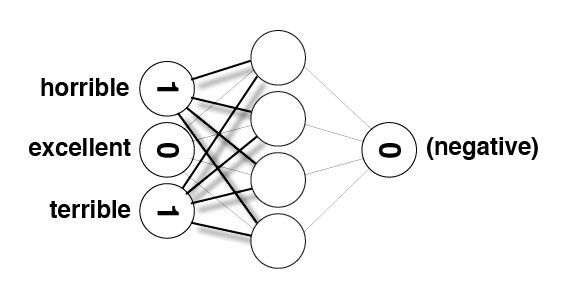

In [100]:
Image(filename='sentiment_network_sparse_2.png')

In [101]:
# words most frequently seen in a review with a "POSITIVE" label
pos_neg_ratios.most_common()

[('edie', 5.384495062789089),
 ('antwone', 5.170483995038151),
 ('din', 5.099866427824199),
 ('gunga', 4.882801922586371),
 ('goldsworthy', 4.867534450455582),
 ('gypo', 4.787491742782046),
 ('yokai', 4.787491742782046),
 ('visconti', 4.624972813284271),
 ('flavia', 4.624972813284271),
 ('paulie', 4.3652195163575005),
 ('gundam', 3.6054978451748854),
 ('iturbi', 3.5648268054439574),
 ('felix', 3.258096538021482),
 ('capote', 3.1945831322991562),
 ('excellently', 3.1612467120315646),
 ('fido', 3.1416861861770706),
 ('deanna', 3.109060958860994),
 ('hayworth', 3.109060958860994),
 ('vance', 3.077970371790963),
 ('kolchak', 3.0647251450409425),
 ('sammo', 3.0349529867072724),
 ('laputa', 3.0155349008501706),
 ('sox', 2.9667447366807385),
 ('alvin', 2.951929650895598),
 ('biko', 2.9385738597140425),
 ('polanski', 2.9103724246028344),
 ('mathieu', 2.906120114864304),
 ('matthau', 2.8638801424491884),
 ('gilliam', 2.8581108956779433),
 ('chavez', 2.772588722239781),
 ('harriet', 2.7725887222

In [102]:
# words most frequently seen in a review with a "NEGATIVE" label
list(reversed(pos_neg_ratios.most_common()))[0:30]

[('boll', -4.966335035199676),
 ('uwe', -4.620058798481842),
 ('thunderbirds', -4.119037174812472),
 ('beowulf', -4.102643365036796),
 ('dahmer', -3.979681653901961),
 ('wayans', -3.9219733362813143),
 ('seagal', -3.6408702349275757),
 ('gamera', -3.3232358401924436),
 ('dreck', -3.264486336120253),
 ('unwatchable', -3.253277251585533),
 ('stinker', -3.2037621870581527),
 ('mst', -2.9473586892697754),
 ('incoherent', -2.933096702562506),
 ('flimsy', -2.917770732084279),
 ('dillinger', -2.8233610476132043),
 ('yawn', -2.810907586541918),
 ('unfunny', -2.6902455764687034),
 ('waste', -2.6190165787318125),
 ('ugh', -2.6119063405493077),
 ('turd', -2.6119063405493077),
 ('blah', -2.5676928434072877),
 ('slugs', -2.5552874465498),
 ('tripe', -2.4918270926325743),
 ('horrid', -2.480266270231498),
 ('wtf', -2.4765384001174837),
 ('pointless', -2.4542326426031855),
 ('atrocious', -2.4231420555331544),
 ('damme', -2.404367787303988),
 ('redeeming', -2.366565422657453),
 ('prom', -2.356125859922

In [103]:
from bokeh.models import ColumnDataSource, LabelSet
from bokeh.plotting import figure, show, output_file
from bokeh.io import output_notebook
output_notebook()

Loading BokehJS ...

In [104]:
hist, edges = np.histogram(list(map(lambda x:x[1],pos_neg_ratios.most_common())), density=True, bins=100, normed=True)

p = figure(tools="pan,wheel_zoom,reset,save",
           toolbar_location="above",
           title="Word Positive/Negative Affinity Distribution")
p.quad(top=hist, bottom=0, left=edges[:-1], right=edges[1:], line_color="#555555")
show(p)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: The normed argument is ignored when density is provided. In future passing both will result in an error.
  """Entry point for launching an IPython kernel.


In [107]:
frequency_frequency = Counter()

for word, cnt in total_counts.most_common():
    frequency_frequency[cnt] += 1

 1111930
the 673426
. 654384
and 328214
a 326018
of 291728
to 271440
is 214656
br 203744
it 192704
in 187936
i 175246
this 152000
that 146490
s 130722
was 96416
as 93866
for 88686
with 88250
movie 88078
but 85206
film 80310
you 68460
on 68400
t 68162
not 61252
he 60276
are 58860
his 58748
have 55462
be 53914
one 53578
all 47956
at 47026
they 45812
by 45092
an 43120
who 42866
so 41234
from 40996
like 40552
there 37664
her 36842
or 36008
just 35542
about 34748
out 34226
if 33606
has 33580
what 32318
some 31494
good 30286
can 29308
more 28502
she 28446
when 28364
very 28138
up 26582
time 25448
no 25434
even 25302
my 25006
would 24872
which 24094
story 23976
only 23836
really 23476
see 22956
their 22770
had 22580
we 21718
were 21566
me 21546
well 21318
than 19838
much 19526
get 18618
bad 18616
been 18578
people 18570
will 18422
do 18354
other 18326
also 18316
into 18222
first 18122
great 18118
because 18090
how 17802
him 17752
don 17608
most 17566
made 16728
its 16554
then 16238
make 16050

likely 844
plan 842
climax 842
soldiers 842
gang 842
chris 842
vampire 842
f 840
disappointing 840
pass 840
soul 840
award 838
issues 838
excuse 838
noir 838
outstanding 836
justice 836
painful 834
marriage 834
surely 834
boss 832
constantly 832
innocent 832
victim 832
thus 832
costumes 830
presented 830
christopher 828
ride 826
slowly 824
cinematic 824
finish 822
central 822
hey 822
train 822
contains 822
everybody 822
presence 820
besides 820
places 820
manner 820
details 820
spoiler 820
thrown 818
r 816
historical 816
charles 816
animals 816
photography 814
stunning 814
charm 814
scenery 814
hoping 814
henry 814
indian 812
smart 812
jones 812
church 812
speaking 810
mysterious 810
impression 810
paris 810
allen 808
loves 808
expectations 808
green 808
developed 808
disappointment 808
drug 806
numbers 806
color 804
exception 802
throw 802
ahead 800
minor 800
double 800
woods 800
track 798
cry 798
festival 798
critics 796
boyfriend 796
stands 796
aspects 796
lover 794
million 794
supp

weeks 406
accents 406
serves 406
treasure 404
blow 404
speaks 404
chose 404
related 404
supernatural 404
whoever 404
emma 404
highlight 404
mainstream 404
brave 404
prime 404
pacino 404
deadly 402
latest 402
rain 402
veteran 402
routine 402
granted 402
erotic 402
suffers 402
crash 402
wilson 400
harsh 400
dollars 400
experiences 400
speech 400
print 400
mistakes 400
invisible 400
accidentally 400
alice 400
sympathy 398
colors 398
notch 398
teens 398
aliens 398
twisted 398
realizes 398
dogs 398
mgm 398
uninteresting 398
friday 396
nude 396
security 396
guilty 396
draw 396
combined 396
ted 396
princess 394
struggling 394
terror 394
matrix 394
convince 394
path 394
dozen 394
universe 394
gritty 392
enter 392
mountain 392
birth 392
blah 392
appreciated 392
atrocious 392
gas 390
walked 390
committed 390
irish 390
technically 390
frightening 390
recognize 390
sword 390
driver 390
changing 388
aka 388
magical 388
sun 388
lugosi 388
sarah 388
directly 386
darkness 386
false 386
occasional 386


differences 230
concerning 230
choreography 230
eyre 230
matthew 230
dancers 230
extended 230
incident 230
farm 230
tap 230
landscape 230
karen 230
movements 230
mildred 230
prom 230
bathroom 228
rambo 228
existed 228
overrated 228
drawing 228
anyways 228
occurred 228
triumph 228
bite 228
involvement 228
bone 228
web 228
symbolism 228
kirk 228
displays 228
burned 228
bare 228
styles 228
broadcast 228
margaret 228
daring 228
altman 228
nazis 228
ought 228
cheek 228
builds 228
affected 226
recognized 226
secrets 226
hollow 226
bird 226
contained 226
kapoor 226
genres 226
blend 226
swear 226
newspaper 226
machines 226
population 226
greek 226
craft 226
holy 226
antics 226
audio 226
resembles 226
block 226
ranks 226
currently 226
tommy 226
fulci 226
nicholson 226
apes 226
demands 226
hamilton 226
beatty 226
leg 224
pretend 224
swedish 224
cliff 224
seventies 224
harder 224
neo 224
merit 224
receive 224
investigate 224
proceedings 224
sadistic 224
sadness 224
journalist 224
hugh 224
altoget

chavez 152
shared 150
acclaimed 150
adopted 150
automatically 150
laurence 150
invites 150
mode 150
imaginable 150
bernard 150
shoddy 150
heartfelt 150
haired 150
cue 150
handling 150
preposterous 150
provocative 150
dresses 150
rely 150
blacks 150
moreover 150
inexplicably 150
visited 150
industrial 150
trend 150
nemesis 150
active 150
occasions 150
shoulder 150
devices 150
behaviour 150
reign 150
conviction 150
ethnic 150
citizens 150
bread 150
cancer 150
encourage 150
biased 150
lindsay 150
nolan 150
swing 150
cattle 150
amazon 150
quaid 150
roller 150
el 150
realised 150
objects 150
dose 150
boxer 150
attenborough 150
mccoy 150
tierney 150
penny 150
profanity 150
ratso 150
springer 150
translated 148
rod 148
referred 148
poe 148
squad 148
paxton 148
heartbreaking 148
sketch 148
outfits 148
tracking 148
option 148
accepts 148
freaks 148
er 148
nut 148
hopelessly 148
secondary 148
ignorance 148
controlled 148
beatles 148
guitar 148
hughes 148
naughty 148
yeti 148
ladder 148
chills 14

controlling 106
defies 106
lowe 106
introducing 106
employee 106
attending 106
satisfaction 106
circles 106
drab 106
shockingly 106
encountered 106
ranch 106
awakening 106
pfeiffer 106
olivia 106
hooker 106
motorcycle 106
amidst 106
professionals 106
posing 106
themed 106
immigrant 106
tactics 106
foundation 106
readily 106
covering 106
romances 106
wash 106
sells 106
explosive 106
pushes 106
possesses 106
serials 106
coke 106
ira 106
deliciously 106
mysteriously 106
contestants 106
meal 106
forties 106
flower 106
invention 106
cliched 106
mortal 106
delightfully 106
mute 106
keys 106
vomit 106
guinea 106
novelty 106
regularly 106
instincts 106
seductive 106
psyche 106
bonnie 106
cigarette 106
cooking 106
doyle 106
flavor 106
legitimate 106
suggesting 106
lucille 106
feeble 106
penelope 106
expense 106
nun 106
planes 106
nuances 106
republic 106
clerk 106
fluid 106
beckinsale 106
cannes 106
dynamics 106
policy 106
wheelchair 106
weary 106
fried 106
gooding 106
possession 106
diary 106


alexandra 80
gruff 80
parks 80
cockney 80
noam 80
clutter 80
mae 80
influential 80
daria 80
malden 80
apartheid 80
cruella 80
islands 80
reno 80
kalifornia 80
sacrifices 80
floriane 80
jigsaw 80
fawcett 80
kilmer 80
sammi 80
muni 80
midler 80
warhols 80
luxury 78
predecessors 78
amid 78
beth 78
tricked 78
bitchy 78
bombed 78
enthralling 78
ceremony 78
strain 78
determine 78
hypnotic 78
overwrought 78
rousing 78
stricken 78
drastically 78
imitate 78
sensational 78
henchman 78
uptight 78
sigh 78
rockets 78
spotted 78
depend 78
stabs 78
staging 78
scriptwriter 78
collaboration 78
thereof 78
cunning 78
fierce 78
plagued 78
powered 78
outlaw 78
hunky 78
justification 78
romania 78
euro 78
decency 78
villa 78
stripper 78
echoes 78
caution 78
superfluous 78
inexperienced 78
bing 78
aircraft 78
adultery 78
standpoint 78
transported 78
mythical 78
winners 78
locale 78
natasha 78
marrying 78
hale 78
mines 78
register 78
lanza 78
russians 78
communism 78
padded 78
allies 78
crowded 78
portions 78

apologies 64
endured 64
variations 64
phyllis 64
outta 64
sealed 64
marital 64
cleveland 64
nana 64
stepping 64
booze 64
albums 64
townsend 64
raving 64
downside 64
primal 64
expertise 64
gaining 64
wondrous 64
bum 64
schemes 64
insulted 64
stud 64
roaring 64
sorta 64
sheet 64
forum 64
nuns 64
solving 64
anchor 64
occurring 64
exhibit 64
kermit 64
celebrating 64
harmony 64
offerings 64
rigid 64
piper 64
adapting 64
exposing 64
gesture 64
throwaway 64
bake 64
floors 64
hurting 64
crop 64
prototype 64
allegedly 64
camps 64
sweetheart 64
episodic 64
positions 64
monumental 64
skywalker 64
presumed 64
practicing 64
poppins 64
allied 64
honour 64
babysitter 64
orphanage 64
stable 64
tremors 64
flee 64
exaggeration 64
coarse 64
renowned 64
undertones 64
retain 64
praying 64
bee 64
strangest 64
unimpressive 64
tasteful 64
unfinished 64
greta 64
shouts 64
eleanor 64
holden 64
catastrophe 64
mischievous 64
circuit 64
emerged 64
exudes 64
integrated 64
supplies 64
illustrates 64
addressing 64
da

noses 54
blended 54
tribulations 54
cringed 54
pioneer 54
shudder 54
shambles 54
sparkle 54
pedro 54
succeeding 54
unwittingly 54
connelly 54
eg 54
prophetic 54
arises 54
mobsters 54
rancid 54
idealism 54
sen 54
investigates 54
freudian 54
dd 54
drill 54
risky 54
glove 54
orwell 54
yacht 54
pov 54
lana 54
uncertainty 54
tournament 54
pryor 54
virgins 54
continuation 54
refusing 54
sydow 54
townsfolk 54
autistic 54
soooo 54
guerrilla 54
andie 54
orca 54
bureau 54
amos 54
unstoppable 54
eldest 54
loach 54
strangler 54
dreaded 54
cleese 54
irreverent 54
partying 54
wolfman 54
wyoming 54
shearer 54
roaming 54
dressler 54
invincible 54
component 54
shemp 54
dour 54
wodehouse 54
culp 54
smallville 54
borg 54
abhay 54
po 54
picker 54
saura 54
mordrid 54
keira 54
yugoslavia 54
ant 54
jaffe 54
varma 54
berkowitz 54
drown 52
reckon 52
ponderous 52
elevated 52
cigarettes 52
pretensions 52
morton 52
rosanna 52
trait 52
personnel 52
elusive 52
acquainted 52
inventor 52
aditya 52
dicaprio 52
grindho

arrange 44
reservations 44
amaze 44
eyeball 44
sidekicks 44
shekhar 44
needn 44
hesitant 44
magnitude 44
eighteen 44
tearjerker 44
ropes 44
sumptuous 44
haters 44
slit 44
flirt 44
proceeded 44
cigar 44
reacts 44
reloaded 44
seamlessly 44
tendencies 44
flees 44
tens 44
venice 44
slashing 44
catalyst 44
attain 44
economical 44
indirectly 44
supplied 44
transformations 44
amnesia 44
deplorable 44
faithfully 44
guiding 44
preference 44
companionship 44
whos 44
collected 44
relegated 44
gabby 44
reporters 44
lorna 44
clunker 44
unfocused 44
purists 44
ailing 44
toto 44
gloriously 44
specialist 44
revered 44
wasteland 44
comprehensive 44
cannibalistic 44
troll 44
yay 44
pipes 44
adjust 44
degenerates 44
oneself 44
commonly 44
disgraceful 44
austria 44
ava 44
pastiche 44
trading 44
smashes 44
vicki 44
horns 44
saddled 44
storms 44
broadcasting 44
aloof 44
resorts 44
marking 44
persistent 44
creeped 44
unexciting 44
accompanies 44
kooky 44
healed 44
drone 44
oft 44
chunk 44
wisecracks 44
launc

brittany 38
dumbland 38
priyadarshan 38
bluth 38
shefali 38
dell 38
ullman 38
hoon 38
jada 38
monaghan 38
anastasia 38
stepsisters 38
egos 38
radium 38
eskimo 38
barjatya 38
ferdie 38
kovacs 38
mace 38
pakeezah 38
petiot 38
sphinx 38
pinjar 38
urmila 38
custer 38
sayuri 38
gammera 38
flippen 38
flemming 38
sloth 38
prashant 38
railly 38
recalled 36
cryptic 36
nickname 36
unmistakable 36
introspective 36
draining 36
imitations 36
pencil 36
troubling 36
manuscript 36
veneer 36
hid 36
unknowingly 36
intolerable 36
relieve 36
bumped 36
vijay 36
manoj 36
terrorize 36
bid 36
cronies 36
responsibilities 36
crud 36
strokes 36
sailing 36
evoked 36
strauss 36
romanticized 36
homecoming 36
bubbles 36
drifting 36
liberation 36
moralistic 36
honored 36
extends 36
liang 36
nit 36
deprived 36
journal 36
prepares 36
homosexuals 36
maxwell 36
ji 36
debatable 36
badass 36
nosed 36
glamor 36
lauded 36
injects 36
enigma 36
hookers 36
irreversible 36
minimalist 36
anand 36
masculinity 36
marco 36
theatrica

verne 32
replaces 32
scatman 32
fraternity 32
benkei 32
dreyfus 32
santos 32
osbourne 32
investigated 32
hayek 32
quatermain 32
pol 32
gilley 32
dolemite 32
duffell 32
avery 32
kryptonite 32
catwoman 32
unintended 32
uncaring 32
fork 32
braga 32
bandits 32
boeing 32
astoundingly 32
abhorrent 32
seidl 32
gunner 32
naomi 32
nanette 32
grams 32
siskel 32
laird 32
brigham 32
btas 32
madhur 32
sooraj 32
transpires 32
archibald 32
brokedown 32
saul 32
ziyi 32
sakura 32
reindeer 32
rumored 32
stalkers 32
ozu 32
armand 32
biehn 32
matlin 32
natalia 32
hirsch 32
sas 32
bombshells 32
bfg 32
visiteurs 32
tolstoy 32
hamiltons 32
dentists 32
hulce 32
gaiman 32
yvaine 32
bedknobs 32
triton 32
miya 32
endor 32
rotj 32
pasteur 32
amin 32
antz 32
monte 30
enamored 30
exemplary 30
schrader 30
trashing 30
treasury 30
hacker 30
rundown 30
sanjay 30
touted 30
pubescent 30
grossing 30
stinkers 30
criticised 30
blossoms 30
promos 30
vanish 30
reunites 30
wafer 30
transfixed 30
treasures 30
engines 30
pleas 3

multiplex 28
snatchers 28
imaginatively 28
impressionist 28
nightly 28
herb 28
practiced 28
nighttime 28
pagan 28
assurance 28
hyperbole 28
defiant 28
rhoda 28
polyester 28
tides 28
heder 28
commissioned 28
crafts 28
purest 28
sculptor 28
coccio 28
nietzsche 28
athlete 28
loopholes 28
etched 28
whistler 28
lowly 28
afforded 28
succubus 28
mcguire 28
compass 28
junkyard 28
globalization 28
miguel 28
daninsky 28
restroom 28
testosterone 28
cb 28
kruger 28
ridicules 28
entrepreneur 28
tt 28
cooperate 28
eraserhead 28
bulimia 28
kitschy 28
dakar 28
hatchet 28
protestant 28
choked 28
toting 28
commune 28
undermining 28
requiem 28
malice 28
celia 28
pilgrimage 28
lizzie 28
blaring 28
guillotine 28
tulip 28
eggar 28
mumbles 28
snitch 28
borowczyk 28
skinner 28
censor 28
tchaikovsky 28
apathetic 28
adrien 28
tmnt 28
responded 28
cosby 28
lyman 28
stamos 28
coulier 28
bushwhackers 28
groomed 28
parter 28
nikhil 28
jerker 28
substandard 28
spellbound 28
uninitiated 28
brutish 28
jorge 28
lawless

sweeney 24
exceed 24
plank 24
herge 24
greenstreet 24
remy 24
gonzalez 24
compressed 24
scroll 24
sternberg 24
crucified 24
sensuous 24
su 24
anthologies 24
albuquerque 24
shimizu 24
columbus 24
suckers 24
snare 24
crudely 24
ode 24
undertaking 24
machismo 24
apex 24
si 24
recluse 24
guerilla 24
renditions 24
assailant 24
runt 24
findings 24
minstrel 24
haphazardly 24
henner 24
shrinking 24
extremities 24
salma 24
pioneering 24
anselmo 24
slavoj 24
rohm 24
maddening 24
hurley 24
kendrick 24
hypocrite 24
knuckle 24
suzy 24
caller 24
inaccuracy 24
samson 24
projecting 24
loni 24
perversely 24
olympics 24
barcelona 24
porch 24
vampyres 24
istanbul 24
stewardesses 24
friel 24
montand 24
underway 24
banquet 24
orphans 24
marcello 24
mckee 24
directer 24
gallows 24
hussey 24
patchy 24
allusion 24
rainn 24
vans 24
orchid 24
whereby 24
bressart 24
birdie 24
senile 24
tylo 24
jasmine 24
rotoscoping 24
waterston 24
walkers 24
talos 24
violation 24
nz 24
fessenden 24
sim 24
umeki 24
hakuna 24
mat

schwimmer 22
smokey 22
stormare 22
bartel 22
pei 22
meloni 22
rios 22
coups 22
barres 22
zp 22
bolo 22
nyqvist 22
leaud 22
slipstream 22
libby 22
dragoon 22
gracia 22
redline 22
bruhl 22
breakdancing 22
qi 22
summersisle 22
nunez 22
bolan 22
starewicz 22
atul 22
retriever 22
capano 22
sagemiller 22
vadar 22
gundams 22
swinton 22
hallen 22
shep 22
borel 22
manu 22
rawhide 22
frewer 22
rosarios 22
elections 20
bracelet 20
spaceballs 20
submerged 20
snobbery 20
correspondence 20
compels 20
acharya 20
bordered 20
pandey 20
jagged 20
structural 20
gantry 20
stimulate 20
completion 20
whiff 20
murdoch 20
mein 20
grape 20
disliking 20
postmodern 20
frontiers 20
softly 20
floundering 20
swoon 20
brushed 20
cigars 20
greenlight 20
millar 20
tactical 20
leroy 20
sloppiness 20
footnote 20
ramifications 20
excised 20
ers 20
buddhism 20
weighty 20
catatonic 20
terminology 20
grapple 20
recital 20
joyful 20
permits 20
probability 20
nobodies 20
precinct 20
runway 20
tricking 20
caretakers 20
tit 20


gillen 18
oaf 18
twang 18
monstervision 18
wrongfully 18
shambling 18
pitching 18
nymph 18
wooing 18
sabotaged 18
woah 18
dutifully 18
lampooning 18
vosloo 18
diverting 18
formats 18
singled 18
simpering 18
nymphs 18
pah 18
aptitude 18
preoccupation 18
disastrously 18
chivalry 18
strewn 18
sorting 18
registers 18
pitches 18
rewound 18
shrew 18
ballard 18
implemented 18
condo 18
transcendental 18
wilford 18
assaulting 18
primer 18
amalgam 18
twaddle 18
comely 18
lovin 18
momentary 18
entrenched 18
earnestly 18
preaches 18
bloodletting 18
friedkin 18
contributors 18
patterned 18
elena 18
dictated 18
mp 18
restrain 18
herds 18
disabilities 18
impetus 18
hermione 18
deveraux 18
buxom 18
lavender 18
rectify 18
anomaly 18
regulations 18
smuggled 18
quota 18
lookin 18
atari 18
goddamn 18
sadists 18
youre 18
daunting 18
modestly 18
bogeyman 18
classically 18
whispered 18
bares 18
bod 18
residing 18
shantytown 18
oddest 18
kallio 18
beaming 18
fad 18
swallowing 18
unreleased 18
textures 18
thou

skateboard 16
punchlines 16
chute 16
contemplated 16
compromises 16
bicker 16
batteries 16
pouting 16
cussing 16
bouts 16
tidbits 16
intermission 16
creeper 16
raccoons 16
lurk 16
sven 16
ensued 16
compatible 16
prances 16
fixes 16
strategies 16
activism 16
reappear 16
transmit 16
virgil 16
seminar 16
cheapen 16
lawsuit 16
nuremberg 16
fingered 16
bozo 16
distributing 16
mercenaries 16
firepower 16
panavision 16
mackenzie 16
trodden 16
engulf 16
foreshadow 16
unwise 16
designated 16
precarious 16
awesomeness 16
hoe 16
danvers 16
lovecraft 16
undervalued 16
occupant 16
enfants 16
plaything 16
rejuvenation 16
jeunet 16
crutches 16
surefire 16
reg 16
heartrending 16
slots 16
avi 16
sittings 16
revere 16
underlining 16
shortcoming 16
gr 16
constrained 16
campaigns 16
lecturing 16
chapman 16
amounted 16
infantry 16
faade 16
foils 16
marian 16
deadwood 16
terrence 16
borat 16
jung 16
mistresses 16
astin 16
glazed 16
complicity 16
naivete 16
legit 16
unashamed 16
acidic 16
disorienting 16
for

favourably 14
bernice 14
attaches 14
unwillingly 14
stored 14
lagging 14
sorter 14
nip 14
conjuring 14
pluck 14
reborn 14
melodramatics 14
developers 14
interrogating 14
soak 14
microcosm 14
adulteress 14
parlour 14
frolicking 14
fabrication 14
flint 14
misdirected 14
cine 14
hap 14
sirico 14
melfi 14
geiger 14
carmela 14
outweighed 14
darwin 14
pasta 14
chameleon 14
elites 14
unjustified 14
empress 14
vainly 14
outlined 14
sciences 14
mythos 14
completest 14
recognizably 14
platonic 14
posits 14
nakedness 14
sobs 14
southerner 14
mugged 14
earnings 14
bulls 14
welling 14
treadmill 14
fcking 14
rickety 14
shrewdly 14
friar 14
pitted 14
recesses 14
japp 14
leoni 14
miko 14
incredulity 14
nunn 14
improbabilities 14
stunner 14
cocoon 14
justifiable 14
bourgeoisie 14
mille 14
subconsciously 14
lodger 14
lamont 14
humanizing 14
operetta 14
nastiness 14
sausage 14
trudy 14
sanctuary 14
gis 14
akane 14
sortie 14
bd 14
hf 14
rawlins 14
bulky 14
disappearances 14
nekkid 14
consternation 14
vamp

sweltering 12
shortages 12
hummer 12
jordana 12
kickboxer 12
nielson 12
iceland 12
module 12
tugged 12
exaggeratedly 12
amalgamation 12
glorification 12
quarrel 12
lodge 12
linen 12
appealingly 12
dank 12
minis 12
bonfire 12
willies 12
subscription 12
landings 12
labs 12
laboratories 12
manned 12
telecast 12
incisive 12
recycles 12
dictatorships 12
czechs 12
evading 12
cheeta 12
mermaids 12
zucco 12
sandals 12
deity 12
psych 12
paramedics 12
wiggling 12
copeland 12
hassan 12
captor 12
phases 12
asthmatic 12
misdeeds 12
oranges 12
decors 12
sanctioned 12
professions 12
satisfyingly 12
confuses 12
flatmate 12
overplays 12
scatter 12
knitting 12
teleportation 12
ingenuous 12
discourages 12
uphold 12
belive 12
yvelines 12
zapped 12
remedial 12
orient 12
traitors 12
focussing 12
amelia 12
toon 12
francoise 12
shagged 12
seachd 12
tasked 12
theyre 12
highland 12
shores 12
ans 12
tinsel 12
magruder 12
rainstorm 12
undresses 12
pajamas 12
honeymooners 12
tombs 12
begining 12
simira 12
bandages

shaffer 12
fresnay 12
apprehensive 12
adrianne 12
matures 12
etiquette 12
collier 12
machi 12
jarringly 12
macgraw 12
eugenics 12
sirtis 12
hesitated 12
hrothgar 12
artisans 12
vulcans 12
conduce 12
dekker 12
sixteenth 12
belaney 12
predicts 12
ardelean 12
klaang 12
keach 12
darshan 12
jariwala 12
graaff 12
baraka 12
ferrel 12
wilfully 12
penry 12
lund 12
pimping 12
democratically 12
moranis 12
fardeen 12
spradling 12
mountbatten 12
chabon 12
sienna 12
slovik 12
courtland 12
schoolchildren 12
rationally 12
alphonse 12
cragg 12
etat 12
genoa 12
arcy 12
noland 12
janie 12
choule 12
hebrews 12
steamer 12
ag 12
baldrick 12
scavenger 12
pasty 12
wayan 12
proog 12
kerching 12
turpin 12
dornhelm 12
donnison 12
daydreams 12
madigan 12
medusan 12
theses 12
halprin 12
lumberjack 12
withnail 12
charnier 12
andretti 12
katt 12
kwon 12
stormhold 12
haig 12
urbaniak 12
cray 12
kissinger 12
ving 12
gaston 12
hallgren 12
himmelen 12
siv 12
plumb 12
scuttle 12
faintly 12
housemaid 12
ryecart 12
augustu

instills 10
napoli 10
heave 10
ratchet 10
darian 10
tootsie 10
absolutley 10
jello 10
wiseman 10
disputes 10
gifford 10
drablow 10
comprehensively 10
uninvited 10
knifes 10
sensing 10
posteriors 10
chainsaws 10
pasadena 10
wretchedness 10
tellers 10
slammer 10
insubstantial 10
wiggle 10
evinced 10
snugly 10
procession 10
clumsiness 10
drawers 10
plotless 10
flatness 10
breeder 10
psychoanalytic 10
unifying 10
spiralling 10
gobble 10
stony 10
institutionalised 10
margarete 10
regimes 10
dwarfed 10
correspondent 10
arnaz 10
macabra 10
bray 10
intensified 10
moyer 10
demeans 10
yakitate 10
ja 10
abs 10
shigeru 10
mnage 10
ziegfeld 10
soaper 10
nailing 10
penises 10
olmos 10
bateman 10
impudent 10
emasculated 10
appliance 10
ks 10
wilkes 10
passivity 10
darkheart 10
poetically 10
bullhorn 10
doormat 10
farrago 10
curvy 10
unloved 10
storywise 10
sawed 10
govern 10
providence 10
reared 10
overstay 10
emcee 10
hike 10
wardrobes 10
fells 10
tummy 10
mumblecore 10
underwent 10
retinas 10
premi

automakers 10
hadleyville 10
assan 10
semana 10
mouton 10
jbl 10
kennicut 10
carnosaurs 10
rance 10
ladybug 10
fishtail 10
dutta 10
elli 10
druten 10
dowry 10
suraj 10
cervera 10
maia 10
aman 10
jasbir 10
starck 10
mckidd 10
monteith 10
rafting 10
cahulawassee 10
dornwinkle 10
stasi 10
verneuil 10
kickboxing 10
falken 10
dmd 10
duchenne 10
micawber 10
kosher 10
santamarina 10
hooten 10
wishbone 10
vilmos 8
zsigmond 8
luxuries 8
pepto 8
fumes 8
agreements 8
leaking 8
tile 8
turncoat 8
culinary 8
followable 8
nicotine 8
martyrs 8
intelligentsia 8
contemporaneous 8
shopworn 8
logand 8
teacup 8
unmentioned 8
tomlin 8
psychiatrists 8
foundations 8
genera 8
sew 8
netherworld 8
fruity 8
morteval 8
julissa 8
tolbukhin 8
guatemala 8
akbar 8
narrators 8
hinglish 8
tak 8
hampers 8
jot 8
gibney 8
rollercoaster 8
rajnikant 8
idk 8
lovett 8
potentials 8
piping 8
fa 8
dewitt 8
bukater 8
supercilious 8
mera 8
composite 8
holders 8
valuables 8
dion 8
mailing 8
relished 8
duffy 8
hollywoodland 8
fixer 8

marionettes 8
merman 8
anika 8
champs 8
nightgowns 8
dau 8
undertaken 8
disengaged 8
academics 8
incas 8
nate 8
eel 8
diagonal 8
dq 8
guyana 8
furnishing 8
tingwell 8
halter 8
inscription 8
mortified 8
holler 8
critiqued 8
sprocket 8
swathed 8
bowdlerized 8
smight 8
dreamers 8
caro 8
ravings 8
relishes 8
tuff 8
humoured 8
urchin 8
hedley 8
glyn 8
ince 8
flapper 8
humanize 8
elses 8
indomitable 8
mathew 8
brunettes 8
suarez 8
videotaping 8
stout 8
scapegoats 8
countenance 8
colon 8
sosa 8
maple 8
soured 8
broods 8
authorized 8
couplings 8
deviants 8
tackiness 8
overman 8
bungles 8
receding 8
hairline 8
confounded 8
pierrot 8
jeremie 8
philanderer 8
picturing 8
chirpy 8
paparazzi 8
lunkhead 8
prosecute 8
conqueror 8
vigor 8
uncoordinated 8
anesthetic 8
churlish 8
macguffin 8
lollipops 8
emblematic 8
alton 8
waterfalls 8
platt 8
pdf 8
manger 8
genghis 8
anaheim 8
bloodsport 8
pooh 8
rennt 8
lowlifes 8
astronomical 8
skanky 8
wordplay 8
ballgame 8
blankman 8
invulnerability 8
fused 8
sleut

assess 8
carolyn 8
wagnard 8
deedlit 8
sassiness 8
fiji 8
bacteria 8
unspoiled 8
celery 8
bankrupted 8
stumped 8
symptom 8
dissapointed 8
lakeside 8
freelancer 8
mos 8
saddam 8
reconstruct 8
discards 8
tallinn 8
dumont 8
couches 8
dabbled 8
trays 8
carruthers 8
aggravation 8
blarney 8
excusing 8
shamrock 8
casket 8
blowed 8
attired 8
tombes 8
shafts 8
reassess 8
brannigan 8
contending 8
fishes 8
absurdism 8
ruptured 8
cider 8
tiffani 8
theissen 8
destroyers 8
trekkies 8
marti 8
kimono 8
herschell 8
campuses 8
fakey 8
pasture 8
boar 8
panhandle 8
leeves 8
kabuto 8
wand 8
fortified 8
warlike 8
derided 8
masquerade 8
pitied 8
beslon 8
suwa 8
ulliel 8
ludivine 8
sagnier 8
ardant 8
gulliver 8
buzaglo 8
metamorphoses 8
cog 8
ftes 8
schmitz 8
lax 8
mowing 8
rekindling 8
sermons 8
crewson 8
surfeit 8
skyward 8
honcho 8
gouging 8
sects 8
eradicate 8
cates 8
touchdown 8
heller 8
familar 8
coasters 8
muldaur 8
ejecting 8
boondock 8
proliferation 8
unabashedly 8
overtures 8
fanbase 8
heidelberg 8


ctv 6
invocus 6
rearrange 6
kennedys 6
ames 6
hurrah 6
canfield 6
ziva 6
rodann 6
realists 6
ilya 6
iam 6
politeness 6
researches 6
elastic 6
squinting 6
hags 6
bashful 6
unearthly 6
apologetic 6
swigging 6
gnaw 6
gdon 6
cornucopia 6
loomed 6
dcor 6
nau 6
probie 6
grandfathers 6
chastised 6
onlookers 6
embellishes 6
wil 6
robotics 6
languished 6
titanium 6
insipidly 6
swish 6
filmwork 6
eery 6
trembling 6
ablaze 6
responders 6
hardass 6
classrooms 6
grimacing 6
hubba 6
riverboat 6
zeb 6
calloway 6
rodolfo 6
milling 6
vivant 6
crossovers 6
amuck 6
gaffer 6
accorsi 6
freccia 6
tress 6
confounds 6
nominally 6
kelsey 6
snoodle 6
junket 6
whinny 6
farceurs 6
officious 6
aspirant 6
femmes 6
nes 6
blankfield 6
blenheim 6
kazzam 6
quicksand 6
rodman 6
driller 6
superheroine 6
whitelaw 6
anaesthetic 6
ciarn 6
modernised 6
starbucks 6
gorefest 6
fleece 6
surgically 6
approximates 6
frenais 6
detours 6
heeded 6
philistine 6
twits 6
bedeviled 6
puppeteer 6
convergence 6
frontman 6
coffeehouse 6
he

expound 6
stellan 6
disinformation 6
tombstones 6
jarrell 6
nang 6
sardo 6
numspa 6
reinvigorated 6
mortenson 6
juxtaposes 6
awa 6
gagne 6
stonehenge 6
beresford 6
extinguished 6
gruesomeness 6
duchovney 6
marv 6
malpractice 6
bended 6
recast 6
burglarize 6
pox 6
macauley 6
tanger 6
syndicates 6
storys 6
wannabees 6
toothpaste 6
expiration 6
enhancers 6
foiling 6
tangier 6
amazonian 6
liquids 6
citroen 6
passably 6
fresson 6
holograms 6
crony 6
algerian 6
japrisot 6
popularly 6
catastrophes 6
autant 6
jaque 6
robi 6
tournaments 6
beheads 6
ravish 6
manges 6
mutes 6
especialy 6
avenet 6
homicides 6
esqe 6
tay 6
retreads 6
empires 6
hauling 6
accessories 6
bodacious 6
libertarian 6
primitives 6
nyman 6
denounce 6
chagos 6
collusion 6
ejection 6
reconstituted 6
broached 6
cornelius 6
unresponsive 6
rainforest 6
klutz 6
thaddeus 6
fabrications 6
misanthropy 6
standers 6
discernable 6
markings 6
fortunetly 6
thigpen 6
preys 6
jeopardize 6
appropriation 6
prte 6
imparted 6
gurus 6
detests 6


geyser 6
assery 6
scouted 6
sexualized 6
byplay 6
nomolos 6
defamation 6
megadeth 6
bt 6
sharpness 6
nits 6
lebeau 6
schwarzeneggar 6
petr 6
macedonia 6
barmaid 6
genious 6
macedonian 6
breakingly 6
cooley 6
candies 6
livable 6
voila 6
amorphous 6
brion 6
doorman 6
ornament 6
cryer 6
mathematicians 6
gobbler 6
antarctic 6
pees 6
walle 6
rigorously 6
unreported 6
magnanimous 6
bong 6
overdid 6
toler 6
vampish 6
shambolic 6
opportunism 6
demolishes 6
bankrolled 6
fangled 6
rustlers 6
hodiak 6
marm 6
blander 6
thalman 6
premonitions 6
nella 6
dugdale 6
vlissingen 6
irit 6
treasurer 6
seep 6
dramatizes 6
jonesy 6
nessun 6
dorma 6
featureless 6
amlie 6
vipco 6
moliere 6
impasse 6
annihilation 6
forbade 6
valve 6
lumbers 6
biscuits 6
vogueing 6
dei 6
sitka 6
squaring 6
snipped 6
sens 6
squirrels 6
mrime 6
hoyos 6
sangre 6
bodes 6
libidinal 6
interweave 6
reverential 6
incarnated 6
coexistence 6
heeding 6
meekly 6
quillan 6
emancipator 6
accuser 6
quell 6
nastie 6
bii 6
mutch 6
lockwood 6
ols

unseated 4
teuton 4
ew 4
accusers 4
emigres 4
deportees 4
mimbos 4
rockabilly 4
voodooism 4
bumblebee 4
ponders 4
standish 4
creamy 4
overweening 4
pathway 4
nexus 4
mcmillan 4
autocratic 4
stampeding 4
hoard 4
neurotics 4
decimals 4
hawked 4
uncompleted 4
avante 4
registry 4
tendulkar 4
sadhashiv 4
inamdar 4
brutalities 4
cuffs 4
impotency 4
misnamed 4
shrubs 4
forecast 4
outlay 4
dilip 4
chitre 4
palde 4
kaante 4
retrospectively 4
derry 4
saville 4
enquiry 4
hillsborough 4
unexpurgated 4
shoveling 4
roslyn 4
amann 4
abashed 4
jostled 4
rickshaws 4
agonizes 4
kiriya 4
fudoh 4
flopsy 4
flammable 4
ounces 4
katzman 4
blowtorch 4
schimmer 4
pheobe 4
buffay 4
arnt 4
healthily 4
beet 4
aircrafts 4
zappruder 4
steadier 4
tribbiani 4
fof 4
balboa 4
airbag 4
bersen 4
sorenson 4
wrangling 4
scalpels 4
titilation 4
standpoints 4
sidewinder 4
ciera 4
giza 4
nudging 4
ramped 4
jannick 4
nicoli 4
toussaint 4
biochemical 4
junctures 4
macinnes 4
organises 4
ratcher 4
airspace 4
reckons 4
sturgess 4

fictionalizes 4
townsmen 4
condemnatory 4
inflaming 4
gwenn 4
senso 4
trema 4
forefather 4
domenico 4
wagging 4
washoe 4
fanzine 4
miscellaneous 4
stowing 4
slaving 4
elapses 4
christiani 4
bolder 4
uncritically 4
whiteness 4
antagonisms 4
quai 4
swindlers 4
desica 4
somnolence 4
dims 4
shirou 4
shiro 4
immeasurable 4
fsn 4
exterminated 4
sassoon 4
grafitti 4
blistering 4
demonico 4
preparatory 4
pocketbook 4
latvian 4
archivist 4
kelemen 4
constraint 4
ferber 4
christoph 4
hirschbiegel 4
weisse 4
renounces 4
lurched 4
peccadilloes 4
pago 4
altercation 4
flav 4
pabulum 4
denzell 4
scribblings 4
shelli 4
giulietta 4
masina 4
thickheaded 4
magrath 4
unspools 4
opulence 4
clang 4
inspirations 4
bridged 4
clubthe 4
baer 4
mccheese 4
anyones 4
newt 4
dashingly 4
witchiepoo 4
hrpuff 4
pipsqueak 4
unambiguous 4
rustles 4
serpents 4
unshakable 4
denials 4
politicization 4
quashed 4
restructuring 4
rotated 4
aberrant 4
bureacracy 4
gearhead 4
grubs 4
impeded 4
martinet 4
congratulation 4
eases 

bushwhacker 4
elucidated 4
exorbitant 4
heinously 4
subverted 4
entomologist 4
scion 4
dorama 4
ambitiousness 4
perpetuation 4
hifi 4
dts 4
drummers 4
kleine 4
dood 4
filmstrip 4
seamier 4
destructed 4
reenberg 4
pulasky 4
mccaid 4
nines 4
underachieving 4
scaredy 4
hoosiers 4
direly 4
cot 4
rathke 4
mejding 4
ariete 4
externally 4
colloquialisms 4
spinner 4
overington 4
absconded 4
amman 4
humpty 4
unproven 4
seesaw 4
khoury 4
inaccurately 4
crucification 4
beleiving 4
utlimately 4
disenchantment 4
coastline 4
agnieszka 4
locomotive 4
ideologists 4
schneerbaum 4
tupinambas 4
cannibalize 4
musket 4
tupi 4
tupiniquins 4
gostoso 4
braslia 4
mukherjee 4
picturisations 4
impairment 4
revelling 4
foolhardy 4
pyaar 4
karega 4
insemination 4
jism 4
henna 4
salmans 4
ghod 4
gywnne 4
martell 4
mcdonell 4
babbles 4
excerpted 4
imogene 4
poundland 4
grouped 4
elitists 4
elitism 4
lavishes 4
rewinds 4
lindon 4
doomsville 4
bfi 4
brella 4
telescopic 4
brooch 4
marilla 4
pallet 4
rounder 4
rollins 4

honouring 4
rusting 4
taxpayer 4
caspar 4
celled 4
defuses 4
demerit 4
taro 4
chiselled 4
sculptured 4
camui 4
coffeshop 4
hurray 4
interwiew 4
larking 4
supermarkets 4
ciel 4
ruffin 4
fangirl 4
struthers 4
harewood 4
watt 4
frannie 4
plucks 4
cartoonishly 4
eking 4
keels 4
arcenciel 4
dorkiness 4
embellish 4
koslo 4
neversoft 4
storymode 4
premade 4
vise 4
absences 4
unfortuneatly 4
stilts 4
meteorites 4
radiations 4
scoffed 4
harnessed 4
overmeyer 4
schmoke 4
legislature 4
figaro 4
equipe 4
dina 4
strolled 4
stratus 4
paddling 4
invigorate 4
tooled 4
featherstone 4
errs 4
explorative 4
capitalised 4
isolates 4
yas 4
replenished 4
whitechapel 4
laemmles 4
sunscreen 4
dwarves 4
fraternization 4
fumiko 4
functioned 4
sheritt 4
unchained 4
staunchly 4
gimmeclassics 4
myoshi 4
fraiser 4
urination 4
zues 4
suavity 4
nonentity 4
reconsidered 4
remixes 4
unconventionality 4
zenigata 4
goemon 4
jigen 4
pricks 4
disneyfied 4
silsby 4
phillis 4
sirhan 4
crossfire 4
wounder 4
firefight 4
stis 4


vacantly 4
malte 4
blobs 4
chestburster 4
stanza 4
subways 4
snr 4
roadmovie 4
deflower 4
subsidy 4
barfuss 4
speckle 4
debutant 4
stucco 4
postino 4
combats 4
invisibilation 4
pablito 4
anomalous 4
tempos 4
grift 4
trailed 4
mssr 4
dunsky 4
activate 4
att 4
ennobling 4
majestically 4
greeley 4
cottontail 4
saxophones 4
facinating 4
sloshing 4
girders 4
gridiron 4
belying 4
alger 4
symbolising 4
gangway 4
stashes 4
cloths 4
unnerve 4
dorkiest 4
jakarta 4
sprit 4
hwy 4
spradlin 4
zd 4
inducted 4
aligns 4
nekromantiks 4
determinate 4
scheffer 4
gair 4
median 4
moshing 4
secondaries 4
ruman 4
euphemistic 4
mileu 4
saviours 4
pelham 4
taktarov 4
lifeguard 4
resplendent 4
idolatry 4
knuckleface 4
cognizant 4
sine 4
beatiful 4
drac 4
iiascension 4
ruhr 4
aimanov 4
mikhalkov 4
lexington 4
compactor 4
ratoff 4
kuno 4
scrapyard 4
bratwurst 4
frauleins 4
laustsen 4
wisest 4
lazer 4
tamo 4
peva 4
vannoordlet 4
jugoslavia 4
empathizing 4
slobodan 4
tudjman 4
sacha 4
barbies 4
dwan 4
harnessing 4
i

doggerel 4
orangutans 4
bourn 4
yodel 4
utan 4
snowmen 4
prides 4
krugger 4
manna 4
wises 4
bookman 4
videocassette 4
synching 4
landsbury 4
waive 4
dunkirk 4
emelius 4
aniversy 4
fencers 4
villard 4
lowdown 4
crashingly 4
derivatives 4
algeria 4
familiarized 4
sturla 4
gunnarsson 4
parsi 4
vrajesh 4
hirjee 4
guacamole 4
hinckley 4
saurabh 4
irrationally 4
thanx 4
fritchie 4
gurl 4
blanketed 4
coslow 4
marihuana 4
carmack 4
vandervoort 4
fastened 4
ml 4
ogles 4
corollary 4
lwensohn 4
gateshead 4
wrung 4
jalal 4
subconsciousness 4
lowensohn 4
noisier 4
unearths 4
eclipses 4
defecates 4
hillard 4
bicarbonate 4
transitioned 4
strobing 4
tutelage 4
immaculately 4
formality 4
vies 4
larded 4
magowan 4
piranhas 4
allwyn 4
gores 4
thermostat 4
shouldnt 4
unwaivering 4
accords 4
fairies 4
hofsttter 4
cei 4
exhale 4
exclamations 4
disputable 4
masseuse 4
prolo 4
villainizing 4
inflating 4
cutscenes 4
skimped 4
incapacitate 4
merian 4
cinerama 4
ingested 4
talbott 4
decipherable 4
kirkendall 4
t

milgram 4
schte 4
broeke 4
granzow 4
manon 4
choosed 4
agustin 4
salliwan 4
macclane 4
hyer 4
dollys 4
stdvd 4
amemiya 4
foppington 4
tendo 4
uav 4
ip 4
activating 4
dmv 4
harwood 4
kumalo 4
poodles 4
kensett 4
beija 4
xtravaganza 4
lupa 4
mannara 4
dagmar 4
lassander 4
trotwood 4
cyr 4
fretwell 4
ummmph 4
lexa 4
doig 4
busch 4
shimkus 4
zebraman 4
khanabadosh 4
zoheb 4
brinda 4
sauvages 4
sbastien 4
pornichet 4
doogan 4
donal 4
mikail 4
stiltedly 4
emmenthal 4
tisk 4
yokhai 4
tpm 4
sunekosuri 4
grco 4
mylne 4
bmws 4
rumpelstiltskin 4
waalkes 4
briss 4
hadfield 4
advision 4
fatboy 4
elizabethtown 4
shc 4
hendler 4
alterio 4
babbette 4
klimovsky 4
lancre 4
bredeston 4
kuriyami 4
ayat 4
karras 4
marmorstein 4
whiffs 4
gibb 4
tralala 4
marschall 4
woodsball 4
underdogs 4
getty 4
efrem 4
matsuda 4
electricuted 4
longman 4
cattlemen 4
contaminate 4
mattie 4
horroryearbook 4
origami 4
medak 4
raimond 4
dnd 4
pastorelli 4
bader 4
bainter 4
eggerth 4
sheb 4
wooley 4
brinegar 4
treacher 4
litte

umptieth 2
shearmur 2
michiko 2
aicn 2
blain 2
kaleidoscopic 2
quisessential 2
cementing 2
morter 2
calibration 2
herz 2
woronow 2
cammell 2
wonk 2
propogate 2
predispose 2
sideliners 2
inquisitions 2
condi 2
bipartisanism 2
lookalikes 2
jaynetts 2
ondine 2
warholite 2
vooren 2
kemek 2
transposal 2
scriptors 2
weightlessly 2
mazzucato 2
commited 2
jcvd 2
sols 2
ustr 2
burgandian 2
licencing 2
marketeer 2
blockades 2
assent 2
unhindered 2
legalised 2
marketeering 2
reabsorbed 2
rejoined 2
rancour 2
goldbeg 2
unnesicary 2
blackmarket 2
stuningly 2
jackhammered 2
exporters 2
universalsoldier 2
episopes 2
moonbase 2
spiro 2
bice 2
grrrrrrrrrr 2
sportage 2
purrrrrrrrrrrrrrrr 2
seceded 2
obligate 2
duplis 2
codenamed 2
forgetaboutit 2
kassie 2
landfills 2
combos 2
soldierthe 2
segall 2
srathairn 2
shittier 2
devoreaux 2
kanye 2
diculous 2
cesspit 2
muscels 2
unlogical 2
yould 2
asskicked 2
sixpack 2
straithern 2
devereux 2
helix 2
huxley 2
dooooooooooom 2
mauritania 2
ozarks 2
dollmaker 2
ba

cmm 2
dazza 2
surender 2
frontieres 2
sediments 2
toxins 2
tributaries 2
plowing 2
ornamentations 2
screenin 2
procreating 2
exeter 2
baltron 2
thatcherite 2
visials 2
nepalease 2
nepalese 2
hazels 2
mochanian 2
skyways 2
maul 2
stimulants 2
skycaptain 2
maglev 2
folky 2
illudere 2
ludere 2
stemmin 2
pooling 2
lemongelli 2
uplifter 2
realllllllllly 2
doff 2
trundles 2
liquidated 2
surronding 2
cossey 2
screenwrtier 2
eyepatch 2
skintight 2
backstabbed 2
malignancy 2
bookending 2
ineluctably 2
sandbagger 2
ipcress 2
stateliness 2
garrick 2
inciteful 2
femur 2
tomelty 2
badel 2
confab 2
brammell 2
incovenient 2
hampel 2
membury 2
lederer 2
unmercilessly 2
hoaky 2
uncomically 2
gasmann 2
supplication 2
kostas 2
clytemnastrae 2
soad 2
invierno 2
bloodbank 2
incoherences 2
dampening 2
wastrels 2
regressives 2
wadsworth 2
arli 2
britpop 2
hemlock 2
espescially 2
disorient 2
welshman 2
sweary 2
crocks 2
pothole 2
liana 2
bussinessmen 2
foxworthy 2
mutia 2
yodeller 2
deadonly 2
eensy 2
weensy 

pullout 2
lorica 2
importances 2
squirmish 2
aredavid 2
whalen 2
levar 2
penneys 2
cellulite 2
communistophobia 2
tulips 2
spooning 2
kati 2
manky 2
ejaculating 2
tadger 2
nickleodeon 2
imminently 2
compassionnate 2
remarquable 2
spectable 2
egger 2
lul 2
pissible 2
anklet 2
ciggy 2
upchucking 2
garloupis 2
latimore 2
zelina 2
branscombe 2
dever 2
quoit 2
fragglerock 2
doozers 2
mokey 2
boober 2
feistyness 2
thicket 2
suggestiveness 2
looooooooong 2
offshoots 2
isthar 2
communicator 2
edgeways 2
morettiism 2
tieing 2
broncho 2
lechers 2
varmint 2
bequest 2
estatic 2
kalasaki 2
nonstraight 2
escargoon 2
zaphod 2
beeblebrox 2
awardees 2
simpers 2
refueled 2
propellant 2
kiloton 2
orbitting 2
stasis 2
averagey 2
keitels 2
hob 2
rottens 2
morricones 2
gruesom 2
incorruptable 2
maddonna 2
girlfrined 2
obsessives 2
schooldays 2
daintily 2
fagging 2
decongestant 2
legalities 2
trustee 2
reparation 2
pratically 2
sondhemim 2
kmadden 2
winselt 2
shocky 2
katzenberg 2
bulbous 2
kvell 2
flatop 2


heurtebise 2
perier 2
mediorcre 2
prvert 2
janson 2
amants 2
mustered 2
hesitantly 2
trauner 2
jaubert 2
minimises 2
prevert 2
callowness 2
dobbed 2
strenghtens 2
neuen 2
ufern 2
habenera 2
waterway 2
manmade 2
renumber 2
hildy 2
germna 2
steuerman 2
christopherson 2
enrichment 2
prost 2
hasselhof 2
crucifixions 2
explicitness 2
twistings 2
engrosses 2
absolutelly 2
floozie 2
careered 2
unexplainably 2
pulsate 2
savier 2
wtn 2
seena 2
tentacled 2
sacrilage 2
emu 2
laughfest 2
waterboy 2
despict 2
embalmer 2
ritzig 2
henshaw 2
zimmerman 2
mullin 2
minigenre 2
amrican 2
revivals 2
nbcs 2
crabby 2
howse 2
doubleday 2
southerly 2
cultureless 2
romcoms 2
cheungs 2
entrancingly 2
ghotst 2
vingh 2
enquanto 2
ela 2
fora 2
rebuked 2
comedygenre 2
honkong 2
shunack 2
wanderd 2
engilsh 2
minka 2
chrouching 2
kitaen 2
wedgie 2
alannis 2
parkhouse 2
choy 2
huk 2
chio 2
jackalope 2
zhongwen 2
maneating 2
affirmatively 2
bagels 2
communions 2
mallow 2
myerson 2
notld 2
drexel 2
romcomic 2
calculation

hinterland 2
interlinked 2
hollaway 2
pulchritudinous 2
ips 2
preferentiate 2
clearlly 2
rightous 2
jerrod 2
assesment 2
moneyfamefashion 2
physchedelia 2
levitated 2
terminatrix 2
dains 2
registrants 2
sculpts 2
matchup 2
rigby 2
umpf 2
moppet 2
pertwees 2
bertanzoni 2
petwee 2
refraining 2
engendering 2
storywriter 2
sinisterness 2
epitomised 2
buffered 2
balois 2
shauvians 2
aymler 2
stogumber 2
politicos 2
stoppage 2
delicacies 2
overridden 2
quieted 2
turgidly 2
spiceworld 2
brechtian 2
pucelle 2
machievellian 2
niccolo 2
opportunists 2
hypnotherapy 2
dirtying 2
condenses 2
crisping 2
lunchtimes 2
laughometer 2
unconfortable 2
jook 2
recoding 2
ericco 2
dismals 2
dowling 2
dike 2
iiiiii 2
nuys 2
chalon 2
een 2
palestijn 2
graff 2
appearantly 2
blocky 2
eraticate 2
romasantathe 2
ozjeppe 2
shapeshifters 2
lindemuth 2
manbeast 2
dalarna 2
chipe 2
salvific 2
mammies 2
sensualists 2
muscals 2
halleluha 2
caricaturing 2
brutalised 2
rse 2
ulster 2
flom 2
intransigence 2
demoralise 2
ah

deacon 2
descovered 2
irreverant 2
emminently 2
horrorfilm 2
horrormovie 2
loather 2
copyrighted 2
shehan 2
woolnough 2
houswives 2
amell 2
larocque 2
misjudging 2
motionlessly 2
pico 2
fitzroy 2
hankie 2
soxers 2
handmaiden 2
speciality 2
hoboken 2
revues 2
westland 2
lockheed 2
rotary 2
risdon 2
petrillo 2
strikebreakers 2
spinsters 2
assay 2
evinces 2
heterai 2
sappho 2
oliva 2
purefoy 2
hil 2
adultry 2
jonh 2
discretionary 2
erye 2
kitchenette 2
sleeved 2
crochet 2
cohabitation 2
mikls 2
rzsa 2
saintliness 2
scandalously 2
santimoniousness 2
equivocal 2
dissasatisfied 2
lavitz 2
shimmy 2
puchase 2
wooww 2
unreformable 2
constancy 2
dond 2
subtracts 2
pertained 2
pluckish 2
landholdings 2
jawsish 2
whisperish 2
craigs 2
eliz 2
cavort 2
dangle 2
burrowes 2
shater 2
flairs 2
acids 2
killin 2
nopes 2
boriac 2
unprofessionals 2
deathwatch 2
disassociative 2
diagnose 2
imbecility 2
matthu 2
realty 2
goethe 2
dissuaded 2
triviality 2
arrant 2
malformations 2
dusseldorf 2
potenta 2
whitepa

calenders 2
verst 2
akcent 2
rootlessness 2
realisator 2
huffing 2
nochnoi 2
counterstrike 2
visors 2
labouring 2
rooyen 2
pulsates 2
innappropriately 2
tais 2
polemize 2
helloooo 2
scorer 2
cauliflower 2
baguettes 2
cait 2
yussef 2
terorism 2
innuendoes 2
ciountrie 2
windingly 2
wackyest 2
peronism 2
fartman 2
aboutagirly 2
attilla 2
preliterate 2
tablecloths 2
mathilda 2
alcaine 2
catalua 2
espectator 2
matre 2
martineau 2
warningit 2
misstepped 2
insector 2
wordiness 2
passante 2
souci 2
interlocutor 2
intercalates 2
legitimize 2
metamorphosing 2
babelfish 2
pinetrees 2
appaerantly 2
russells 2
aaaarrgh 2
unfindable 2
woodify 2
groupe 2
cinequanon 2
zhv 2
reappropriated 2
himand 2
paglia 2
inexpressible 2
timesfunny 2
interruped 2
somethinbg 2
dalliances 2
boundlessly 2
styalised 2
reccomended 2
iwuetdid 2
snipering 2
aris 2
cinenephile 2
cor 2
homies 2
remmy 2
underachievers 2
philidelphia 2
masquerades 2
tegan 2
weeknight 2
wips 2
arousers 2
lemora 2
dolorous 2
cales 2
chalky 2
be

wendi 2
mclendon 2
resurfacing 2
actualize 2
settingscostumes 2
marjoke 2
televise 2
kerkor 2
appalachian 2
kerkour 2
dragonflies 2
daltry 2
guiseppe 2
pambieri 2
bitto 2
albertini 2
mancori 2
fidenco 2
keeling 2
tramples 2
ciccolina 2
heckled 2
pranced 2
stinkbomb 2
joysticks 2
streetlamp 2
schmucks 2
shirne 2
recursive 2
appereantly 2
vomitory 2
tenders 2
roberti 2
bays 2
crispins 2
manilow 2
whic 2
contortion 2
spongeworthy 2
exploites 2
grispin 2
tarasco 2
losco 2
earhole 2
shecker 2
interestedly 2
giancaro 2
fortunantely 2
plastrons 2
mobius 2
arrrgghhh 2
scratchily 2
bartendar 2
gassy 2
lowpoints 2
steampile 2
anons 2
hissed 2
visayans 2
totalled 2
apc 2
miniguns 2
oopsalof 2
nicalo 2
seussical 2
celebre 2
metafilm 2
makavajev 2
embodying 2
nonviolence 2
bjore 2
ahlstedt 2
reeeeeaally 2
sacarstic 2
skeletor 2
trasforms 2
angelfire 2
jbc 2
lightnings 2
wehle 2
mcneely 2
shimmer 2
diagramed 2
interrelations 2
unfazed 2
infantrymen 2
incentivized 2
hollwyood 2
inbound 2
hollywoodize

poly 2
gryll 2
dopplebangers 2
spheerhead 2
panzerkreuzer 2
artsie 2
unrespecting 2
cindi 2
gs 2
ritalin 2
frogballs 2
titantic 2
sasqu 2
paleontologists 2
primatologists 2
shaggier 2
bewaresome 2
meaningfulls 2
stallions 2
klumps 2
gordito 2
coppy 2
stratospheric 2
flavourless 2
anthropomorphised 2
unhorselike 2
usses 2
depreciation 2
brocksmith 2
midrange 2
wierder 2
personnal 2
walder 2
menno 2
meyjes 2
daviau 2
pardner 2
valleyspeak 2
loogies 2
witter 2
unstrained 2
sightly 2
meshed 2
perfomances 2
personation 2
fnm 2
bernet 2
rubano 2
mcgonagle 2
esq 2
stallyns 2
getgo 2
steenky 2
ves 2
samot 2
recombining 2
neurobiology 2
vesna 2
czechia 2
internationales 2
knoflikari 2
zieglers 2
onwhether 2
intertwain 2
labina 2
mitevska 2
snuggles 2
improvisatory 2
perplexities 2
melisa 2
jingles 2
unbefitting 2
unwaveringly 2
lolling 2
unsentimentally 2
eta 2
drosselmeier 2
idleness 2
beckoning 2
unblinking 2
enlivening 2
extremeley 2
allying 2
andra 2
tila 2
gaydar 2
operahouse 2
indiscretio

farida 2
fussbudget 2
passersby 2
natgeo 2
koyannisquatsi 2
whow 2
kevlar 2
kingpins 2
hantz 2
plaques 2
outnumbers 2
oleg 2
baubles 2
sassier 2
crypton 2
boringlane 2
uppercrust 2
tevis 2
cleancut 2
kildares 2
accouterments 2
dazzler 2
precipitously 2
fierstein 2
inessential 2
chiasmus 2
whiteys 2
trotters 2
thoroughbred 2
jockeys 2
bleating 2
deniers 2
rohal 2
conditio 2
qua 2
vampirefilm 2
dancingscene 2
defintely 2
karnstein 2
rehire 2
examp 2
billington 2
lemoraa 2
emigrate 2
duisburg 2
referat 2
qazaqfil 2
konec 2
atamana 2
kyz 2
zhibek 2
aldar 2
kose 2
nugmanov 2
tsoy 2
igla 2
sibirski 2
cyrilnik 2
tsars 2
parities 2
nobdy 2
kvn 2
sailfish 2
ecologic 2
precondition 2
rareley 2
wellbalanced 2
julietta 2
bekker 2
turkic 2
mongolian 2
rustam 2
ibragimbekov 2
czekh 2
doilies 2
bierstube 2
winier 2
rhinier 2
mellower 2
yellower 2
jucier 2
goosier 2
rumann 2
hessian 2
columbusland 2
legerdemain 2
jugars 2
kazaks 2
ueli 2
fijian 2
subaltern 2
videostores 2
photon 2
ahhhhhhhhh 2
sudio 2

scuzziest 2
predispositions 2
arthropods 2
girlies 2
dadaist 2
simplebut 2
obfuscatedthread 2
slideshow 2
televisionor 2
popes 2
sidestep 2
forgettably 2
adeptness 2
repetoir 2
gripen 2
hkp 2
mbb 2
ssg 2
sinden 2
desenex 2
seibert 2
quotas 2
honerable 2
suss 2
loafs 2
extrascommentary 2
interactivity 2
catgirls 2
cannible 2
enmity 2
peculating 2
fam 2
prenez 2
anee 2
entente 2
cordiale 2
giacconino 2
maggi 2
imdbten 2
imdbsix 2
jobbing 2
lemesurier 2
carnaby 2
easel 2
strafe 2
illiterates 2
overindulgent 2
caparzo 2
latrines 2
weaselled 2
meself 2
molden 2
flutist 2
greenaways 2
crediblity 2
nolo 2
transacting 2
terwilliger 2
ewen 2
ruefully 2
nakedly 2
relatonship 2
raconteur 2
niggles 2
tenseness 2
disinherit 2
woodworking 2
eeeeeeeek 2
zoloft 2
ato 2
essandoh 2
orthopedic 2
unsteadiness 2
eventless 2
vesica 2
groden 2
treasonous 2
mutinies 2
carpentry 2
andrenaline 2
kickers 2
xo 2
terrfic 2
slightyly 2
pannings 2
bruckheimers 2
chechens 2
marber 2
reigen 2
koersk 2
thas 2
scoffs 2


unboxed 2
reapers 2
recieved 2
freinds 2
afis 2
bute 2
klaymen 2
sycophants 2
overrules 2
treshold 2
philosophising 2
merab 2
mamardashvili 2
maclhuen 2
insoluble 2
renounce 2
frenhoffer 2
tenderizer 2
phh 2
cinequest 2
backslapping 2
playrights 2
ithe 2
mutable 2
illusionary 2
costigan 2
finneran 2
deli 2
nearness 2
asswipe 2
shankill 2
tiags 2
neuron 2
propagating 2
loyalism 2
begats 2
jeongg 2
kerri 2
righetti 2
mclovins 2
peugeot 2
terminated 2
threated 2
dominik 2
kittson 2
quoters 2
lrm 2
nichts 2
apricot 2
freakery 2
banally 2
bungle 2
perfunctorily 2
preparedness 2
rillington 2
chasms 2
incarcerations 2
titillatory 2
vulnerably 2
spreadeagled 2
gigilo 2
bonin 2
dissappointment 2
realllllllly 2
unlikened 2
subscribers 2
abdicating 2
farily 2
poice 2
gagorama 2
deaky 2
schlubs 2
rofl 2
ponies 2
basia 2
hern 2
lelliott 2
exelence 2
theese 2
honostly 2
maybes 2
discribe 2
itsso 2
misirable 2
hystericalness 2
conanesque 2
dirtmaster 2
peopleare 2
spiritsoh 2
huuuge 2
suuuuuuuuuuuuck

tichon 2
scattergood 2
kevan 2
ohtsji 2
unreasoning 2
buzzes 2
crevices 2
hwl 2
respiratory 2
disseminating 2
harped 2
bloodfest 2
dumland 2
davidlynch 2
moonbeam 2
ravensback 2
forfeit 2
pharmacology 2
snoozes 2
studder 2
eratic 2
belieavablitly 2
fangless 2
briliant 2
riki 2
unaccounted 2
festers 2
tilting 2
fulcis 2
vampirelady 2
rippings 2
meatmarket 2
cinematopghaphy 2
muetos 2
trashman 2
hookin 2
clise 2
interessant 2
quebeker 2
concoctions 2
maelstrm 2
affectedly 2
neutralise 2
arie 2
verveen 2
siouxie 2
palingenesis 2
foreshortened 2
psycopaths 2
lidl 2
podunk 2
deputize 2
carbone 2
cronjager 2
emulsion 2
littleoff 2
deputized 2
nicolson 2
peeters 2
noisily 2
screenlay 2
heartpounding 2
fising 2
raged 2
neighborrhood 2
camryn 2
manheim 2
rousch 2
stinkfest 2
sandbag 2
revoew 2
modem 2
winamp 2
xine 2
kaffeine 2
suse 2
texturing 2
disasterpiece 2
awsomeness 2
uninfected 2
thespic 2
rausch 2
trumillio 2
dunlay 2
slambang 2
overruse 2
abysymal 2
spraypainted 2
squirtguns 2
combed 

gasbag 2
nachtgestalten 2
accentuation 2
demagogic 2
erosive 2
trillions 2
copernicus 2
galileo 2
incontrovertible 2
fantasises 2
hahahahhahhaha 2
eradicates 2
munchers 2
nyt 2
spielmann 2
pensioner 2
meckern 2
sudern 2
parochialism 2
drowsiness 2
abnormality 2
seild 2
atem 2
pharaohs 2
seto 2
kaiba 2
littlekuriboh 2
parkas 2
badged 2
burkhalter 2
pasolinis 2
churchyards 2
morgues 2
opacity 2
projective 2
quotidian 2
extremity 2
sulfur 2
negativistic 2
nk 2
wisecrack 2
bathouse 2
endanger 2
sclerosis 2
hepatitis 2
communicable 2
bakhtyari 2
karun 2
piccirillo 2
strafing 2
gaimans 2
captian 2
marketplaces 2
hairdewed 2
gymnastix 2
bathebo 2
oooooo 2
remenber 2
persia 2
crossings 2
himalaya 2
starkers 2
meffert 2
laster 2
abstains 2
interbreed 2
walla 2
tyron 2
discos 2
majai 2
skool 2
armaggeddon 2
thirsted 2
nlp 2
utterings 2
boardinghouse 2
ballbusting 2
emasculate 2
perking 2
overrided 2
unsympathetically 2
multicolor 2
valvoline 2
intresting 2
radiologist 2
mcvay 2
inters 2
melvil 2

casavates 2
uncomprehended 2
flapped 2
saran 2
lettich 2
lionheart 2
corsican 2
apres 2
jawline 2
laslo 2
defilers 2
unrivaled 2
clamshell 2
explaination 2
glaucoma 2
momentsthe 2
krush 2
stupa 2
rhymin 2
dinaggioi 2
bahot 2
farcelike 2
huggie 2
trully 2
slained 2
gluey 2
hooror 2
stiffen 2
draaaaaaaawl 2
hinako 2
venereal 2
convex 2
cinemademerde 2
pusses 2
robitussen 2
mimis 2
dicknson 2
hitchcocks 2
sellick 2
palmawith 2
knifing 2
cooped 2
donnagio 2
genuflect 2
obssession 2
reheated 2
mainsprings 2
shoates 2
moates 2
prudishness 2
evenhandedness 2
hauteur 2
openminded 2
motes 2
templarios 2
pappa 2
obvlious 2
veiw 2
ciego 2
yancy 2
scrotal 2
pendulous 2
felinni 2
yosi 2
hasidic 2
monsey 2
milah 2
chosson 2
weatherman 2
oversimplification 2
nourishes 2
approves 2
judeo 2
misapplication 2
pronoun 2
gamboling 2
horowitz 2
talmudic 2
expertjewelry 2
rebbe 2
womanand 2
precept 2
naughtily 2
landes 2
alexondra 2
patties 2
parlous 2
cushions 2
alumna 2
geritan 2
shipiro 2
sarasohn 2
haiti

vonbraun 2
giuffria 2
zx 2
woodworm 2
speilbergs 2
delarue 2
scottsdale 2
bruton 2
mcclinton 2
sited 2
mcgillis 2
cicus 2
bugliosa 2
helter 2
skelter 2
airfix 2
loooooong 2
sweatdroid 2
manicness 2
lofts 2
skyler 2
docking 2
vegeburger 2
kristoffersons 2
kyber 2
onrunning 2
futilely 2
hopkirk 2
idealology 2
premarital 2
crushingly 2
bragg 2
finisham 2
prodd 2
timeworn 2
predefined 2
loggins 2
unperceptive 2
rinne 2
ftdf 2
pogany 2
schoolmaster 2
albatross 2
refinements 2
ziltch 2
boars 2
snorefest 2
naffly 2
thunderhead 2
scences 2
existience 2
glamous 2
beeped 2
blackmore 2
ridd 2
dugal 2
doones 2
ensor 2
faggus 2
diavalo 2
celebritie 2
tommorow 2
farcry 2
nadanova 2
nanobots 2
vg 2
unlockables 2
commandeering 2
repelling 2
tripwires 2
misaki 2
ito 2
cringingly 2
bronsan 2
lattes 2
streneously 2
chide 2
worldviews 2
lovehatedreamslifeworkplayfriends 2
dabs 2
critize 2
circuitous 2
impalpable 2
governers 2
dink 2
monogamous 2
commensurate 2
sorrano 2
surreptitious 2
apodictic 2
mewes 2

combinatoric 2
flatlined 2
schriber 2
odysessy 2
berseker 2
dej 2
avowedly 2
hamwork 2
coldblooded 2
machinas 2
concussive 2
readjusted 2
tolkin 2
misdirects 2
baffel 2
nocturne 2
cashiers 2
placesyou 2
histarical 2
ceta 2
handlebar 2
mccathy 2
memorization 2
undyingly 2
kirchenbauer 2
intermittedly 2
exotically 2
storywriting 2
huckaboring 2
jerzee 2
representin 2
mikel 2
macaroni 2
kev 2
dropouts 2
motherfockers 2
familia 2
rulezzz 2
talon 2
blackenstein 2
overextending 2
incidentals 2
feardotcom 2
rosete 2
zaragoza 2
jaysun 2
wymore 2
mountian 2
testy 2
holiness 2
cpr 2
regenerative 2
fda 2
pulses 2
conaughey 2
edendale 2
listerine 2
hillybilly 2
hairball 2
adolfo 2
forestier 2
stapes 2
usefull 2
aldofo 2
nicolosi 2
saro 2
plebes 2
yapfest 2
luved 2
sieldman 2
reichter 2
quinnn 2
plotholes 2
untrusting 2
acual 2
defenselessly 2
nonreligious 2
dehumanizes 2
messianic 2
suxor 2
signia 2
sniffy 2
trainyard 2
snaggletoothed 2
actriss 2
odilon 2
redon 2
arrhythmically 2
outwards 2
revita

laudably 2
sanitize 2
taviani 2
ize 2
gilberts 2
sisabled 2
laconically 2
sempere 2
vctor 2
drafting 2
hollered 2
verdant 2
emanuel 2
coherant 2
mindscrewing 2
spinally 2
disablement 2
brujas 2
roundtable 2
brassieres 2
reissuer 2
catalonia 2
cihangir 2
undamaged 2
zanta 2
farra 2
erick 2
betas 2
trespassers 2
impurest 2
fucky 2
independentcritics 2
amercan 2
balconys 2
cubby 2
brocoli 2
mown 2
orgazim 2
winterich 2
versy 2
whatsername 2
spiffing 2
kotm 2
klotlmas 2
linklatter 2
objectifier 2
gratuitus 2
gpm 2
daniele 2
serato 2
redefining 2
sabbatini 2
piccioni 2
lickerish 2
iubit 2
dintre 2
pamanteni 2
stalinist 2
iordache 2
apeal 2
fealing 2
becase 2
obfuscated 2
oralist 2
wallbangers 2
chihuahuas 2
shrills 2
bipolarity 2
fufils 2
elson 2
elsons 2
nicolette 2
gams 2
dodie 2
perdita 2
unzip 2
chromosome 2
blowtorches 2
dipstick 2
dipper 2
balky 2
metropolitain 2
tweeness 2
excretable 2
schlussel 2
atoned 2
podunksville 2
golina 2
soulfulness 2
creds 2
torching 2
stater 2
populists 2


muslmana 2
hexploitation 2
misdemeanor 2
falvia 2
skinnings 2
spikings 2
sevizia 2
paperino 2
convents 2
paleolithic 2
tyres 2
feministic 2
hastening 2
tahou 2
odes 2
rupture 2
casars 2
childbearing 2
maximally 2
anabel 2
pediatrician 2
tarantulas 2
reportedy 2
complicitor 2
corlan 2
harmlessness 2
uncharming 2
katee 2
loerrta 2
spang 2
cassiopea 2
starringrichard 2
swartz 2
stauffer 2
fibber 2
flagwaving 2
wylie 2
unfun 2
kielberg 2
fictive 2
bonaire 2
kremlin 2
clays 2
doest 2
earps 2
treasuring 2
ragging 2
reformatory 2
cuttingly 2
direstion 2
chahracters 2
fotp 2
popculture 2
excursionists 2
teer 2
bedpost 2
parapluies 2
aperture 2
crankers 2
placard 2
ericka 2
katsuhito 2
samehada 2
otoko 2
momojiri 2
crackled 2
ocassionally 2
crispen 2
predeccesors 2
bhhaaaad 2
supurrrrb 2
marginalization 2
sima 2
mobarak 2
shahi 2
ayda 2
sadeqi 2
golnaz 2
farmani 2
mahnaz 2
zabihi 2
similalry 2
damiella 2
damiana 2
menstruating 2
meatiest 2
mandartory 2
devilry 2
hammish 2
geeeee 2
corralled 2
f

iu 2
eeyore 2
losted 2
sidestepped 2
avigail 2
hatreds 2
harangue 2
akras 2
levys 2
muezzin 2
transliteration 2
sweated 2
ragdolls 2
capraesque 2
flashiness 2
plimton 2
gass 2
mosfilm 2
unfamiliarity 2
unico 2
masque 2
unclassifiable 2
raggedys 2
superbit 2
bregman 2
incursion 2
reliables 2
dyad 2
rikki 2
bads 2
brooklyners 2
mindfck 2
unbound 2
erikssons 2
balaun 2
chilcot 2
ppppuuuulllleeeeeez 2
erasure 2
leight 2
nakano 2
stoumen 2
woodcuts 2
gemmell 2
devincentis 2
americanizing 2
dobler 2
lousier 2
bifff 2
brussel 2
terrorizer 2
examplepeter 2
wonderbook 2
banishing 2
exorcised 2
cuticle 2
monahans 2
punter 2
coorain 2
bodyline 2
qualitys 2
autocockers 2
baller 2
scouser 2
enormeous 2
syrkin 2
lemarit 2
ayin 2
yara 2
tali 2
gadi 2
lipnicki 2
snowbell 2
chaz 2
keren 2
alucard 2
knightwing 2
nickelodean 2
indigo 2
duhs 2
cobblepot 2
costanzo 2
motb 2
beetleborgs 2
pengiun 2
ruphert 2
redesign 2
pengium 2
penguim 2
balikbayan 2
megazord 2
senshi 2
tobikage 2
overdramatizes 2
bludhave

In [111]:
frequency_frequency

Counter({1111930: 1,
         673426: 1,
         654384: 1,
         328214: 1,
         326018: 1,
         291728: 1,
         271440: 1,
         214656: 1,
         203744: 1,
         192704: 1,
         187936: 1,
         175246: 1,
         152000: 1,
         146490: 1,
         130722: 1,
         96416: 1,
         93866: 1,
         88686: 1,
         88250: 1,
         88078: 1,
         85206: 1,
         80310: 1,
         68460: 1,
         68400: 1,
         68162: 1,
         61252: 1,
         60276: 1,
         58860: 1,
         58748: 1,
         55462: 1,
         53914: 1,
         53578: 1,
         47956: 1,
         47026: 1,
         45812: 1,
         45092: 1,
         43120: 1,
         42866: 1,
         41234: 1,
         40996: 1,
         40552: 1,
         37664: 1,
         36842: 1,
         36008: 1,
         35542: 1,
         34748: 1,
         34226: 1,
         33606: 1,
         33580: 1,
         32318: 1,
         31494: 1,
         30286:

In [109]:
hist, edges = np.histogram(list(map(lambda x:x[1],frequency_frequency.most_common())), density=True, bins=100, normed=True)

p = figure(tools="pan,wheel_zoom,reset,save",
           toolbar_location="above",
           title="The frequency distribution of the words in our corpus")
p.quad(top=hist, bottom=0, left=edges[:-1], right=edges[1:], line_color="#555555")
show(p)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: The normed argument is ignored when density is provided. In future passing both will result in an error.
  """Entry point for launching an IPython kernel.


# Project 6: Reducing Noise by Strategically Reducing the Vocabulary<a id='project_6'></a>

**TODO:** Improve `SentimentNetwork`'s performance by reducing more noise in the vocabulary. Specifically, do the following:
* Copy the `SentimentNetwork` class from the previous project into the following cell.
* Modify `pre_process_data`:
>* Add two additional parameters: `min_count` and `polarity_cutoff`
>* Calculate the positive-to-negative ratios of words used in the reviews. (You can use code you've written elsewhere in the notebook, but we are moving it into the class like we did with other helper code earlier.)
>* Andrew's solution only calculates a postive-to-negative ratio for words that occur at least 50 times. This keeps the network from attributing too much sentiment to rarer words. You can choose to add this to your solution if you would like.  
>* Change so words are only added to the vocabulary if they occur in the vocabulary more than `min_count` times.
>* Change so words are only added to the vocabulary if the absolute value of their postive-to-negative ratio is at least `polarity_cutoff`
* Modify `__init__`:
>* Add the same two parameters (`min_count` and `polarity_cutoff`) and use them when you call `pre_process_data`

In [114]:
import time
import sys
import numpy as np

# Encapsulate our neural network in a class
class SentimentNetwork:
    def __init__(self, reviews, labels, hidden_nodes = 10, learning_rate = 0.1, min_count=10, polarity_cutoff=0.1):
        """Create a SentimenNetwork with the given settings
        Args:
            reviews(list) - List of reviews used for training
            labels(list) - List of POSITIVE/NEGATIVE labels associated with the given reviews
            hidden_nodes(int) - Number of nodes to create in the hidden layer
            learning_rate(float) - Learning rate to use while training
        
        """
        # Assign a seed to our random number generator to ensure we get
        # reproducible results during development 
        np.random.seed(1)

        # process the reviews and their associated labels so that everything
        # is ready for training
        self.pre_process_data(reviews, labels, min_count, polarity_cutoff)
        
        # Build the network to have the number of hidden nodes and the learning rate that
        # were passed into this initializer. Make the same number of input nodes as
        # there are vocabulary words and create a single output node.
        self.init_network(len(self.review_vocab),hidden_nodes, 1, learning_rate)

    def pre_process_data(self, reviews, labels, min_count, polarity_cutoff):
        
        positive_counts = Counter()
        negative_counts = Counter()
        total_counts = Counter()
        for i in range(len(reviews)):
            if labels[i] == 'POSITIVE':
                for word in reviews[i].split(' '):
                    positive_counts[word] += 1
                    total_counts[word] += 1
            else:
                for word in reviews[i].split(' '):
                    negative_counts[word] += 1
                    total_counts[word] += 1
                    
        pos_neg_ratios = Counter()
        for term, cnt in total_counts.most_common():
            if cnt > 50:
                pos_neg_ratio = positive_counts[term] / float(negative_counts[term]+1)
                pos_neg_ratios[term] = pos_neg_ratio
                
        for word, ratio in pos_neg_ratios.most_common():
            if ratio > 1:
                pos_neg_ratios[word] = np.log(ratio)
            else:
                pos_neg_ratios[word] = -np.log((1 / (ratio + 0.01)))
        
        review_vocab = set()
        # TODO: populate review_vocab with all of the words in the given reviews
        #       Remember to split reviews into individual words 
        #       using "split(' ')" instead of "split()".
        for review in reviews:
            for word in review.split(' '):
                if(total_counts[word] > min_count):
                    if(word in pos_neg_ratios.keys()):
                        if((pos_neg_ratios[word] >= polarity_cutoff) or (pos_neg_ratios[word] <= -polarity_cutoff)):
                            review_vocab.add(word)
                    else:
                        review_vocab.add(word)
        # Convert the vocabulary set to a list so we can access words via indices
        self.review_vocab = list(review_vocab)
        
        label_vocab = set()
        # TODO: populate label_vocab with all of the words in the given labels.
        #       There is no need to split the labels because each one is a single word.
        for label in labels:
            label_vocab.add(label)
        # Convert the label vocabulary set to a list so we can access labels via indices
        self.label_vocab = list(label_vocab)
        
        # Store the sizes of the review and label vocabularies.
        self.review_vocab_size = len(self.review_vocab)
        self.label_vocab_size = len(self.label_vocab)
        
        # Create a dictionary of words in the vocabulary mapped to index positions
        self.word2index = {}
        # TODO: populate self.word2index with indices for all the words in self.review_vocab
        #       like you saw earlier in the notebook
        for idx, word in enumerate(self.review_vocab):
            self.word2index[word] = idx
            
        # Create a dictionary of labels mapped to index positions
        self.label2index = {}
        # TODO: do the same thing you did for self.word2index and self.review_vocab, 
        #       but for self.label2index and self.label_vocab instead
        for idx, label in enumerate(self.label_vocab):
            self.label2index[label] = idx
         
    def init_network(self, input_nodes, hidden_nodes, output_nodes, learning_rate):
        # Store the number of nodes in input, hidden, and output layers.
        self.input_nodes = input_nodes
        self.hidden_nodes = hidden_nodes
        self.output_nodes = output_nodes

        # Store the learning rate
        self.learning_rate = learning_rate

        # Initialize weights
        
        # TODO: initialize self.weights_0_1 as a matrix of zeros. These are the weights between
        #       the input layer and the hidden layer.
        self.weights_0_1 = np.zeros((self.input_nodes, self.hidden_nodes))
        
        # TODO: initialize self.weights_1_2 as a matrix of random values. 
        #       These are the weights between the hidden layer and the output layer.
        self.weights_1_2 = np.random.normal(0.0, self.output_nodes**-0.5, (self.hidden_nodes, self.output_nodes))
        
        # TODO: Create the input layer, a two-dimensional matrix with shape 
        #       1 x input_nodes, with all values initialized to zero
        self.layer_1 = np.zeros((1, hidden_nodes))
    
        
    
                
    def get_target_for_label(self,label):
        if(label == 'POSITIVE'):
            return 1
        else:
            return 0
        
    def sigmoid(self,x):
        return 1 / (1 + np.exp(-x))
    
    def sigmoid_output_2_derivative(self,output):
        return output * (1 - output)

    def train(self, training_reviews_raw, training_labels):
        
        training_reviews = list()
        for review in training_reviews_raw:
            indices = set()
            for word in review.split(' '):
                if word in self.word2index.keys():
                    indices.add(self.word2index[word])
            training_reviews.append(list(indices))
        
        # make sure out we have a matching number of reviews and labels
        assert(len(training_reviews) == len(training_labels))
        
        # Keep track of correct predictions to display accuracy during training 
        correct_so_far = 0
        
        # Remember when we started for printing time statistics
        start = time.time()

        # loop through all the given reviews and run a forward and backward pass,
        # updating weights for every item
        for i in range(len(training_reviews)):
            
            # TODO: Get the next review and its correct label
            review = training_reviews[i]
            label = training_labels[i]
            
            # TODO: Implement the forward pass through the network. 
            #       That means use the given review to update the input layer, 
            #       then calculate values for the hidden layer,
            #       and finally calculate the output layer.
            # 
            #       Do not use an activation function for the hidden layer,
            #       but use the sigmoid activation function for the output layer.
            self.layer_1 *= 0
            for index in review:
                self.layer_1 += self.weights_0_1[index]
            
            layer_2 = self.sigmoid(self.layer_1.dot(self.weights_1_2))
            # TODO: Implement the back propagation pass here. 
            #       That means calculate the error for the forward pass's prediction
            #       and update the weights in the network according to their
            #       contributions toward the error, as calculated via the
            #       gradient descent and back propagation algorithms you 
            #       learned in class.
            # Output error
            layer_2_error = layer_2 - get_target_for_label(label)
            layer_2_delta = layer_2_error * self.sigmoid_output_2_derivative(layer_2)
            
            # Backpropagated error
            layer_1_error = layer_2_delta.dot(self.weights_1_2.T) # errors propagated to the hidden layer
            layer_1_delta = layer_1_error # hidden layer gradients - no nonlinearity so it's the same as the error
            
            self.weights_1_2 -= self.layer_1.T.dot(layer_2_delta) * self.learning_rate # update hidden-to-output weights with gradient descent step

            for index in review:
                self.weights_0_1[index] -= layer_1_delta[0] * self.learning_rate # update input-to-hidden weights with gradient descent step

            
            if(layer_2 >= 0.5 and label == 'POSITIVE'):
                correct_so_far += 1
            elif(layer_2 < 0.5 and label == 'NEGATIVE'):
                correct_so_far += 1
                
            # For debug purposes, print out our prediction accuracy and speed 
            # throughout the training process. 

            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0
            
            sys.stdout.write("\rProgress:" + str(100 * i/float(len(training_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct_so_far) + " #Trained:" + str(i+1) \
                             + " Training Accuracy:" + str(correct_so_far * 100 / float(i+1))[:4] + "%")
            if(i % 2500 == 0):
                print("")
    
    def test(self, testing_reviews, testing_labels):
        """
        Attempts to predict the labels for the given testing_reviews,
        and uses the test_labels to calculate the accuracy of those predictions.
        """
        
        # keep track of how many correct predictions we make
        correct = 0

        # we'll time how many predictions per second we make
        start = time.time()

        # Loop through each of the given reviews and call run to predict
        # its label. 
        for i in range(len(testing_reviews)):
            pred = self.run(testing_reviews[i])
            if(pred == testing_labels[i]):
                correct += 1
            
            # For debug purposes, print out our prediction accuracy and speed 
            # throughout the prediction process. 

            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0
            
            sys.stdout.write("\rProgress:" + str(100 * i/float(len(testing_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct) + " #Tested:" + str(i+1) \
                             + " Testing Accuracy:" + str(correct * 100 / float(i+1))[:4] + "%")
    
    def run(self, review):
        """
        Returns a POSITIVE or NEGATIVE prediction for the given review.
        """
        # TODO: Run a forward pass through the network, like you did in the
        #       "train" function. That means use the given review to 
        #       update the input layer, then calculate values for the hidden layer,
        #       and finally calculate the output layer.
        #
        #       Note: The review passed into this function for prediction 
        #             might come from anywhere, so you should convert it 
        #             to lower case prior to using it.
        
        self.layer_1 *= 0
        unique_indices = set()
        for word in review.lower().split(' '):
            if word in self.word2index.keys():
                unique_indices.add(self.word2index[word])
                
        for index in unique_indices:
            self.layer_1 += self.weights_0_1[index]
        # Output layer
        layer_2 = self.sigmoid(self.layer_1.dot(self.weights_1_2))
        
        # Return POSITIVE for values above greater-than-or-equal-to 0.5 in the output layer;
        # return NEGATIVE for other values
        if(layer_2[0] >= 0.5):
            return "POSITIVE"
        else:
            return "NEGATIVE"


Run the following cell to train your network with a small polarity cutoff.

In [115]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000],min_count=20,polarity_cutoff=0.05,learning_rate=0.01)
mlp.train(reviews[:-1000],labels[:-1000])

Progress:0.0% Speed(reviews/sec):0 #Correct:1 #Trained:1 Training Accuracy:100.%


Progress:2.43% Speed(reviews/sec):1496. #Correct:433 #Trained:585 Training Accuracy:74.0%

Progress:3.65% Speed(reviews/sec):1520. #Correct:659 #Trained:877 Training Accuracy:75.1%

Progress:4.93% Speed(reviews/sec):1549. #Correct:922 #Trained:1186 Training Accuracy:77.7%

Progress:5.92% Speed(reviews/sec):1493. #Correct:1101 #Trained:1424 Training Accuracy:77.3%

Progress:7.34% Speed(reviews/sec):1545. #Correct:1376 #Trained:1763 Training Accuracy:78.0%

Progress:8.76% Speed(reviews/sec):1583. #Correct:1662 #Trained:2105 Training Accuracy:78.9%

Progress:9.95% Speed(reviews/sec):1576. #Correct:1904 #Trained:2389 Training Accuracy:79.6%

Progress:10.4% Speed(reviews/sec):1566. #Correct:1994 #Trained:2501 Training Accuracy:79.7%


Progress:12.5% Speed(reviews/sec):1578. #Correct:2428 #Trained:3009 Training Accuracy:80.6%

Progress:13.6% Speed(reviews/sec):1568. #Correct:2652 #Trained:3286 Training Accuracy:80.7%

Progress:14.8% Speed(reviews/sec):1564. #Correct:2889 #Trained:3569 Training Accuracy:80.9%

Progress:16.1% Speed(reviews/sec):1572. #Correct:3149 #Trained:3882 Training Accuracy:81.1%

Progress:17.5% Speed(reviews/sec):1582. #Correct:3417 #Trained:4204 Training Accuracy:81.2%

Progress:18.8% Speed(reviews/sec):1590. #Correct:3681 #Trained:4531 Training Accuracy:81.2%

Progress:20.0% Speed(reviews/sec):1586. #Correct:3903 #Trained:4808 Training Accuracy:81.1%

Progress:20.8% Speed(reviews/sec):1578. #Correct:4062 #Trained:5001 Training Accuracy:81.2%


Progress:22.3% Speed(reviews/sec):1566. #Correct:4369 #Trained:5361 Training Accuracy:81.4%

Progress:23.6% Speed(reviews/sec):1570. #Correct:4612 #Trained:5671 Training Accuracy:81.3%

Progress:24.8% Speed(reviews/sec):1571. #Correct:4860 #Trained:5968 Training Accuracy:81.4%

Progress:25.7% Speed(reviews/sec):1548. #Correct:5026 #Trained:6169 Training Accuracy:81.4%

Progress:26.8% Speed(reviews/sec):1544. #Correct:5270 #Trained:6447 Training Accuracy:81.7%

Progress:28.1% Speed(reviews/sec):1550. #Correct:5540 #Trained:6761 Training Accuracy:81.9%

Progress:29.4% Speed(reviews/sec):1554. #Correct:5808 #Trained:7068 Training Accuracy:82.1%

Progress:30.7% Speed(reviews/sec):1557. #Correct:6064 #Trained:7374 Training Accuracy:82.2%

Progress:31.2% Speed(reviews/sec):1557. #Correct:6175 #Trained:7501 Training Accuracy:82.3%


Progress:33.4% Speed(reviews/sec):1571. #Correct:6623 #Trained:8027 Training Accuracy:82.5%

Progress:34.4% Speed(reviews/sec):1559. #Correct:6829 #Trained:8262 Training Accuracy:82.6%

Progress:35.5% Speed(reviews/sec):1554. #Correct:7055 #Trained:8530 Training Accuracy:82.7%

Progress:36.7% Speed(reviews/sec):1555. #Correct:7294 #Trained:8820 Training Accuracy:82.6%

Progress:37.9% Speed(reviews/sec):1554. #Correct:7558 #Trained:9109 Training Accuracy:82.9%

Progress:39.0% Speed(reviews/sec):1551. #Correct:7797 #Trained:9381 Training Accuracy:83.1%

Progress:40.0% Speed(reviews/sec):1541. #Correct:8001 #Trained:9613 Training Accuracy:83.2%

Progress:41.0% Speed(reviews/sec):1535. #Correct:8220 #Trained:9861 Training Accuracy:83.3%

Progress:41.6% Speed(reviews/sec):1530. #Correct:8336 #Trained:10001 Training Accuracy:83.3%


Progress:42.7% Speed(reviews/sec):1510. #Correct:8568 #Trained:10265 Training Accuracy:83.4%

Progress:44.1% Speed(reviews/sec):1515. #Correct:8845 #Trained:10588 Training Accuracy:83.5%

Progress:45.0% Speed(reviews/sec):1508. #Correct:9043 #Trained:10817 Training Accuracy:83.5%

Progress:46.0% Speed(reviews/sec):1502. #Correct:9253 #Trained:11063 Training Accuracy:83.6%

Progress:47.3% Speed(reviews/sec):1506. #Correct:9505 #Trained:11367 Training Accuracy:83.6%

Progress:48.6% Speed(reviews/sec):1510. #Correct:9782 #Trained:11680 Training Accuracy:83.7%

Progress:49.8% Speed(reviews/sec):1510. #Correct:10025 #Trained:11964 Training Accuracy:83.7%

Progress:51.1% Speed(reviews/sec):1514. #Correct:10307 #Trained:12280 Training Accuracy:83.9%

Progress:52.0% Speed(reviews/sec):1505. #Correct:10490 #Trained:12488 Training Accuracy:84.0%

Progress:52.0% Speed(reviews/sec):1504. #Correct:10502 #Trained:12501 Training Accuracy:84.0%


Progress:54.3% Speed(reviews/sec):1501. #Correct:10974 #Trained:13049 Training Accuracy:84.0%

Progress:55.5% Speed(reviews/sec):1501. #Correct:11209 #Trained:13322 Training Accuracy:84.1%

Progress:56.6% Speed(reviews/sec):1497. #Correct:11441 #Trained:13585 Training Accuracy:84.2%

Progress:57.6% Speed(reviews/sec):1496. #Correct:11668 #Trained:13844 Training Accuracy:84.2%

Progress:58.5% Speed(reviews/sec):1488. #Correct:11852 #Trained:14053 Training Accuracy:84.3%

Progress:59.7% Speed(reviews/sec):1489. #Correct:12088 #Trained:14334 Training Accuracy:84.3%

Progress:61.1% Speed(reviews/sec):1494. #Correct:12353 #Trained:14665 Training Accuracy:84.2%

Progress:62.3% Speed(reviews/sec):1495. #Correct:12613 #Trained:14960 Training Accuracy:84.3%

Progress:62.5% Speed(reviews/sec):1494. #Correct:12643 #Trained:15001 Training Accuracy:84.2%


Progress:64.0% Speed(reviews/sec):1481. #Correct:12962 #Trained:15378 Training Accuracy:84.2%

Progress:65.2% Speed(reviews/sec):1482. #Correct:13202 #Trained:15655 Training Accuracy:84.3%

Progress:66.5% Speed(reviews/sec):1484. #Correct:13469 #Trained:15964 Training Accuracy:84.3%

Progress:67.7% Speed(reviews/sec):1486. #Correct:13718 #Trained:16260 Training Accuracy:84.3%

Progress:68.8% Speed(reviews/sec):1485. #Correct:13941 #Trained:16523 Training Accuracy:84.3%

Progress:69.6% Speed(reviews/sec):1478. #Correct:14107 #Trained:16722 Training Accuracy:84.3%

Progress:70.9% Speed(reviews/sec):1480. #Correct:14371 #Trained:17031 Training Accuracy:84.3%

Progress:72.1% Speed(reviews/sec):1481. #Correct:14621 #Trained:17314 Training Accuracy:84.4%

Progress:72.9% Speed(reviews/sec):1476. #Correct:14783 #Trained:17501 Training Accuracy:84.4%


Progress:74.2% Speed(reviews/sec):1477. #Correct:15059 #Trained:17826 Training Accuracy:84.4%

Progress:75.1% Speed(reviews/sec):1471. #Correct:15231 #Trained:18026 Training Accuracy:84.4%

Progress:76.3% Speed(reviews/sec):1473. #Correct:15488 #Trained:18329 Training Accuracy:84.4%

Progress:77.2% Speed(reviews/sec):1468. #Correct:15679 #Trained:18544 Training Accuracy:84.5%

Progress:78.4% Speed(reviews/sec):1469. #Correct:15938 #Trained:18834 Training Accuracy:84.6%

Progress:79.3% Speed(reviews/sec):1464. #Correct:16109 #Trained:19035 Training Accuracy:84.6%

Progress:80.5% Speed(reviews/sec):1465. #Correct:16372 #Trained:19330 Training Accuracy:84.6%

Progress:81.4% Speed(reviews/sec):1460. #Correct:16562 #Trained:19548 Training Accuracy:84.7%

Progress:82.6% Speed(reviews/sec):1462. #Correct:16814 #Trained:19838 Training Accuracy:84.7%

Progress:83.3% Speed(reviews/sec):1460. #Correct:16953 #Trained:20001 Training Accuracy:84.7%


Progress:84.5% Speed(reviews/sec):1456. #Correct:17217 #Trained:20297 Training Accuracy:84.8%

Progress:85.7% Speed(reviews/sec):1457. #Correct:17462 #Trained:20581 Training Accuracy:84.8%

Progress:86.8% Speed(reviews/sec):1455. #Correct:17684 #Trained:20835 Training Accuracy:84.8%

Progress:87.9% Speed(reviews/sec):1455. #Correct:17928 #Trained:21112 Training Accuracy:84.9%

Progress:89.3% Speed(reviews/sec):1459. #Correct:18213 #Trained:21436 Training Accuracy:84.9%

Progress:90.3% Speed(reviews/sec):1456. #Correct:18421 #Trained:21673 Training Accuracy:84.9%

Progress:91.2% Speed(reviews/sec):1453. #Correct:18608 #Trained:21891 Training Accuracy:85.0%

Progress:92.1% Speed(reviews/sec):1450. #Correct:18808 #Trained:22116 Training Accuracy:85.0%

Progress:93.0% Speed(reviews/sec):1446. #Correct:18998 #Trained:22332 Training Accuracy:85.0%

Progress:93.7% Speed(reviews/sec):1442. #Correct:19144 #Trained:22501 Training Accuracy:85.0%


Progress:95.0% Speed(reviews/sec):1442. #Correct:19401 #Trained:22805 Training Accuracy:85.0%

Progress:96.3% Speed(reviews/sec):1444. #Correct:19676 #Trained:23119 Training Accuracy:85.1%

Progress:97.5% Speed(reviews/sec):1445. #Correct:19916 #Trained:23405 Training Accuracy:85.0%

Progress:98.6% Speed(reviews/sec):1445. #Correct:20158 #Trained:23666 Training Accuracy:85.1%

Progress:99.8% Speed(reviews/sec):1447. #Correct:20436 #Trained:23970 Training Accuracy:85.2%

Progress:99.9% Speed(reviews/sec):1446. #Correct:20462 #Trained:24000 Training Accuracy:85.2%

And run the following cell to test it's performance. It should be 

In [116]:
mlp.test(reviews[-1000:],labels[-1000:])

Progress:20.7% Speed(reviews/sec):1634. #Correct:185 #Tested:208 Testing Accuracy:88.9%

Progress:35.1% Speed(reviews/sec):1841. #Correct:314 #Tested:352 Testing Accuracy:89.2%

Progress:66.2% Speed(reviews/sec):2093. #Correct:574 #Tested:663 Testing Accuracy:86.5%

Progress:79.3% Speed(reviews/sec):2096. #Correct:678 #Tested:794 Testing Accuracy:85.3%

Progress:99.9% Speed(reviews/sec):2152. #Correct:859 #Tested:1000 Testing Accuracy:85.9%

Run the following cell to train your network with a much larger polarity cutoff.

In [119]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000],min_count=20,polarity_cutoff=0.5,learning_rate=0.01)
mlp.train(reviews[:-1000],labels[:-1000])

Progress:0.0% Speed(reviews/sec):0 #Correct:1 #Trained:1 Training Accuracy:100.%


Progress:6.65% Speed(reviews/sec):4232. #Correct:1357 #Trained:1597 Training Accuracy:84.9%

Progress:8.61% Speed(reviews/sec):3661. #Correct:1764 #Trained:2068 Training Accuracy:85.2%

Progress:10.4% Speed(reviews/sec):3814. #Correct:2142 #Trained:2501 Training Accuracy:85.6%


Progress:15.9% Speed(reviews/sec):4086. #Correct:3293 #Trained:3840 Training Accuracy:85.7%

Progress:18.9% Speed(reviews/sec):4043. #Correct:3903 #Trained:4557 Training Accuracy:85.6%

Progress:20.8% Speed(reviews/sec):4057. #Correct:4276 #Trained:5001 Training Accuracy:85.5%


Progress:26.6% Speed(reviews/sec):4264. #Correct:5472 #Trained:6405 Training Accuracy:85.4%

Progress:30.1% Speed(reviews/sec):4286. #Correct:6200 #Trained:7244 Training Accuracy:85.5%

Progress:31.2% Speed(reviews/sec):4256. #Correct:6422 #Trained:7501 Training Accuracy:85.6%


Progress:37.5% Speed(reviews/sec):4365. #Correct:7730 #Trained:9013 Training Accuracy:85.7%

Progress:40.4% Speed(reviews/sec):4309. #Correct:8341 #Trained:9705 Training Accuracy:85.9%

Progress:41.6% Speed(reviews/sec):4318. #Correct:8596 #Trained:10001 Training Accuracy:85.9%


Progress:48.2% Speed(reviews/sec):4408. #Correct:9973 #Trained:11581 Training Accuracy:86.1%

Progress:51.1% Speed(reviews/sec):4363. #Correct:10587 #Trained:12281 Training Accuracy:86.2%

Progress:52.0% Speed(reviews/sec):4343. #Correct:10792 #Trained:12501 Training Accuracy:86.3%


Progress:58.2% Speed(reviews/sec):4382. #Correct:12085 #Trained:13971 Training Accuracy:86.5%

Progress:61.5% Speed(reviews/sec):4377. #Correct:12771 #Trained:14783 Training Accuracy:86.3%

Progress:62.5% Speed(reviews/sec):4373. #Correct:12961 #Trained:15001 Training Accuracy:86.4%


Progress:69.0% Speed(reviews/sec):4420. #Correct:14324 #Trained:16583 Training Accuracy:86.3%

Progress:70.8% Speed(reviews/sec):4313. #Correct:14683 #Trained:16994 Training Accuracy:86.4%

Progress:72.9% Speed(reviews/sec):4314. #Correct:15119 #Trained:17501 Training Accuracy:86.3%


Progress:77.5% Speed(reviews/sec):4316. #Correct:16108 #Trained:18623 Training Accuracy:86.4%

Progress:81.0% Speed(reviews/sec):4318. #Correct:16849 #Trained:19443 Training Accuracy:86.6%

Progress:83.3% Speed(reviews/sec):4283. #Correct:17332 #Trained:20001 Training Accuracy:86.6%


Progress:86.5% Speed(reviews/sec):4261. #Correct:18032 #Trained:20781 Training Accuracy:86.7%

Progress:89.6% Speed(reviews/sec):4246. #Correct:18676 #Trained:21514 Training Accuracy:86.8%

Progress:92.3% Speed(reviews/sec):4220. #Correct:19242 #Trained:22168 Training Accuracy:86.8%

Progress:93.7% Speed(reviews/sec):4206. #Correct:19539 #Trained:22501 Training Accuracy:86.8%


Progress:98.1% Speed(reviews/sec):4185. #Correct:20473 #Trained:23563 Training Accuracy:86.8%

Progress:99.9% Speed(reviews/sec):4171. #Correct:20872 #Trained:24000 Training Accuracy:86.9%

And run the following cell to test it's performance.

In [120]:
mlp.test(reviews[-1000:],labels[-1000:])

Progress:13.2% Speed(reviews/sec):3308. #Correct:118 #Tested:133 Testing Accuracy:88.7%

Progress:86.1% Speed(reviews/sec):4427. #Correct:724 #Tested:862 Testing Accuracy:83.9%

Progress:97.5% Speed(reviews/sec):4306. #Correct:820 #Tested:976 Testing Accuracy:84.0%

Progress:99.9% Speed(reviews/sec):4244. #Correct:840 #Tested:1000 Testing Accuracy:84.0%

In [125]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000],min_count=10,polarity_cutoff=0.4,learning_rate=0.01)
mlp.train(reviews[:-1000],labels[:-1000])

Progress:0.0% Speed(reviews/sec):0 #Correct:1 #Trained:1 Training Accuracy:100.%


Progress:3.07% Speed(reviews/sec):1977. #Correct:612 #Trained:740 Training Accuracy:82.7%

Progress:4.46% Speed(reviews/sec):1934. #Correct:904 #Trained:1072 Training Accuracy:84.3%

Progress:5.75% Speed(reviews/sec):1871. #Correct:1170 #Trained:1382 Training Accuracy:84.6%

Progress:7.22% Speed(reviews/sec):1875. #Correct:1467 #Trained:1734 Training Accuracy:84.6%

Progress:8.65% Speed(reviews/sec):1853. #Correct:1762 #Trained:2079 Training Accuracy:84.7%

Progress:9.68% Speed(reviews/sec):1778. #Correct:1981 #Trained:2325 Training Accuracy:85.2%

Progress:10.4% Speed(reviews/sec):1807. #Correct:2128 #Trained:2501 Training Accuracy:85.0%


Progress:12.3% Speed(reviews/sec):1767. #Correct:2546 #Trained:2972 Training Accuracy:85.6%

Progress:13.6% Speed(reviews/sec):1754. #Correct:2802 #Trained:3281 Training Accuracy:85.4%

Progress:14.9% Speed(reviews/sec):1747. #Correct:3067 #Trained:3591 Training Accuracy:85.4%

Progress:16.3% Speed(reviews/sec):1759. #Correct:3356 #Trained:3935 Training Accuracy:85.2%

Progress:17.7% Speed(reviews/sec):1753. #Correct:3640 #Trained:4260 Training Accuracy:85.4%

Progress:19.1% Speed(reviews/sec):1759. #Correct:3936 #Trained:4606 Training Accuracy:85.4%

Progress:20.4% Speed(reviews/sec):1746. #Correct:4201 #Trained:4906 Training Accuracy:85.6%

Progress:20.8% Speed(reviews/sec):1718. #Correct:4273 #Trained:5001 Training Accuracy:85.4%


Progress:22.0% Speed(reviews/sec):1654. #Correct:4525 #Trained:5285 Training Accuracy:85.6%

Progress:22.6% Speed(reviews/sec):1608. #Correct:4656 #Trained:5440 Training Accuracy:85.5%

Progress:23.2% Speed(reviews/sec):1561. #Correct:4775 #Trained:5576 Training Accuracy:85.6%

Progress:24.2% Speed(reviews/sec):1548. #Correct:4987 #Trained:5821 Training Accuracy:85.6%

Progress:25.5% Speed(reviews/sec):1550. #Correct:5240 #Trained:6123 Training Accuracy:85.5%

Progress:26.7% Speed(reviews/sec):1551. #Correct:5491 #Trained:6416 Training Accuracy:85.5%

Progress:28.0% Speed(reviews/sec):1555. #Correct:5763 #Trained:6723 Training Accuracy:85.7%

Progress:29.1% Speed(reviews/sec):1551. #Correct:5987 #Trained:6988 Training Accuracy:85.6%

Progress:29.8% Speed(reviews/sec):1528. #Correct:6151 #Trained:7175 Training Accuracy:85.7%

Progress:31.2% Speed(reviews/sec):1543. #Correct:6438 #Trained:7501 Training Accuracy:85.8%


Progress:32.4% Speed(reviews/sec):1534. #Correct:6688 #Trained:7785 Training Accuracy:85.9%

Progress:33.3% Speed(reviews/sec):1522. #Correct:6885 #Trained:8006 Training Accuracy:85.9%

Progress:34.7% Speed(reviews/sec):1529. #Correct:7173 #Trained:8335 Training Accuracy:86.0%

Progress:36.5% Speed(reviews/sec):1558. #Correct:7548 #Trained:8776 Training Accuracy:86.0%

Progress:38.3% Speed(reviews/sec):1581. #Correct:7925 #Trained:9200 Training Accuracy:86.1%

Progress:40.2% Speed(reviews/sec):1606. #Correct:8321 #Trained:9652 Training Accuracy:86.2%

Progress:41.6% Speed(reviews/sec):1623. #Correct:8616 #Trained:10001 Training Accuracy:86.1%


Progress:43.6% Speed(reviews/sec):1642. #Correct:9029 #Trained:10482 Training Accuracy:86.1%

Progress:45.2% Speed(reviews/sec):1653. #Correct:9368 #Trained:10868 Training Accuracy:86.1%

Progress:46.9% Speed(reviews/sec):1667. #Correct:9726 #Trained:11271 Training Accuracy:86.2%

Progress:48.8% Speed(reviews/sec):1686. #Correct:10104 #Trained:11714 Training Accuracy:86.2%

Progress:50.4% Speed(reviews/sec):1696. #Correct:10454 #Trained:12103 Training Accuracy:86.3%

Progress:52.0% Speed(reviews/sec):1707. #Correct:10810 #Trained:12498 Training Accuracy:86.4%

Progress:52.0% Speed(reviews/sec):1705. #Correct:10813 #Trained:12501 Training Accuracy:86.4%


Progress:55.0% Speed(reviews/sec):1712. #Correct:11436 #Trained:13205 Training Accuracy:86.6%

Progress:56.2% Speed(reviews/sec):1711. #Correct:11699 #Trained:13509 Training Accuracy:86.6%

Progress:57.2% Speed(reviews/sec):1698. #Correct:11891 #Trained:13736 Training Accuracy:86.5%

Progress:58.2% Speed(reviews/sec):1690. #Correct:12120 #Trained:13988 Training Accuracy:86.6%

Progress:59.3% Speed(reviews/sec):1684. #Correct:12335 #Trained:14242 Training Accuracy:86.6%

Progress:60.8% Speed(reviews/sec):1686. #Correct:12635 #Trained:14598 Training Accuracy:86.5%

Progress:61.4% Speed(reviews/sec):1665. #Correct:12751 #Trained:14738 Training Accuracy:86.5%

Progress:62.5% Speed(reviews/sec):1666. #Correct:12989 #Trained:15001 Training Accuracy:86.5%


Progress:64.3% Speed(reviews/sec):1673. #Correct:13377 #Trained:15447 Training Accuracy:86.5%

Progress:65.9% Speed(reviews/sec):1681. #Correct:13709 #Trained:15829 Training Accuracy:86.6%

Progress:67.0% Speed(reviews/sec):1677. #Correct:13929 #Trained:16101 Training Accuracy:86.5%

Progress:68.1% Speed(reviews/sec):1671. #Correct:14162 #Trained:16363 Training Accuracy:86.5%

Progress:69.4% Speed(reviews/sec):1670. #Correct:14427 #Trained:16666 Training Accuracy:86.5%

Progress:70.1% Speed(reviews/sec):1653. #Correct:14563 #Trained:16826 Training Accuracy:86.5%

Progress:70.7% Speed(reviews/sec):1637. #Correct:14704 #Trained:16989 Training Accuracy:86.5%

Progress:71.4% Speed(reviews/sec):1621. #Correct:14850 #Trained:17150 Training Accuracy:86.5%

Progress:72.1% Speed(reviews/sec):1607. #Correct:14985 #Trained:17305 Training Accuracy:86.5%

Progress:72.9% Speed(reviews/sec):1600. #Correct:15159 #Trained:17501 Training Accuracy:86.6%


Progress:74.4% Speed(reviews/sec):1605. #Correct:15485 #Trained:17874 Training Accuracy:86.6%

Progress:75.9% Speed(reviews/sec):1609. #Correct:15792 #Trained:18224 Training Accuracy:86.6%

Progress:77.1% Speed(reviews/sec):1609. #Correct:16059 #Trained:18527 Training Accuracy:86.6%

Progress:78.2% Speed(reviews/sec):1606. #Correct:16290 #Trained:18779 Training Accuracy:86.7%

Progress:79.4% Speed(reviews/sec):1603. #Correct:16528 #Trained:19059 Training Accuracy:86.7%

Progress:80.3% Speed(reviews/sec):1597. #Correct:16730 #Trained:19275 Training Accuracy:86.7%

Progress:81.3% Speed(reviews/sec):1593. #Correct:16955 #Trained:19532 Training Accuracy:86.8%

Progress:82.4% Speed(reviews/sec):1590. #Correct:17186 #Trained:19799 Training Accuracy:86.8%

Progress:83.3% Speed(reviews/sec):1586. #Correct:17360 #Trained:20001 Training Accuracy:86.7%


Progress:84.3% Speed(reviews/sec):1580. #Correct:17589 #Trained:20255 Training Accuracy:86.8%

Progress:85.3% Speed(reviews/sec):1574. #Correct:17793 #Trained:20487 Training Accuracy:86.8%

Progress:86.5% Speed(reviews/sec):1570. #Correct:18040 #Trained:20762 Training Accuracy:86.8%

Progress:87.6% Speed(reviews/sec):1568. #Correct:18284 #Trained:21044 Training Accuracy:86.8%

Progress:89.4% Speed(reviews/sec):1577. #Correct:18653 #Trained:21459 Training Accuracy:86.9%

Progress:91.2% Speed(reviews/sec):1589. #Correct:19032 #Trained:21905 Training Accuracy:86.8%

Progress:92.7% Speed(reviews/sec):1593. #Correct:19344 #Trained:22260 Training Accuracy:86.9%

Progress:93.7% Speed(reviews/sec):1594. #Correct:19555 #Trained:22501 Training Accuracy:86.9%


Progress:95.8% Speed(reviews/sec):1602. #Correct:20006 #Trained:23016 Training Accuracy:86.9%

Progress:97.6% Speed(reviews/sec):1613. #Correct:20376 #Trained:23447 Training Accuracy:86.9%

Progress:99.5% Speed(reviews/sec):1622. #Correct:20790 #Trained:23897 Training Accuracy:86.9%

Progress:99.9% Speed(reviews/sec):1625. #Correct:20887 #Trained:24000 Training Accuracy:87.0%

In [126]:
mlp.test(reviews[-1000:],labels[-1000:])

Progress:27.9% Speed(reviews/sec):2398. #Correct:252 #Tested:280 Testing Accuracy:90.0%

Progress:44.9% Speed(reviews/sec):2283. #Correct:405 #Tested:450 Testing Accuracy:90.0%

Progress:69.6% Speed(reviews/sec):2383. #Correct:601 #Tested:697 Testing Accuracy:86.2%

Progress:89.8% Speed(reviews/sec):2410. #Correct:757 #Tested:899 Testing Accuracy:84.2%

Progress:99.9% Speed(reviews/sec):2429. #Correct:843 #Tested:1000 Testing Accuracy:84.3%

# End of Project 6. 
## Watch the next video to see Andrew's solution, then continue on to the next lesson.

# Analysis: What's Going on in the Weights?<a id='lesson_7'></a>

In [127]:
mlp_full = SentimentNetwork(reviews[:-1000],labels[:-1000],min_count=0,polarity_cutoff=0,learning_rate=0.01)

In [128]:
mlp_full.train(reviews[:-1000],labels[:-1000])

Progress:0.0% Speed(reviews/sec):0.0 #Correct:1 #Trained:1 Training Accuracy:100.%


Progress:1.02% Speed(reviews/sec):623.9 #Correct:175 #Trained:247 Training Accuracy:70.8%

Progress:1.63% Speed(reviews/sec):669.4 #Correct:286 #Trained:393 Training Accuracy:72.7%

Progress:10.4% Speed(reviews/sec):612.8 #Correct:1962 #Trained:2501 Training Accuracy:78.4%
Progress:20.8% Speed(reviews/sec):618.5 #Correct:4002 #Trained:5001 Training Accuracy:80.0%
Progress:31.2% Speed(reviews/sec):607.1 #Correct:6120 #Trained:7501 Training Accuracy:81.5%
Progress:41.6% Speed(reviews/sec):603.7 #Correct:8271 #Trained:10001 Training Accuracy:82.7%
Progress:52.0% Speed(reviews/sec):595.5 #Correct:10431 #Trained:12501 Training Accuracy:83.4%
Progress:62.5% Speed(reviews/sec):599.6 #Correct:12565 #Trained:15001 Training Accuracy:83.7%
Progress:72.9% Speed(reviews/sec):603.7 #Correct:14670 #Trained:17501 Training Accuracy:83.8%
Progress:83.3% Speed(reviews/sec):604.2 #Correct:16833 #Trained:20001 Training Accuracy:84.1%
Progress:93.7% Speed(reviews/sec):603.8 #Correct:19015 #Trained:22501 Training Accuracy:84.5%
Progress:99.9% Speed(reviews/sec):607.6 #Correct:20335 #Trained:24000 Training Accuracy:84.7%

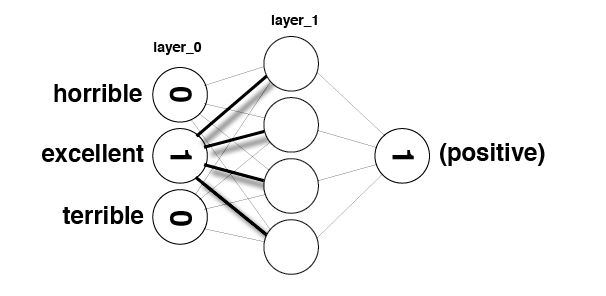

In [129]:
Image(filename='sentiment_network_sparse.png')

In [130]:
def get_most_similar_words(focus = "horrible"):
    most_similar = Counter()

    for word in mlp_full.word2index.keys():
        most_similar[word] = np.dot(mlp_full.weights_0_1[mlp_full.word2index[word]],mlp_full.weights_0_1[mlp_full.word2index[focus]])
    
    return most_similar.most_common()

In [131]:
get_most_similar_words("excellent")

[('excellent', 0.13672950757352467),
 ('perfect', 0.12548286087225943),
 ('amazing', 0.0918276339259997),
 ('today', 0.09022366269441419),
 ('wonderful', 0.08935597696221458),
 ('fun', 0.08750446667420685),
 ('great', 0.08714175888229203),
 ('best', 0.08581088561788058),
 ('liked', 0.0776976291238434),
 ('definitely', 0.07662878140696602),
 ('brilliant', 0.07342385876927904),
 ('loved', 0.07328542892812213),
 ('favorite', 0.07278113603616077),
 ('superb', 0.07173620717850505),
 ('fantastic', 0.07092219191626618),
 ('job', 0.06916061720763406),
 ('incredible', 0.0664240779526144),
 ('enjoyable', 0.06563256050288882),
 ('rare', 0.06481921266261507),
 ('highly', 0.06388945335097053),
 ('enjoyed', 0.06212754610181294),
 ('wonderfully', 0.062055178604090155),
 ('perfectly', 0.061093208811887366),
 ('fascinating', 0.060663547937493845),
 ('bit', 0.059655427045653055),
 ('gem', 0.05951085929615677),
 ('outstanding', 0.058860808147083),
 ('beautiful', 0.05861393470316206),
 ('surprised', 0.058

In [132]:
get_most_similar_words("terrible")

[('worst', 0.1696610725904985),
 ('awful', 0.12026847019691249),
 ('waste', 0.11945367265311008),
 ('poor', 0.09275888757443554),
 ('terrible', 0.09142538719772801),
 ('dull', 0.08420927167822365),
 ('poorly', 0.08124154451604207),
 ('disappointment', 0.08006475962136873),
 ('fails', 0.07859977372333753),
 ('disappointing', 0.07733948548032339),
 ('boring', 0.07712785874801294),
 ('unfortunately', 0.0755024497058591),
 ('worse', 0.0706018353641947),
 ('mess', 0.07056429962359047),
 ('stupid', 0.06948482283254305),
 ('badly', 0.06688890366622863),
 ('annoying', 0.0656870219033742),
 ('bad', 0.06309381453757218),
 ('save', 0.06288059749586576),
 ('disappointed', 0.06269235381207289),
 ('wasted', 0.0613871830280513),
 ('supposed', 0.060985452957725166),
 ('horrible', 0.06012177233938014),
 ('laughable', 0.05869840628546768),
 ('crap', 0.05810452866788461),
 ('basically', 0.05721884036963619),
 ('nothing', 0.05715822004303424),
 ('ridiculous', 0.05690548106893146),
 ('lacks', 0.05576656588

In [133]:
import matplotlib.colors as colors

words_to_visualize = list()
for word, ratio in pos_neg_ratios.most_common(500):
    if(word in mlp_full.word2index.keys()):
        words_to_visualize.append(word)
    
for word, ratio in list(reversed(pos_neg_ratios.most_common()))[0:500]:
    if(word in mlp_full.word2index.keys()):
        words_to_visualize.append(word)

In [134]:
pos = 0
neg = 0

colors_list = list()
vectors_list = list()
for word in words_to_visualize:
    if word in pos_neg_ratios.keys():
        vectors_list.append(mlp_full.weights_0_1[mlp_full.word2index[word]])
        if(pos_neg_ratios[word] > 0):
            pos+=1
            colors_list.append("#00ff00")
        else:
            neg+=1
            colors_list.append("#000000")

In [135]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, random_state=0)
words_top_ted_tsne = tsne.fit_transform(vectors_list)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\least_angle.py:30: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  method='lar', copy_X=True, eps=np.finfo(np.float).eps,
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\least_angle.py:167: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  method='lar', copy_X=True,

In [136]:
p = figure(tools="pan,wheel_zoom,reset,save",
           toolbar_location="above",
           title="vector T-SNE for most polarized words")

source = ColumnDataSource(data=dict(x1=words_top_ted_tsne[:,0],
                                    x2=words_top_ted_tsne[:,1],
                                    names=words_to_visualize,
                                    color=colors_list))

p.scatter(x="x1", y="x2", size=8, source=source, fill_color="color")

word_labels = LabelSet(x="x1", y="x2", text="names", y_offset=6,
                  text_font_size="8pt", text_color="#555555",
                  source=source, text_align='center')
p.add_layout(word_labels)

show(p)

# green indicates positive words, black indicates negative words